# Proyecto Mundi.

## Librerias.
Primero vamos a importar todas las librerias que vamos a utilizar a lo largo del proyecto: 
- Pandas para la carga y modificacion de bases de datos.
- Numpy para el manejo de distintos arrays.
- Matplotlib y sns para la realizacion de diversos graficos.
- Sklearn para todo lo que requiera machine learning.
- Datetime y Calendar para la realizacion de distintas funciones en base a la variable tiempo.
- La libreria stats models para todo lo que es serie de tiempos.
- Pmdarima para correcr el autoarima.
- Warning para graficar.
- Prophet para hacer time series forecasting.

In [1]:
# Importamos las librerias necesarias.
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import pmdarima as pm
import squarify
from scipy import stats
from sklearn import linear_model, datasets
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
import datetime
import calendar
import matplotlib.dates as mdates
from matplotlib.dates import DateFormatter
from fbprophet import Prophet
import plotly.express as px


### Seteo de cuestiones generales.

In [2]:
# register_matplotlib_converters()

# Esto hara que todos nuestros graficos por defecto sean en el formato de seaborn.
sns.set()

# Esto hara que al llamar al dataframe, nos muestre todas las columnas.
pd.set_option("display.max_columns", None)

In [3]:
# Las variables que configuraremos a continuacion, nos ayudaran a mejorar la legibilidad de los axis de los graficos hechos posteriormente.

# Seteamos la variable locator.
locator = mdates.AutoDateLocator(minticks=3, maxticks=7)

# Seteamos la variable formatter.
formatter = mdates.ConciseDateFormatter(locator)

# Seteamos la variable date_form para que nos de el nombre del mes.
date_form = DateFormatter("%b")

In [4]:
# Frecuencias que usaremos para los graficos
freqs =['D','W','M']

# Titulos que usaremos para diferenciar los graficos.
title_graphs = ['Grafico con valores diarios','Grafico con valores semanales','Grafico con valores mensuales']

In [5]:
# Vamos a definir la variable Resto del mundo como todos aquellos paises que no sean USA y MEXICO.
Not_Resto_del_Mundo = ['UNITED STATES OF AMERICA', 'MEXICO']

## Base de Datos.
Vamos a cargar la base de datos con la que vamos a trabajar, como es un csv la funcion de pandas "read_csv" nos va a servir perfectamente para esta tarea, para estar seguros de que sea una carga segura vamos a establecer algunas variables opcionales: 
- El separador sera ',' ;
- Las columnas del mismo vienen con headers, asi que seteamos esta opcion = 0 ;

Opcional: 
- El encoding 'latin1' seria importante considerar por si a futuro tenemos acentos especiales del latin como la ñ para que pueda leer correctamente el csv la funcion. Como en este caso no pasa eso, lo dejamos por defecto.
- Podriamos fijar index_col=0 y fijariamos TAX_ID como el indice. 
- Tambien podriamos establecer Date como index column y activar la funcion parse_date, y ya tendriamos un indice fijado segun la fecha.

Pero primero prefiero analizar la base de datos antes de setear un indice.

### Carga.

Cargaremos el CSV brindado desde Mundi, para hacer distintos analisis en base al mismo y ver que conclusiones podemos obtener.

In [6]:
# Cargamos el csv de mundi.
url = 'https://github.com/Data-Arg/Mundi/raw/main/mundi_data_challenge_2022.csv'
Exportaciones = pd.read_csv(url, sep=',', header=0)

#Revisamos las primeras 5 filas.
Exportaciones.head()

,TAX_ID,DATE,PRODUCT_DESCRIPTION,AMOUNT_USD,DESTINATION_COUNTRY
0,949d5fa4ec6782418fda5a841e1479c8,2021-09-03,MANGUERA DE CAUCHO CON REFUERZO TEXTIL,118170,MEXICO
1,49000cb3c9325f7cdba66c5062ce3ccc,2021-09-30,PALETA DE PLASTICO,1,UNITED STATES OF AMERICA
2,abe1b325d14500ddc774f2141d46637b,2021-09-30,CIRCUITOS MODULARES,216,UNITED STATES OF AMERICA
3,bec208a809498df9383f33067c6afbc3,2021-09-01,CONEXIONES AISLADAS - ROSCADAS,23,UNITED STATES OF AMERICA
4,abe1b325d14500ddc774f2141d46637b,2021-09-06,CAJA DE CARTON CORRUGADO,59,MEXICO


In [7]:
#Revisamos las ultimas 5 filas.
Exportaciones.tail()

,TAX_ID,DATE,PRODUCT_DESCRIPTION,AMOUNT_USD,DESTINATION_COUNTRY
74556,49000cb3c9325f7cdba66c5062ce3ccc,2019-01-08,VALVULA SOLENOIDE,10260,UNITED STATES OF AMERICA
74557,49000cb3c9325f7cdba66c5062ce3ccc,2019-01-15,VALVULA SOLENOIDE,8469,UNITED STATES OF AMERICA
74558,49000cb3c9325f7cdba66c5062ce3ccc,2019-01-25,SPOOL VALVE R70 VCM FR,11385,UNITED STATES OF AMERICA
74559,bec208a809498df9383f33067c6afbc3,2019-01-29,HERRAJES METALICOS,219,UNITED STATES OF AMERICA
74560,abe1b325d14500ddc774f2141d46637b,2019-01-14,TUERCA DE ACERO,18,MEXICO


### Revision.

Ahora que ya tenemos la base de datos cargada, primero que nada vamos a corroborar """la fiabilidad y confianza de la misma""" buscando nulls, errores, outliers y cualquier otro elemento que nos pueda llamar la atencion.

#### Shape

Observamos que nuestro CSV posee 74561 filas y 5 columnas.

In [8]:
# Obtenemos el shape del df.
print(f"Esta base de datos tiene {Exportaciones.shape[0]} filas y {Exportaciones.shape[1]} columnas.")

Esta base de datos tiene 74561 filas y 5 columnas.


#### Periodo
No tenemos fechas fuera del rango 1ro de enero de 2019 al 30 de Septiembre de 2021, lo cual era lo esperado, asi que las fechas estan dentro del rango.

In [9]:
# Vemos el periodo que comprende el df.
print(f"Esta base de datos cubre el periodo desde {Exportaciones['DATE'].min()} al {Exportaciones['DATE'].max()}")

Esta base de datos cubre el periodo desde 2019-01-02 al 2021-09-30


#### Valores Nulos

Nuestro CSV no tiene valores nulos para ninguna variable. En caso de poseer deberiamos analizar a que se deben estos y tratar de solucionarlo, es un paso fundamental antes de continuar con el analisis de cualquier dataset. Aqui podriamos segun el caso realizar lo siguiente: llenar con el ultimo o el siguiente valor, con la media, una media movil, la mediana, dropear esas filas(cuando hay pocos datos es un trade-off muy fuerte hacer esto), preguntarle al cliente o al dataengineer a que se deben estos huecos y si tienen alguna solucion para el mismo. Cada solucion depende segun el caso, y siempre hay que tratar de entender y crear una historia para esos datos faltantes.

In [10]:
# Observamos si tenemos algun valor nulo.
if Exportaciones.isnull().sum().any() == False:
    print("No hay valores nulos")
else:
    print("Existen valores nulos")

No hay valores nulos


#### Valores Unicos

Tenemos 6 empresas (TAX_ID), 789 dias con datos, 3139 distintas descripcion de productos, 18081 distinos valores numericos para los montos de facturacion (AMOUNT_USD) y 25 paises de destino diferentes (DESTINATION_COUNTRY).
- Tener 6 empresas es un numero manejable, sin embargo siempre es de interes hacer analisis tambien agrupados cuando sea posible. Supongamos que 2 empresas sean petroleras y el resto no, teniendo en cuenta que esas van a tener un mercado en comun y van a compartir muchos comportamientos es un analisis interesante el agruparlas para hacer distintos razonamientos. A esta variable la modificaremos para aumentarle legibilidad unicamente.
- Que tengamos 789 dias con datos, en un periodo de 1003 dias, significa que para 214 dias no tiene datos. Esto no significa un error, simplemente que posiblemente nuestro dataset tenga dias sin datos, como pueden ser feriados, fin de semanas, o simplemente dias que no se registraron ventas por distintos motivos.
- Que tengamos 3139 descripciones distintas de productos para una variable categorica la hace muy dificil de trabajar, sobretodo para un dataset de ~70.000 valores. Como posibles teorias seria interesante analizar si capaz el mismo product esta ingresado de distintas maneras, si esta demasiado categorizado (por ejemplo que tengamos tornillo rojo y azul, a fines practicos podriamos ver si es lo mismo). Si nada de esto funcionara tambien podriamos intentar categorizarlos en segmentos mas grandes, por ejemplo si tuvieramos sillas y mesas estas podrian pertenecer a la categoria muebles.
- Tener 25 paises de destino no es un problema, es un numero manejable, sin embargo siempre es interesante ver si los podemos agrupar. En este caso luego los agruparemos en Estados Unidos, Mexico y Resto del mundo, ya que los otros 23 paises tienen una significancia individual menor al 1%. Ojo esto no es una regla fija, puede ser que por mas que sea bajo % nos interese saber que ventas representan, por ejemplo hoy en dia seria interesante saber que % de las ventas van a rusia, porque es muy probable que luego de los bloqueos todas esas ventas bajen drasticamente o sean 0.
- La variable montos de facturacion (AMOUNT_USD) vamos a trabajarla como variable continua, pero tambien podriamos discretizarla para distintos analisis. Supongamos que hagamos cadena de markov o queramos probar algunos analisis de variables categoricas, podriamos ver la posibilidad de que nuestro modelo prediga que caeremos en 'x' cateogria de monto de facturacion. Para cadenas de markov nos facilitaria bastante el proceso en vez de tratarlo como variable continua, discretizarla y plantear las probabilidades de que caiga en las distintas categorias.

In [11]:
# Observamos cuantos valores unicos existen para cada variable.
Exportaciones.nunique()

TAX_ID                     6
DATE                     789
PRODUCT_DESCRIPTION     3139
AMOUNT_USD             18081
DESTINATION_COUNTRY       25
dtype: int64

In [12]:
# Vamos a calcular la diferencia entre los dias que tenemos valores, y la cantidad de dias que tiene el periodo analizado.
print('El periodo que va desde 2019-01-01 al 2021-09-30 posee:', (datetime.date(2021,9,30) - datetime.date(2019,1,1)).days, 'dias.')
print('Sin embargo nuestro dataset tiene valores para: 789 dias.')
print('Es decir que no hay datos para:', (datetime.date(2021,9,30)-datetime.date(2019,1,1) - datetime.timedelta(789)).days, 'dias.')

El periodo que va desde 2019-01-01 al 2021-09-30 posee: 1003 dias.
Sin embargo nuestro dataset tiene valores para: 789 dias.
Es decir que no hay datos para: 214 dias.


#### Analisis Descriptivo

Es interesante siempre ver como se comportan las variables en su analisis descriptivo. Por ejemplo si bien el QR de 75% es 6.264, podemos ver que el valor maximo es 703.010 claramente superior a la mayoria de los valores.

In [13]:
# Datos numericos.
Exportaciones.describe().T

,count,mean,std,min,25%,50%,75%,max
AMOUNT_USD,74561.0,12698.453307,37574.427536,0.0,34.0,666.0,6264.0,703010.0


In [14]:
# Datos categoricos.
Exportaciones.describe(include = "O").T

,count,unique,top,freq
TAX_ID,74561,6,49000cb3c9325f7cdba66c5062ce3ccc,17142
DATE,74561,789,2019-05-21,524
PRODUCT_DESCRIPTION,74561,3139,MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACC...,3808
DESTINATION_COUNTRY,74561,25,UNITED STATES OF AMERICA,57031


#### Paises

Podemos observar que los paises estan cargados correctamente, no hay ningun pais introducido dos veces con diferentes nombres, ni nada por el estilo.
Es importante ver con el value_counts, que cuenta cuantas ordenes fueron a cada pais, que luego de Mexico, el tercer pais es 14 veces inferior y mas de 60 veces inferior a USA en cantidad de ordenes.

In [15]:
# Cantidad de veces que aparece cada pais.
Exportaciones.DESTINATION_COUNTRY.value_counts()

UNITED STATES OF AMERICA                                57031
MEXICO                                                  13786
FRANCE                                                    960
SAUDI ARABIA                                              749
CANADA                                                    557
GERMANY                                                   333
JAPAN                                                     217
POLAND                                                    191
BRAZIL                                                    174
CHINA                                                     153
CZECH REPUBLIC                                            132
UNITED KINGDOM OF GREAT BRITAIN AND NORTHERN IRELAND       90
THAILAND                                                   66
SPAIN                                                      32
REPUBLIC OF KOREA                                          25
PORTUGAL                                                   19
ITALY   

#### Productos

Tenemos demasiados valores unicos de productos, seria interesante intentar ver como podemos trabajar esta variable:
- La primer tarea seria tratar de limpiar por diferencia en mayusculas, guiones o espacios y ver si se reduce la cantidad de variables.
- Luego ver si podemos agrupar productos semejantes introducidos con nombres similares con NLP. 
- Ademas seria interesante hacer Clustering tambien.

In [16]:
# Vemos cuantos valores tiene cada PRODUCT_DESCRIPTION.
Exportaciones.PRODUCT_DESCRIPTION.value_counts()

MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS                      3808
TERMISTOR                                                                  3131
CONTENEDOR DE PLASTICO                                                     2891
VALVULA SOLENOIDE                                                          2522
CHAROLA DE PLASTICO                                                        2248
                                                                           ... 
SENSOR FOTOELECTRICO MARCA:BANNER                                             1
CILINDROS NEUMATICOS MARCA:AURORA SERIE:123130                                1
DESPERDICIOS DE PLASTICO                                                      1
CARRETILLA DE MANIPULACION MARCA:RAYMOND MODELO:RJ-50N SERIE:5114817-14       1
ETIQUETAS ID: 70-1526                                                         1
Name: PRODUCT_DESCRIPTION, Length: 3139, dtype: int64

#### Facturacion

Seria interesante ver si la variable AMOUNT_USD posee errores de carga. Para esto necesitariamos contar con la variable cantidad por orden, para cada producto armaria una columna, del resultado de la division entre monto y cantidad. Luego armaria un array por producto, incluyendo 2 desvios a la izquierda y a la derecha de la media para intentar encontrar outliers e indagar mas sobre los mismos. Otra opcion seria  buscar el precio de los productos en el mercado y ver si corresponde con el analisis de Facturacion / cantidad.

#### Tipos de Variables 
Observamos que de origen teniamos 4 variables object (es decir texto) y una numerica (int64). Las variables de texto siempre se pueden intentar hacer distintos analisis utilizandolas como variable dummies, agrupandolas, entre otros posibles ejercicios.
Podriamos intentar ver como predicen las distintas categorias de productos, pais de destino y empresas a la variable facturacion. Tambien ver la distinta correlacion que tienen entre ellas.

In [17]:
# Los tipos de variables que tenemos en nuestro dataset.
Exportaciones.dtypes

TAX_ID                 object
DATE                   object
PRODUCT_DESCRIPTION    object
AMOUNT_USD              int64
DESTINATION_COUNTRY    object
dtype: object

#### Conclusion, Revision.
- Hay 74561 filas, 5 columnas y 6 empresas como nos planteaba el ejercicio, podemos suponer que la base base de datos esta bien cargada en primera instancia. 
- No hay valores nulos. En caso que hubiera deberiamos ver como solucionarlo, podriamos reemplazar por media general, una media movil, una media calculada especificamente, la mediana/moda, hablar con el cliente o el data engineer sobre porque faltan esos datos, que siginfican y como tratarlos, llenarlos con el last o next value, dropear la fila entera (cuidado con esto cuando hay pocos datos), entre otras posibles tecnicas segun la situacion.

## Creacion de nuevas columnas.

Crearemos nuevas columnas para distintos ejercicios que realizaremos luego.


### Creacion Columna EMPRESAS.
La misma se basa en las 6 empresas que se encuentran en 'TAX_ID' dandoles una numeracion del 1 al 6, para facilitar la lectura. Como esta sera una variable ya existente, solo cambiar los labels vamos a hacerlo en el dataframe original Exportaciones.

In [18]:
# La cantidad de operaciones por cada empresa.
Exportaciones.TAX_ID.value_counts()

49000cb3c9325f7cdba66c5062ce3ccc    17142
6267a77b57d89f4ef110da432722e173    14664
abe1b325d14500ddc774f2141d46637b    13612
949d5fa4ec6782418fda5a841e1479c8    11570
bec208a809498df9383f33067c6afbc3    11344
1aaee72da104ac87925950c847797890     6229
Name: TAX_ID, dtype: int64

In [19]:
# Renombramos las empresas, enumerandolas del 1 al 6.
Exportaciones['EMPRESAS'] = Exportaciones.TAX_ID.map(
                                                    {'49000cb3c9325f7cdba66c5062ce3ccc':1,
                                                    '6267a77b57d89f4ef110da432722e173':2,
                                                    'abe1b325d14500ddc774f2141d46637b':3,
                                                    '949d5fa4ec6782418fda5a841e1479c8':4,
                                                    'bec208a809498df9383f33067c6afbc3':5,
                                                    '1aaee72da104ac87925950c847797890':6}
                                                     )

# Veamos que tengamos 74561 valores no nulos.
Exportaciones.info()

# Aqui podria haber hecho un for loop con Exportaciones.Empresas.unique() y la numeracion in range(1,7), sin embargo prefiero setearlo manualmente por si cambia algo en el dataset y estos valores cambian, podria cambiarnos el orden y sin darnos cuenta nos quedaria todo defasado.

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74561 entries, 0 to 74560
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   TAX_ID               74561 non-null  object
 1   DATE                 74561 non-null  object
 2   PRODUCT_DESCRIPTION  74561 non-null  object
 3   AMOUNT_USD           74561 non-null  int64 
 4   DESTINATION_COUNTRY  74561 non-null  object
 5   EMPRESAS             74561 non-null  int64 
dtypes: int64(2), object(4)
memory usage: 3.4+ MB


In [20]:
# Chequeemos que posea 74561 valores y no tengamos nulos.
Exportaciones.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74561 entries, 0 to 74560
Data columns (total 6 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   TAX_ID               74561 non-null  object
 1   DATE                 74561 non-null  object
 2   PRODUCT_DESCRIPTION  74561 non-null  object
 3   AMOUNT_USD           74561 non-null  int64 
 4   DESTINATION_COUNTRY  74561 non-null  object
 5   EMPRESAS             74561 non-null  int64 
dtypes: int64(2), object(4)
memory usage: 3.4+ MB


#### Conclusion, Columna EMPRESAS.

Esta columna fue creada con fines de aumentar legibilidad a los analisis que realicemos posteriormente, ya que es mucho mas recordar empresas del 1 al 6, que codigos alfanumericos de varios caracteres. Esto permitira hacer un seguimiento mas sencillos de las variables y sus analisis a lo largo del proyecto.

### Creacion columna WEEKDAY.

Esta variable la utilizaremos para ver como se coportaron las ventas segun el dia de la semana. Crearemos un dataframe nuevo para esta columna, el cual sera una copia de Exportaciones, lo denominaremos Exportaciones_Weekday.


In [21]:
# Creamos la columna WEEKDAY basados en el dataframe Exportaciones, a este nuevo le atribuiremos una columna con el nombre del dia obtenido de la columna DATE.
Exportaciones_Weekday = Exportaciones.copy()

# Convertimos DATE a variable datetime.
Exportaciones_Weekday.DATE = pd.to_datetime(Exportaciones_Weekday.DATE)

# Creamos la variable WEEKDAY basados en el nombre del dia.
Exportaciones_Weekday['WEEKDAY'] = Exportaciones_Weekday['DATE'].dt.day_name()

# Chequeemos que posea 74561 valores no nulos.
Exportaciones_Weekday.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74561 entries, 0 to 74560
Data columns (total 7 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   TAX_ID               74561 non-null  object        
 1   DATE                 74561 non-null  datetime64[ns]
 2   PRODUCT_DESCRIPTION  74561 non-null  object        
 3   AMOUNT_USD           74561 non-null  int64         
 4   DESTINATION_COUNTRY  74561 non-null  object        
 5   EMPRESAS             74561 non-null  int64         
 6   WEEKDAY              74561 non-null  object        
dtypes: datetime64[ns](1), int64(2), object(4)
memory usage: 4.0+ MB


In [22]:
# Contabilizamos los valores para cada variable.
Exportaciones_Weekday.WEEKDAY.value_counts()

Wednesday    19821
Tuesday      18858
Thursday     14270
Friday       13670
Monday        6576
Saturday      1358
Sunday           8
Name: WEEKDAY, dtype: int64

In [23]:
# Vamos a hacer un grafico de torta a ver como se comportan la cantidad de ordenes segun el dia de la semana.
fig = px.pie(
            Exportaciones_Weekday.WEEKDAY.value_counts(),
            values = Exportaciones_Weekday.WEEKDAY.value_counts(),
            names = Exportaciones_Weekday.WEEKDAY.value_counts().index,
            title='Cantidad de ordenes por dia de la semana'
            )
fig.show()

#### Conclusion, Columna WEEKDAY.

Podemos observar que si bien hay diferencia a lo largo de los dias de la semana, claramente la venta los fin de semanas son un evento menos frecuente, especialmene los domingos.
De mayor a menor, agrupados por cercania:
- Miercoles y Jueves, ~25-26% cada uno.
- Martes y Viernes, ~18-19% cada uno.
- Lunes ~9%.
- Sabado ~2%.
- Domingos ~0%.

Otro interesante analisis seria generar dummies de los dias de la semana, multiplicarlos por AMOUNT_USD y ver que % representa cada dia segun ventas.


### Variacion columna INDEX.

Modificaremos la columna date, primero le cambiaremos el dtype a datetime, y luego la fijaremos como el index de nuestro nuevo DataFrame Exportaciones_index. Esto lo haremos para todo el trabajo que haremos luego con series de tiempo.

In [24]:
# Creamos un nuevo DataFrame basado en Exportaciones, al cual le atribuiremos un indice.
Exportaciones_index = Exportaciones.copy()

# Previamente, nos aseguramos que la variable DATE, sea formato datetime.
Exportaciones_index['DATE'] = pd.to_datetime(Exportaciones_index['DATE'])

# Seteamos el indice para el DataFrame Exportaciones_index.
Exportaciones_index = Exportaciones_index.set_index('DATE')

# Observemos nuestro nuevo DataFrame.
Exportaciones_index.head()

,TAX_ID,PRODUCT_DESCRIPTION,AMOUNT_USD,DESTINATION_COUNTRY,EMPRESAS
DATE,,,,,
2021-09-03,949d5fa4ec6782418fda5a841e1479c8,MANGUERA DE CAUCHO CON REFUERZO TEXTIL,118170,MEXICO,4
2021-09-30,49000cb3c9325f7cdba66c5062ce3ccc,PALETA DE PLASTICO,1,UNITED STATES OF AMERICA,1
2021-09-30,abe1b325d14500ddc774f2141d46637b,CIRCUITOS MODULARES,216,UNITED STATES OF AMERICA,3
2021-09-01,bec208a809498df9383f33067c6afbc3,CONEXIONES AISLADAS - ROSCADAS,23,UNITED STATES OF AMERICA,5
2021-09-06,abe1b325d14500ddc774f2141d46637b,CAJA DE CARTON CORRUGADO,59,MEXICO,3


In [25]:
# Dropeamos para nuestro DataFrame la columna TAX_ID ya que tenemos Empresas.
Exportaciones_index = Exportaciones_index.drop('TAX_ID', axis=1, errors='ignore')

# Traemos el DataFrame.
Exportaciones_index.head()

,PRODUCT_DESCRIPTION,AMOUNT_USD,DESTINATION_COUNTRY,EMPRESAS
DATE,,,,
2021-09-03,MANGUERA DE CAUCHO CON REFUERZO TEXTIL,118170,MEXICO,4
2021-09-30,PALETA DE PLASTICO,1,UNITED STATES OF AMERICA,1
2021-09-30,CIRCUITOS MODULARES,216,UNITED STATES OF AMERICA,3
2021-09-01,CONEXIONES AISLADAS - ROSCADAS,23,UNITED STATES OF AMERICA,5
2021-09-06,CAJA DE CARTON CORRUGADO,59,MEXICO,3


In [26]:
# Chequeemos que posea 74561 valores y sean no nulos.
Exportaciones_index.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 74561 entries, 2021-09-03 to 2019-01-14
Data columns (total 4 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   PRODUCT_DESCRIPTION  74561 non-null  object
 1   AMOUNT_USD           74561 non-null  int64 
 2   DESTINATION_COUNTRY  74561 non-null  object
 3   EMPRESAS             74561 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 2.8+ MB


#### Conclusion, Columna INDEX.

En esta seccion cambiamos el dtype de DATE to datetime para que la misma sea reconocida como una variable del tiempo. Luego fijamos la misma como el indice de nuestro dataframe Exportaciones_index, esto nos servira para los analisis posteriores en relacion a la variable tiempo.

## Grafico de las variables contra el tiempo.

Analizaremos como se comportaron las variables AMOUNT_USD, CANTIDAD_DE_ORDENES (variable creada en base a las distintas ordenes) y COUNTRY_DESTINATION, contra la variable tiempo para distintas frecuencias temporales.

### AMOUNT_USD, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

Analizaremos la facturacion contra la variable tiempo, para las frecuencias temporales diarias, semanales y mensuales.

In [27]:
# Creamos un nuevo DataFrame basado en Exportaciones_index, el cual utilizaremos para graficar.
Exportaciones_graph = Exportaciones_index.copy()

# Dropeamos la columna empresas ya que no la usaremos en esta seccion.
Exportaciones_graph = Exportaciones_graph.drop('EMPRESAS', axis=1)

# Chequeemos que posea 74561 valores no nulos.
Exportaciones_graph.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 74561 entries, 2021-09-03 to 2019-01-14
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   PRODUCT_DESCRIPTION  74561 non-null  object
 1   AMOUNT_USD           74561 non-null  int64 
 2   DESTINATION_COUNTRY  74561 non-null  object
dtypes: int64(1), object(2)
memory usage: 2.3+ MB


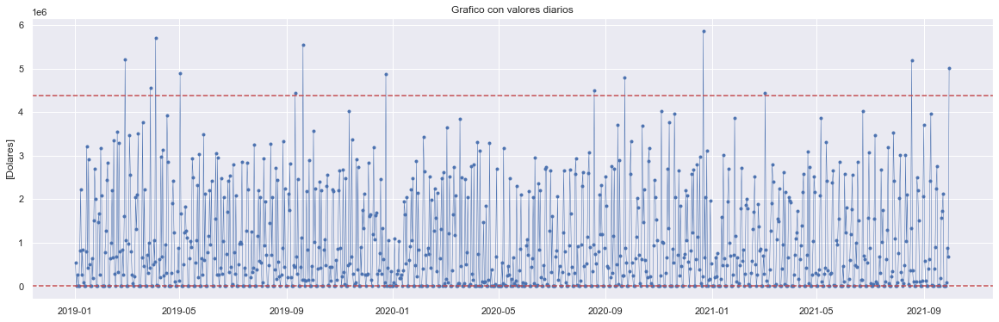

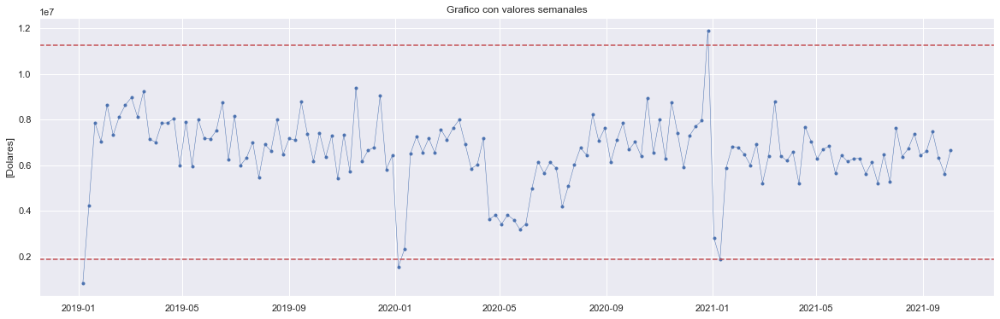

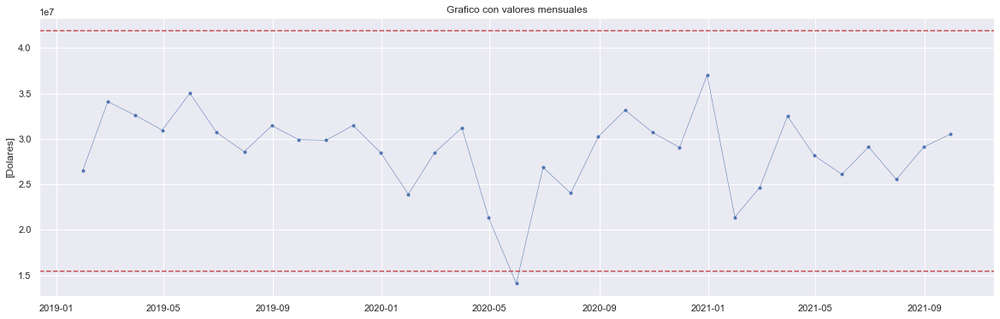

In [28]:
# Iteraremos sobre freqs para las frecuencias y sobre title_exp para los titulos de los graficos.
for freq, title in zip(freqs, title_graphs):
    
    # Vamos a plotear nuestra variable AMOUNT_USD contra la variable tiempo=[dia,semana y mes]
    fig, ax = plt.subplots(figsize=(20, 6))
    ax.plot(
            Exportaciones_graph.resample(freq).sum(),
            marker='.', linestyle='-', linewidth=0.5
            )
    ax.set_title(label=title)
    ax.set_ylabel('[Dolares]')
    
    # Vamos a crear dos franjas, basados en la media para toda la serie, +/- el desvio estandar * 3.
    ax.axhline(                                                                                 # Limite superior
                np.mean(Exportaciones_graph.resample(freq).sum()).AMOUNT_USD +                  # Nuestra media para la serie
                np.std(Exportaciones_graph.resample(freq).sum()).AMOUNT_USD * 3.0,              # +3 desvios estandards
                ls='--', c='r'
                )

    # El np.where aparece como condicional para que en el grafico de frequencia diaria, la franja inferior no aparezca en valores negativos lo cual no tiene sentido.
    ax.axhline(                                                                                         # Limite inferior
                np.where(                                                                               # Condicional para evitar valores negativos
                        (np.mean(Exportaciones_graph.resample(freq).sum()).AMOUNT_USD -            
                         np.std (Exportaciones_graph.resample(freq).sum()).AMOUNT_USD * 3) 
                                                                                            > 0,        # La condicion
                         np.mean(Exportaciones_graph.resample(freq).sum()).AMOUNT_USD -
                         np.std (Exportaciones_graph.resample(freq).sum()).AMOUNT_USD * 3,               # Nos devuelve nuestra ecuacion cuando se cumple.
                         0),                                                                            # Cuando la franja inferior no sea mayor a 0, nos devuelve 0.
                         ls='--', c='r')
    plt.show()


#### Analisis descriptivo de los graficos, AMOUNT_USD, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

In [29]:
for freq in freqs:
    print(
        '\n El analisis descriptivo para el resampling "{}": \n'.format(freq),
        Exportaciones_graph.resample(freq).sum().describe(),
        '\n y su coeficiente de variacion es:',
        *(np.std(Exportaciones_graph.resample(freq).sum()) / np.mean(Exportaciones_graph.resample(freq).sum()))
        )



 El analisis descriptivo para el resampling "D": 
          AMOUNT_USD
count  1.003000e+03
mean   9.439774e+05
std    1.144961e+06
min    0.000000e+00
25%    1.582500e+03
50%    4.516990e+05
75%    1.637838e+06
max    5.860524e+06 
 y su coeficiente de variacion es: 1.2123064136248072

 El analisis descriptivo para el resampling "W": 
          AMOUNT_USD
count  1.440000e+02
mean   6.575065e+06
std    1.567990e+06
min    8.162520e+05
25%    6.024105e+06
50%    6.642346e+06
75%    7.405291e+06
max    1.190190e+07 
 y su coeficiente de variacion es: 0.2376457178516797

 El analisis descriptivo para el resampling "M": 
          AMOUNT_USD
count  3.300000e+01
mean   2.869119e+07
std    4.474617e+06
min    1.407021e+07
25%    2.652354e+07
50%    2.912630e+07
75%    3.122048e+07
max    3.702656e+07 
 y su coeficiente de variacion es: 0.15357669721653583


#### Modificacion grafico diario, AMOUNT_USD, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

Para varios dias el valor es 0, vamos a intentar ve si el grafico mejora sacando los null values.

In [30]:
# Creamos un nuevo dataframe basado en Exportaciones_graph, vamos a dropear los dias que tengan valores = 0.
df_sampled_D = Exportaciones_graph.resample('D').sum()

# Reemplazamos los valores 0 por NaN.
df_sampled_D = df_sampled_D[df_sampled_D.AMOUNT_USD != 0]

# Traigamos las primeras 5 filas del dataframe.
df_sampled_D.head()

,AMOUNT_USD
DATE,
2019-01-02,541028
2019-01-03,9792
2019-01-04,265432
2019-01-07,816034
2019-01-08,2225421


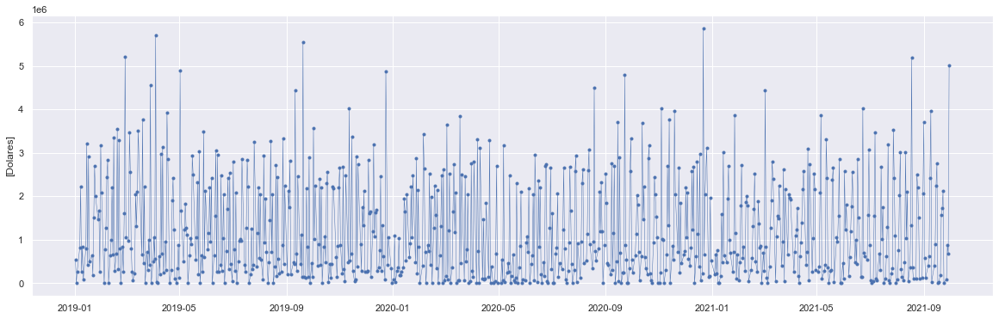

In [31]:
# Ploteamos el grafico diario de AMOUNT_USD sin null values.
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(
        df_sampled_D,
        marker='.', linestyle='-', linewidth=0.5
        )
ax.set_ylabel('[Dolares]')
plt.show()

In [32]:
"""Si bien mejora el aspecto un poco, creo que es muy dificil obtener algun insight a simple vista con los valores diarios."""

'Si bien mejora el aspecto un poco, creo que es muy dificil obtener algun insight a simple vista con los valores diarios.'

#### Media semanal y mensual, AMOUNT_USD, RESAMPLING DAILY, WEEKLY Y MONTHLY.

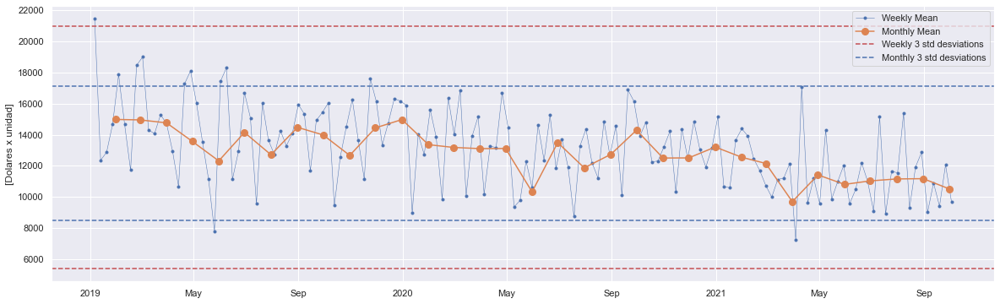

In [33]:
# Seteamos el tamaño y el formato de los subplots.
fig, ax = plt.subplots(figsize=(20, 6))

# Ploteamos el grafico de media semanal de AMOUNT_USD.
ax.plot(
        Exportaciones_index['AMOUNT_USD'].resample('W').mean(),
        marker='.', linestyle='-', linewidth=0.5, label='Weekly Mean'
        )

# Ploteamos el grafico de media mensual de AMOUNT_USD.
ax.plot(
        Exportaciones_index['AMOUNT_USD'].resample('M').mean(),
        marker='o', markersize=8, linestyle='-', label='Monthly Mean'
        )

# Seteamos el label para el eje y.
ax.set_ylabel('[Dolares x unidad]')

# En rojo, vamos a crear dos franjas, basados en la media semanal para toda la serie, +/- el desvio estandar * 3.
ax.axhline(
            np.mean(Exportaciones_index['AMOUNT_USD'].resample('W').mean()) +
            np.std(Exportaciones_index['AMOUNT_USD'].resample('W').mean()) * 3.0,
                    ls='--', c='r', label='Weekly 3 std desviations'
            )
ax.axhline(
            np.mean(Exportaciones_index['AMOUNT_USD'].resample('W').mean()) -
            np.std(Exportaciones_index['AMOUNT_USD'].resample('W').mean()) * 3.0,
                    ls='--', c='r'
            )

# En azul, vamos a crear dos franjas, basados en la media mensual para toda la serie, +/- el desvio estandar * 3.
ax.axhline(                                                                             # Limite superior
            np.mean(Exportaciones_index['AMOUNT_USD'].resample('M').mean()) +           # La media de nuestra serie
            np.std(Exportaciones_index['AMOUNT_USD'].resample('M').mean()) * 3.0,       # +3 desvios estandar
            ls='--', c='b', label='Monthly 3 std desviations'
            )
ax.axhline(                                                                              # Limite inferior
            np.mean(Exportaciones_index['AMOUNT_USD'].resample('M').mean()) -            # La media de nuestra serie
            np.std(Exportaciones_index['AMOUNT_USD'].resample('M').mean()) * 3.0,        # -3 desvios estandar
            ls='--', c='b'
            )

# Seteamos el formato de nuestra axis x, utilizando las variables previamente definidas formatter y date_form.
ax.xaxis.set_major_formatter(formatter)
ax.xaxis.set_minor_formatter(date_form)

# Hacemos visible la leyenda.
ax.legend()

#### Conclusion, AMOUNT_USD, RESAMPLING DAILY, WEEKLY Y MONTHLY.

Conclusiones extraidas del grafico con valores diarios: 

- En el diario sin valores nulos no podemos sacar muchos insights, mas alla de que las ventas poseen una gran variacion a lo largo de los dias de la semana y a lo largo del tiempo del año.

Conclusiones extraidas del grafico con valores semanales: 
- Podemos observar que a principio de año las ventas son bajas, si bien tenemos informacion continua solo para 2 años (ya que arranca en 2019 y no sabemos como venian en 2018). 

- La media se encuentra encerrada en general en un rango menor es decir con una varianza menor, y ese rango es inferior ya que va desde los 60.000 dolares a los 80.000 dolares, aunque no es tan respetado como el rango que habiamos fijado para el grafico diario, lo cual tiene sentido porque es un rango notablemente inferior.

Conclusiones extraidas del grafico con valores mensuales: 
- En este grafico ya no es tan visible que las ventas suban a fin de año y bajan a principio de año. Capaz si para 2021 pero no para 2020.

- Podemos observar una caida aproximadamente en Abril, Mayo y Junio 2020, esto muy probablemente este relacionado con el COVID-19, y los rezagos de las distintas empresas para reflejar este shock.

Conclusiones extraidas del grafico con media semanal y mensual:
- Podemos observar que las medias semanales tienen una variacion notablemente mayor que la mensual. En la media mensual al englobarlo estos datos, no se nota la presencia de esta varianza semanal.  

Estos analisis a nivel agregado los dejaremos aqui, dado que a nivel agregado es una agrupacion de empresas que seguramente fueron respondiendo de distintas maneras a distintos estimulos, entonces puede ser que haya distinto shocks de fondo para cada empresa e incluso otros shocks que estan tapados al verlo a nivel general 
(Por ejemplo si 'x' empresa cayeron sus ventas pero 'y' tuvo un efecto contrario, estos efectos pueden contrarestarse aunque sea parcialmente y a nivel agregado no percirbise ningun cambio). Por eso para entender estos puntos que fuimos marcando, me parece siempre mas productivo tratar de entender/crear las historias individualmente que le fue pasando a cada empresa.


### CANTIDAD_DE_ORDENES, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

Cantidad de Ordenes se refiere respecto a productos, y cada valor corresponde a una entrada. Es poseemos la informacion para asumir la cantidad de ordenes incluida en una misma orden, asi que todas seran = 1.
Estas las analizaremos en las frecuencias temporales diarias, semanales y mensuales.

In [34]:
# Vamos a crear un nuevo dataframe, en este contaremos la cantidad de ordenes.
Exportaciones_graph_2 = Exportaciones_index.copy()

# Como cada fila es una orden, simplemente todos nuestros valores seran = 1.
Exportaciones_graph_2['CANTIDAD_DE_ORDENES'] = 1

# Dropearemos las columnas que no utilizaremos.
Exportaciones_graph_2.drop(columns=['AMOUNT_USD','EMPRESAS'], inplace=True, errors='ignore')

# Observemos que nuestro dataframe tenga 74561 valores no nulos.
Exportaciones_graph_2.info()


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 74561 entries, 2021-09-03 to 2019-01-14
Data columns (total 3 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   PRODUCT_DESCRIPTION  74561 non-null  object
 1   DESTINATION_COUNTRY  74561 non-null  object
 2   CANTIDAD_DE_ORDENES  74561 non-null  int64 
dtypes: int64(1), object(2)
memory usage: 2.3+ MB


In [35]:
Exportaciones_graph_2.resample(freq).sum().mean().CANTIDAD_DE_ORDENES

2259.4242424242425

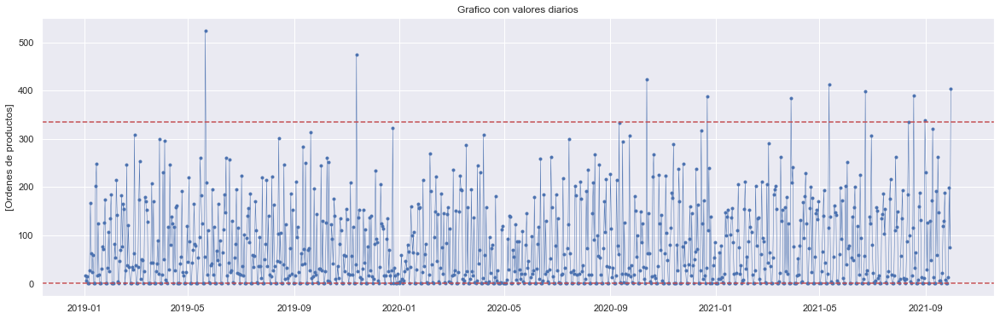

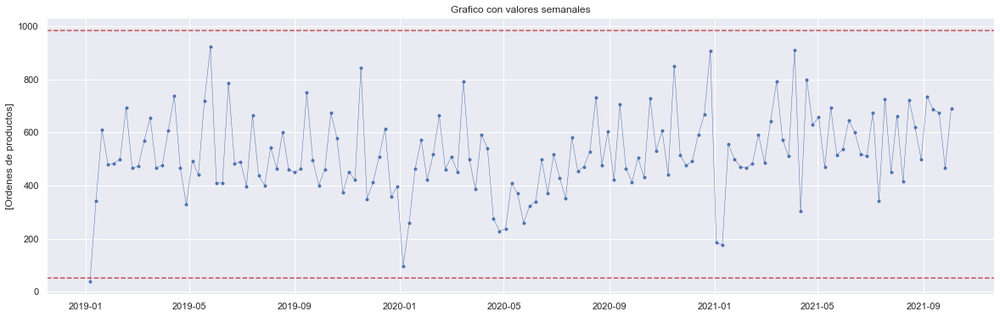

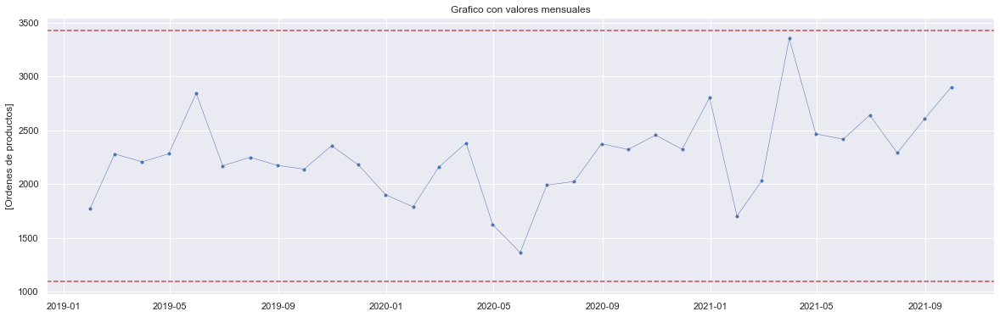

In [36]:
# Iteraremos sobre freqs para las frecuencias y sobre title_exp para los titulos de los graficos.
for freq, title in zip(freqs, title_graphs):
    
    # Vamos a plotear nuestra variable AMOUNT_USD contra la variable tiempo=[dia,semana y mes]
    fig, ax = plt.subplots(figsize=(20, 6))
    ax.plot(
            Exportaciones_graph_2.resample(freq).sum(),
            marker='.', linestyle='-', linewidth=0.5
            )
    ax.set_title(label=title)
    ax.set_ylabel('[Ordenes de productos]')

    # Vamos a crear dos franjas, basados en la media para toda la serie, +/- el desvio estandar * 3.
    ax.axhline(                                                                                     # Limite superior
                np.mean(Exportaciones_graph_2.resample(freq).sum()).CANTIDAD_DE_ORDENES +                    # La media de nuestra serie
                np.std (Exportaciones_graph_2.resample(freq).sum()).CANTIDAD_DE_ORDENES * 3.0,                # +3 desvios estandards
                ls='--', c='r'
                )

    # El np.where aparece como condicional para que en el grafico de frequencia diaria, la franja inferior no aparezca en valores negativos lo cual no tendria sentido.
    ax.axhline(                                                                                     # Limite inferior
                np.where(                                                                           # Condicional para no tener nuestra franja en valores negativos
                        (np.mean(Exportaciones_graph_2.resample(freq).sum()).CANTIDAD_DE_ORDENES -           # La media de nuestra serie
                         np.std (Exportaciones_graph_2.resample(freq).sum()).CANTIDAD_DE_ORDENES * 3          # -3 desvios estandards
                         ) > 0,                                                                     # La condicion es que el resultado sea mayor a 0
                         (np.mean(Exportaciones_graph_2.resample(freq).sum()).CANTIDAD_DE_ORDENES -
                          np.std (Exportaciones_graph_2.resample(freq).sum()).CANTIDAD_DE_ORDENES * 3),        # Nos devuelve nuestra ecuacion cuando se cumple la condicion
                         0                                                                          # Cuando la franja inferior no sea mayor a 0, nos devuelve 0
                         ),                                                                         # Cerramos el np.where
                         ls='--', c='r'
                )
    
    plt.show()

#### Analisis descriptivo de los graficos, CANTIDAD_DE_ORDENES, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

In [37]:
for freq in freqs:
    print(  
        '\n El analisis descriptivo para el resampling "{}": \n'.format(freq),
        Exportaciones_graph_2.resample(freq).sum().describe(),
        '\n y su coeficiente de variacion es:',
        *(np.std(Exportaciones_graph_2.resample(freq).sum()) / np.mean(Exportaciones_graph_2.resample(freq).sum())) # Nuestro coefieciente de variacion.
        )



 El analisis descriptivo para el resampling "D": 
        CANTIDAD_DE_ORDENES
count          1003.000000
mean             74.337986
std              86.803541
min               0.000000
25%               2.000000
50%              36.000000
75%             129.000000
max             524.000000 
 y su coeficiente de variacion es: 1.1671053088331673

 El analisis descriptivo para el resampling "W": 
        CANTIDAD_DE_ORDENES
count           144.000000
mean            517.784722
std             155.947820
min              38.000000
25%             431.250000
50%             494.500000
75%             611.750000
max             922.000000 
 y su coeficiente de variacion es: 0.3001351420483415

 El analisis descriptivo para el resampling "M": 
        CANTIDAD_DE_ORDENES
count            33.000000
mean           2259.424242
std             395.136450
min            1363.000000
25%            2029.000000
50%            2280.000000
75%            2416.000000
max            3352.000000 
 y s

#### Modificacion grafico diario, CANTIDAD_DE_ORDENES, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

Seguiremos un procedimiento parecido al que hicimos en AMOUNT_USD dado que el grafico con valores diarios es dificil de interpretar, asi que eliminare los null values para mejorar la legibilidad.

In [38]:
# Creamos un nuevo dataframe, en el cual dropearemos los valores nulos.
Cantidad_de_ordenes_D = Exportaciones_graph_2.resample('D').sum()

# Filtramos nuestro dataframe por valores distintos a 0.
Cantidad_de_ordenes_D = Cantidad_de_ordenes_D[Cantidad_de_ordenes_D.CANTIDAD_DE_ORDENES != 0]

# Traigamos las primeras 5 filas del dataframe.
Cantidad_de_ordenes_D.head()

,CANTIDAD_DE_ORDENES
DATE,
2019-01-02,16
2019-01-03,7
2019-01-04,15
2019-01-07,28
2019-01-08,167


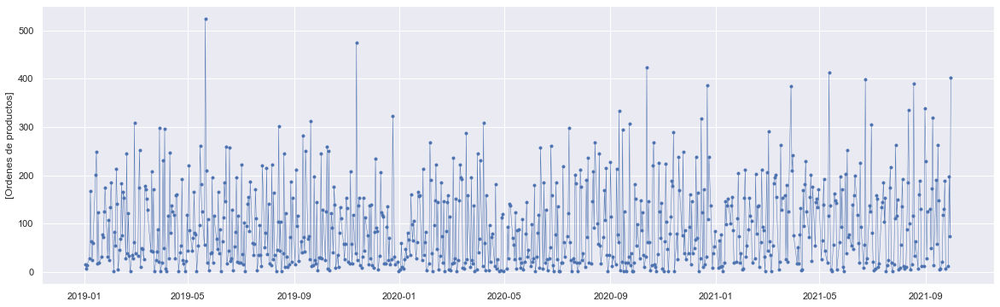

In [39]:
# Grafico de la cantidad de ordenes, frecuencia diaria sin null values.
fig, ax = plt.subplots(figsize=(20, 6))
ax.plot(
        Cantidad_de_ordenes_D,marker='.',
        linestyle='-', linewidth=0.5
        )
ax.set_ylabel('[Ordenes de productos]')
plt.show()

In [40]:
"""Sigue sin ser claro ninguna tendencia, patrones o cualquier insight que se quiera sacar a simple vista."""

'Sigue sin ser claro ninguna tendencia, patrones o cualquier insight que se quiera sacar a simple vista.'

#### Media semanal y mensual, CANTIDAD_DE_ORDENES, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

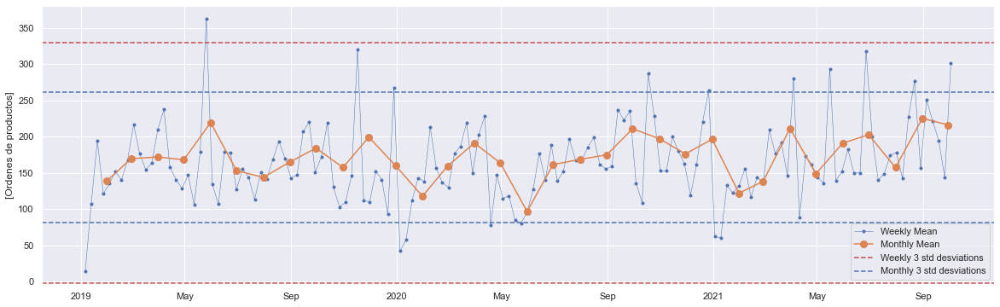

In [41]:
# Seteamos el tamaño y el formato de los subplots.
fig, ax = plt.subplots(figsize=(20, 6))

# Ploteamos el grafico de media semanal de CANTIDAD_DE_OPERACIONES.
ax.plot(
        Exportaciones_graph_2.groupby('DATE')['CANTIDAD_DE_ORDENES'].transform('count').resample('W').mean(),
        marker='.', linestyle='-', linewidth=0.5, label='Weekly Mean'
        )

# Ploteamos el grafico de media mensual de CANTIDAD_DE_OPERACIONES.
ax.plot(
        Exportaciones_graph_2.groupby('DATE')['CANTIDAD_DE_ORDENES'].transform('count').resample('M').mean(),
        marker='o', markersize=8, linestyle='-', label='Monthly Mean'
        )

# En rojo, vamos a crear dos franjas, basados en la media semanal para toda la serie, +/- el desvio estandar * 3.
ax.axhline(                                                                                                                             # Limite superior
            np.mean(Exportaciones_graph_2.groupby('DATE')['CANTIDAD_DE_ORDENES'].transform('count').resample('W').mean()) +             # La media de nuestra serie
            np.std (Exportaciones_graph_2.groupby('DATE')['CANTIDAD_DE_ORDENES'].transform('count').resample('W').mean()) * 3.0,        # +3 desvios estandard
            ls='--', c='r', label='Weekly 3 std desviations'
            )
ax.axhline(                                                                                                                             # Limite inferior
            np.mean(Exportaciones_graph_2.groupby('DATE')['CANTIDAD_DE_ORDENES'].transform('count').resample('W').mean()) -             # La media de nuestra serie
            np.std (Exportaciones_graph_2.groupby('DATE')['CANTIDAD_DE_ORDENES'].transform('count').resample('W').mean()) * 3.0,        # -3 desvos estandard
            ls='--', c='r'
            )

# En azul, vamos a crear dos franjas, basados en la media mensual para toda la serie, +/- el desvio estandar * 3.
ax.axhline(                                                                                                                             # Limite superior
            np.mean(Exportaciones_graph_2.groupby('DATE')['CANTIDAD_DE_ORDENES'].transform('count').resample('M').mean()) +             # La media de nuestra serie
            np.std (Exportaciones_graph_2.groupby('DATE')['CANTIDAD_DE_ORDENES'].transform('count').resample('M').mean()) * 3.0,        # +3 desvios estandard
            ls='--', c='b', label='Monthly 3 std desviations'
            )
ax.axhline(                                                                                                                             # Limite inferior
            np.mean(Exportaciones_graph_2.groupby('DATE')['CANTIDAD_DE_ORDENES'].transform('count').resample('M').mean()) -             # La media de nuestra serie
            np.std (Exportaciones_graph_2.groupby('DATE')['CANTIDAD_DE_ORDENES'].transform('count').resample('M').mean()) * 3.0,        # -3 desvos estandard
            ls='--', c='b'
            )

# Seteamos el label para el eje y.
ax.set_ylabel('[Ordenes de productos]')

# Seteamos el formato de nuestra axis x, utilizando las variables previamente definidas formatter y date_form.
ax.xaxis.set_major_formatter(formatter)
ax.xaxis.set_minor_formatter(date_form)

# Hacemos visible la leyenda.
ax.legend()

#### Conclusion, CANTIDAD_DE_ORDENES, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

Conclusiones del grafico diario:
- Aqui es dificil conseguir algun insight del mismo. 

Conclusiones del grafico semanal:
- Podemos observar que se repite la tendencia de caida en los eneros y subidas en los ultimos dias de diciembre, sin embargo aca la variacion es menor.

Conclusiones del grafico mensual:
- Aqui vemos una caida en el periodo Marzo - Junio de 2021, probablemente a efectos de COVID-19 con rezago debidos a las caracteristicas de las industrias que componena a las empresas.

Conclusiones del grafico de medias semanales y mensuales:
- Intuimos que la varianza semanal no es tan grande como en AMOUNT_USD, pero si podemos ver que hay semanas que sobresalen del resto cambiando la varianza.

Conclusiones generales:
- Las variaciones extremas de la cantidad de ordenes pareciera menor a simple vista. Una h1 para esto es que en los picos altos y bajos de facturacion, son semenjantes la cantidad de ordenes pero con menor o mayor cantidad de productos dentro de la orden y por eso los montos fluctuan mas que la cantidad de ordenes.

- Sin embargo si miramos el coeficiente de variacion, es mayor para los valores semanales y mensuales, es solo ligeramente inferior en frecuencia diaria. De aqui podriamos inferir h2: que hay menos variaciones grandes, pero que hay mas variacion a lo largo de la serie cotidianamente.

- ?Por que digo que hay menos variaciones grandes, pero mas variaciones pequeñas? Porque en el grafico podemos ver que hay menos datos que se alejen demasiado de la media y se acercen a las franjas rojas, pero sin embargo su coeficiente de variacion es mayor, lo cual apoyaria a h2.



Estos analisis los dejaremos a nivel superficial, iremos en mayor profundidad cuando desagregemos a nivel empresas individualmente.

### COUNTRY_DESTINATION, AMOUNT_USD y CANTIDAD_DE_ORDENES

Analizaremos las exportaciones segun pais de destino, dividido en facturacion (AMOUNT_USD) y cantidad de ordenes (CANTIDAD_DE_ORDENES).

#### COUNTRY_DESTINATION, AMOUNT_USD, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

Vamos a analizar como se analizan los montos de facturacion por pais de destino, para las frecuencias de tiempo diaria, semanal y mensual.

In [42]:
# Vamos a crear un nuevo dataframe, en este contaremos la cantidad de ordenes segun pais de destino.
Exportaciones_graph_3 = Exportaciones_index.copy()

# Todo pais que no sea Estados Unidos y Mexico, lo reclasificare como 'RESTO DEL MUNDO'. Esto se debe a la relevancia del resto de los paises que considero no significativa, entonces para darle mas poder visual al grafico los agrupo.
Exportaciones_graph_3.loc[~Exportaciones_graph_3['DESTINATION_COUNTRY'].isin(Not_Resto_del_Mundo), 'DESTINATION_COUNTRY'] = 'RESTO DEL MUNDO'

# Dropearemos las columnas que no utilizaremos.
Exportaciones_graph_3.drop(columns=['EMPRESAS','PRODUCT_DESCRIPTION'], inplace=True, errors='ignore')

# Observemos que nuestra columna DESTINATION_COUNTRY tenga 3 valores unicos.
print(f"La columna DESTINATION_COUNTRY tiene los siguientes valores:", *Exportaciones_graph_3.DESTINATION_COUNTRY.unique(), "\n", sep ='\n')

# Observemos que nuestro dataframe tenga 74561 valores.
print(Exportaciones_graph_3.info())

La columna DESTINATION_COUNTRY tiene los siguientes valores:
MEXICO
UNITED STATES OF AMERICA
RESTO DEL MUNDO


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 74561 entries, 2021-09-03 to 2019-01-14
Data columns (total 2 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   AMOUNT_USD           74561 non-null  int64 
 1   DESTINATION_COUNTRY  74561 non-null  object
dtypes: int64(1), object(1)
memory usage: 1.7+ MB
None


In [43]:
# Cambiamos el tipo de DESTINATION_COUNTRY a categorico.
Exportaciones_graph_3 = Exportaciones_graph_3.astype({'DESTINATION_COUNTRY':'category'})

# Generamos dummies de nuestros posibles destinos (Estados Unidos, Mexico y Resto del mundo).
Exportaciones_graph_3 = pd.get_dummies(Exportaciones_graph_3)

# Por legilibidad cambiamos el nombre de nuestras nuevas columnas.
Exportaciones_graph_3.rename(
                            columns={
                                   'DESTINATION_COUNTRY_MEXICO':'MEXICO',
                                   'DESTINATION_COUNTRY_RESTO DEL MUNDO':'RESTO DEL MUNDO',
                                   'DESTINATION_COUNTRY_UNITED STATES OF AMERICA':'UNITED STATES OF AMERICA'
                                   },
                            inplace=True
                            )

# Veamos como quedaron las columnas.
Exportaciones_graph_3.columns

Index(['AMOUNT_USD', 'MEXICO', 'RESTO DEL MUNDO', 'UNITED STATES OF AMERICA'], dtype='object')

In [44]:
# Iteramos para multiplicar cada columna binaria por el monto facturado.
for column in Exportaciones_graph_3.columns[1:]:
    Exportaciones_graph_3[column] = Exportaciones_graph_3[column] * Exportaciones_graph_3.AMOUNT_USD

# Dropearemos las columnas que no utilizaremos.
Exportaciones_graph_3.drop(columns=['AMOUNT_USD'], inplace=True, errors='ignore')

# Traemos nuestro Dataframe a ver como quedo.
Exportaciones_graph_3.head()

,MEXICO,RESTO DEL MUNDO,UNITED STATES OF AMERICA
DATE,,,
2021-09-03,118170,0,0
2021-09-30,0,0,1
2021-09-30,0,0,216
2021-09-01,0,0,23
2021-09-06,59,0,0


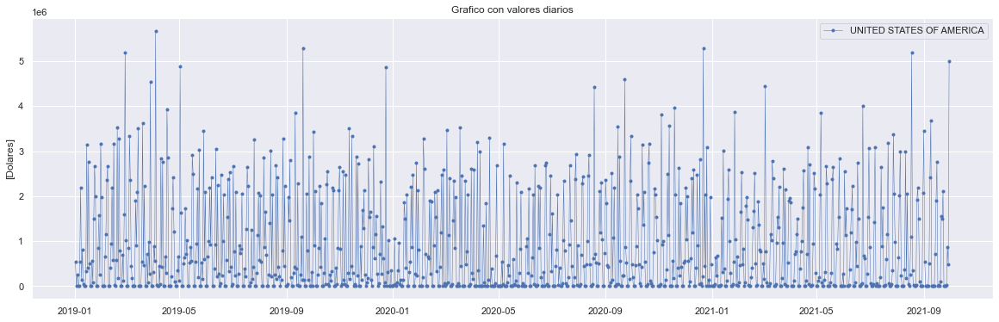

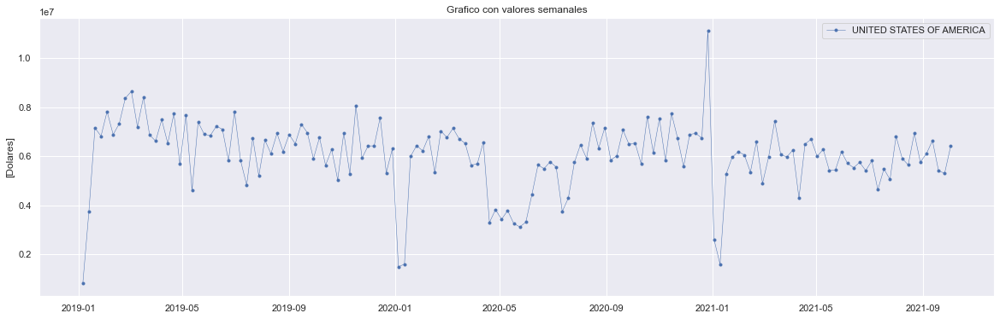

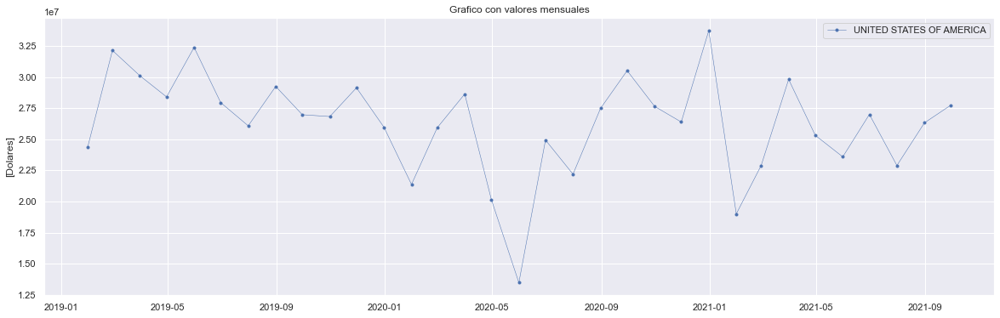

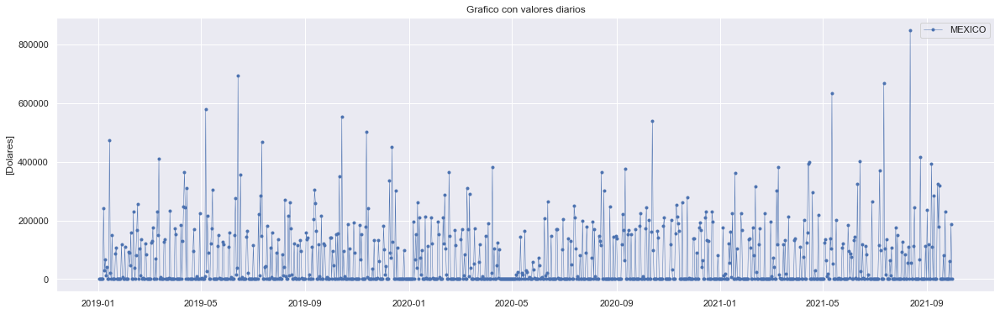

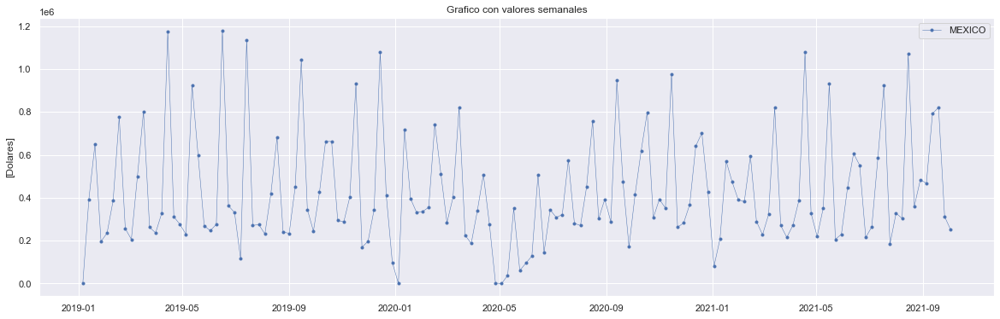

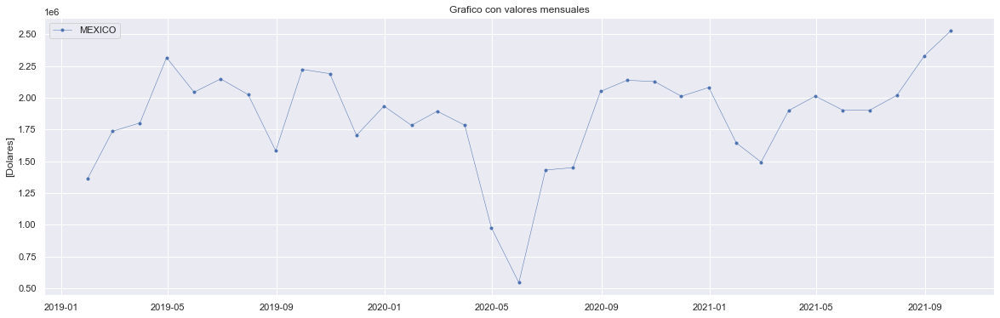

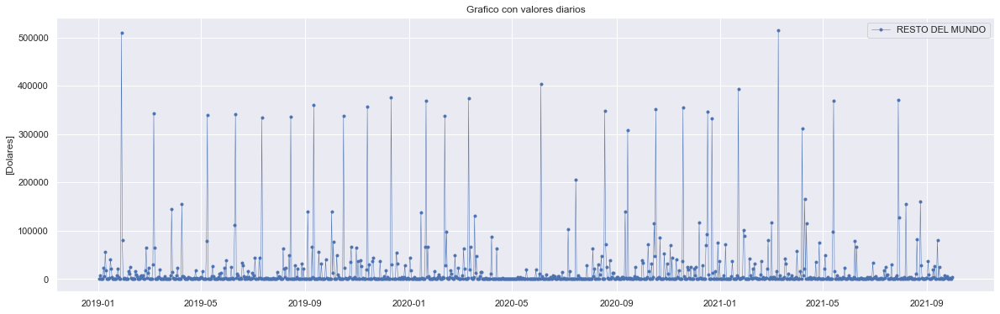

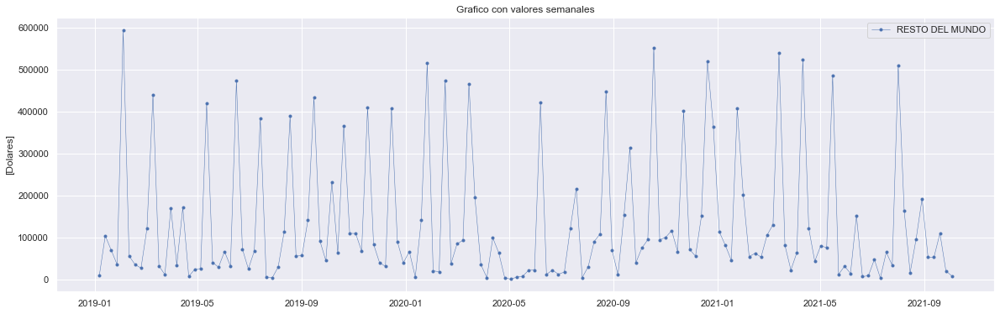

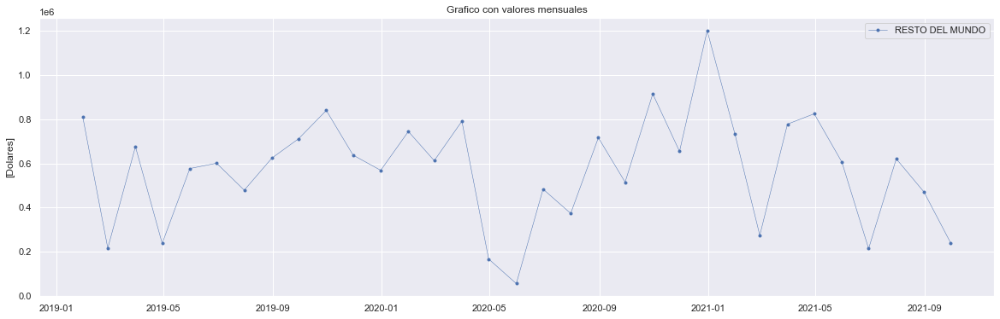

In [45]:
# Iteraremos sobre freqs para las frecuencias y sobre title_exp para los titulos de los graficos.
for columna in Exportaciones_graph_3.sum().sort_values(ascending=False).index:  # Iteramos sobre los distintos posibles destinos, en orden decreciente segun facturacion.
       for freq, title in zip(freqs, title_graphs):
    
              # Vamos a plotear nuestra variable AMOUNT_USD contra la variable tiempo=[dia,semana y mes], para las 3 variables de destino=[USA,MEXICO y RESTO DEL MUNDO]
              fig, ax = plt.subplots(figsize=(20, 6))

              # Es una iteracion primero sobre columnas, luego sobre freq y title.
              ax.plot(
                     Exportaciones_graph_3[columna].resample(freq).sum(),
                     marker='.', linestyle='-', linewidth=0.5, label=Exportaciones_graph_3[columna].name
                     )
              ax.set_title(label=title)
              ax.legend()
              ax.set_ylabel('[Dolares]')
              plt.show()

##### Analisis Descriptivo, COUNTRY_DESTINATION, AMOUNT_USD, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

In [46]:
# Vamos a iterar para hacer el analisis descriptivo de los 3 graficos.
for freq in freqs:
       print(
              '\n Analisis descriptivo para la frecuencia {} \n'.format(freq),
              Exportaciones_graph_3.resample(freq).sum().describe(),                                            # Analisis descriptivo
              '\n cv',                                                                                          # Coeficiente de variacion
              *Exportaciones_graph_3.resample(freq).sum().describe().loc['std'] / Exportaciones_graph_3.resample(freq).sum().describe().loc['mean'] # std / media
              )



 Analisis descriptivo para la frecuencia D 
               MEXICO  RESTO DEL MUNDO  UNITED STATES OF AMERICA
count    1003.000000      1003.000000              1.003000e+03
mean    60896.373878     18920.860419              8.641602e+05
std    105124.269818     60823.596326              1.121211e+06
min         0.000000         0.000000              0.000000e+00
25%         0.000000         0.000000              6.600000e+01
50%         0.000000       914.000000              3.147640e+05
75%    110602.500000      6584.500000              1.537220e+06
max    848992.000000    515037.000000              5.673493e+06 
 cv 1.7262812729705688 3.2146316277504825 1.297456946280146

 Analisis descriptivo para la frecuencia W 
              MEXICO  RESTO DEL MUNDO  UNITED STATES OF AMERICA
count  1.440000e+02       144.000000              1.440000e+02
mean   4.241602e+05    131789.048611              6.019116e+06
std    2.659738e+05    156310.572163              1.426696e+06
min    0.000000e+00

##### Totales para todo el periodo, COUNTRY_DESTINATION, AMOUNT_USD, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

In [47]:
# Vamos a ver la sumatoria segun facturacion por destino.
Exportaciones_graph_3.sum()

MEXICO                       61079063
RESTO DEL MUNDO              18977623
UNITED STATES OF AMERICA    866752691
dtype: int64

In [48]:
# Vamos a graficar la sumatoria segun facturacion por destino.
fig = px.pie(data_frame=Exportaciones_graph_3.sum(), names=Exportaciones_graph_3.sum().index,values=Exportaciones_graph_3.sum())
fig.show()

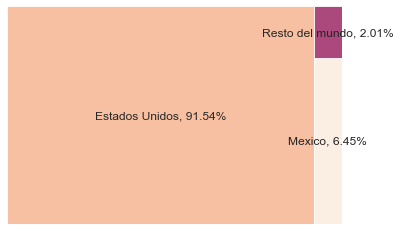

In [49]:
# Hagamos un heatmap de los destinos de exportacion segun facturacion.
squarify.plot(sizes=np.array([0.9154, 0.0645, (1 - np.sum([0.9154, 0.0645]))]), label=['Estados Unidos, 91.54%', 'Mexico, 6.45%', 'Resto del mundo, 2.01%'], alpha=.8 )
plt.axis('off')
plt.show()

##### Conclusion, COUNTRY_DESTINATION, AMOUNT_USD, RESAMPLING DAILY, WEEKLY Y MONTHLY.

Conclusiones de los graficos diarios:
- Tenemos muchos valores nulos, o dias sin valores, en especial para Resto del Mundo y Mexico.

- En el grafico de Estados Unidos es muy notable el efecto covid aun para frecuencia diaria, en los meses de Abril y Mayo 2020. Para Mexico y Resto del mundo tambien es visible aunque no con tanta facilidad.

- Para la mayor parte del periodo para los 3 posibles destinos, es mas o menos estable los montos facturables. Incluso en Mexico y Resto del mundo donde hay pocos valores, pareciera que la distancia es equisdistante. Aqui podriamos suponer que son ordenes pre-progamadas de ventas o que es un proceso bastante estable donde cada 'x' cantidad de tiempo necesitan reposicion.

Conclusiones de los graficos semanales:

- Se sigue observando la misma tendencia que para los otros graficos, de la caida de la venta en los cierres de años, y los aumentos en las primeras semanas de los años.

Conclusiones de los graficos mensuales:

- 2019 fue un año bastante estable, de baja variacion para Resto del mundo. Mientras que 2021 fue mucho mas variable, con alti bajos mucho mas abruptos.

- Pareciera ser que recien para fines de 2021 se empezo a volver a los valores de 2019 para el destino de Mexico.

- Estados Unidos post covid tuvo un fuerte alza, que pareciera volver a valores 2019 para fines de 2021. Efecto contrario a Mexico, es decir Mexico pareciera normalizar de estar por debajo de la media, y Estados unidos se normaliza despues de estar por arriba de la media. Podemos suponer que por COVID, en esas industrias se vieron mas afectadas en USA y por eso se ubico por arriba de la media. Aqui deberiamos analizar mas para tratar de entender el efecto, porque suponiendo que se exportan materia prima a Estados Unidos podriamos suponer que Estados Unidos crecio mas la produccion que Mexico por ejemplo, necesitariamos mas datos al respecto.

Conclusiones generales:

- Para esta variable es mas notable posibles insights para los graficos diarios.

- Se observa en las 3 frecuencias los efectos de cierres y comienzos de año, y los efectos covid a mediados de 2020.

- Podemos observar que Mexico y Resto del Mundo incluso con frecuencia mensual tienen un coeficiente de variacion alto como para suponer que siguen una distirbucion normal. Estados unidos esta casi en el limite de lo que pediriamos para suponer TCL, sin embargo deberiamos hacer mas pruebas de ajuste de distribucion.

#### COUNTRY_DESTINATION, CANTIDAD_DE_ORDENES, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

In [50]:
# Vamos a crear un nuevo dataframe, en este contaremos la cantidad de ordenes segun pais de destino.
Exportaciones_graph_4 = Exportaciones_index.copy()

# Todo pais que no sea Estados Unidos y Mexico, lo reclasificare como 'RESTO DEL MUNDO'. Esto se debe a la relevancia del resto de los paises que considero no significativa, entonces para darle mas poder visual al grafico los agrupo.
Exportaciones_graph_4.loc[~Exportaciones_graph_4['DESTINATION_COUNTRY'].isin(Not_Resto_del_Mundo), 'DESTINATION_COUNTRY'] = 'RESTO DEL MUNDO'

# Dropearemos las columnas que no utilizaremos.
Exportaciones_graph_4.drop(columns=['AMOUNT_USD','EMPRESAS','PRODUCT_DESCRIPTION'], inplace=True, errors='ignore')

# Observemos que nuestra columna DESTINATION_COUNTRY tenga 3 valores unicos.
print(f"La columna DESTINATION_COUNTRY tiene los siguientes destinos:", *Exportaciones_graph_4.DESTINATION_COUNTRY.unique(), "\n", sep ='\n')

# Observemos que nuestro dataframe tenga 74561 valores.
print(Exportaciones_graph_4.info())

La columna DESTINATION_COUNTRY tiene los siguientes destinos:
MEXICO
UNITED STATES OF AMERICA
RESTO DEL MUNDO


<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 74561 entries, 2021-09-03 to 2019-01-14
Data columns (total 1 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   DESTINATION_COUNTRY  74561 non-null  object
dtypes: object(1)
memory usage: 1.1+ MB
None


In [51]:
# Cambiemos el dtype de DESTINATION_COUNTRY a categorica para luego obtener variables dummies.
Exportaciones_graph_4 = Exportaciones_graph_4.astype({'DESTINATION_COUNTRY':'category'})

# Generamos dummies de los posibles destinos (Estados Unidos, Mexico y Resto del mundo).
Exportaciones_graph_4 = pd.get_dummies(Exportaciones_graph_4)

# Por legibilidad modifiquemos el nombre de nuestras columnas.
Exportaciones_graph_4.rename(columns={
                                   'DESTINATION_COUNTRY_UNITED STATES OF AMERICA':'UNITED STATES OF AMERICA',
                                   'DESTINATION_COUNTRY_MEXICO':'MEXICO',
                                   'DESTINATION_COUNTRY_RESTO DEL MUNDO': 'RESTO DEL MUNDO'},
                            inplace=True)

# Veamos nuestras columnas.
Exportaciones_graph_4.columns

Index(['MEXICO', 'RESTO DEL MUNDO', 'UNITED STATES OF AMERICA'], dtype='object')

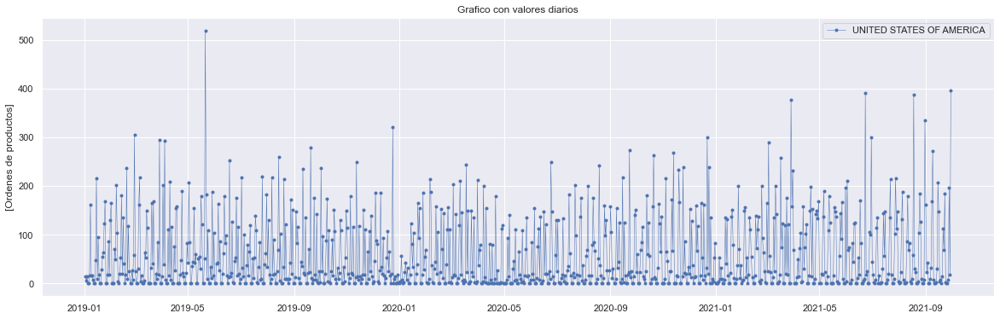

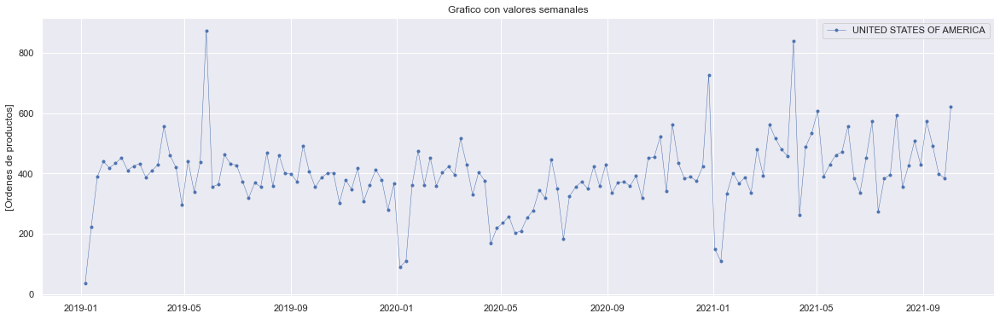

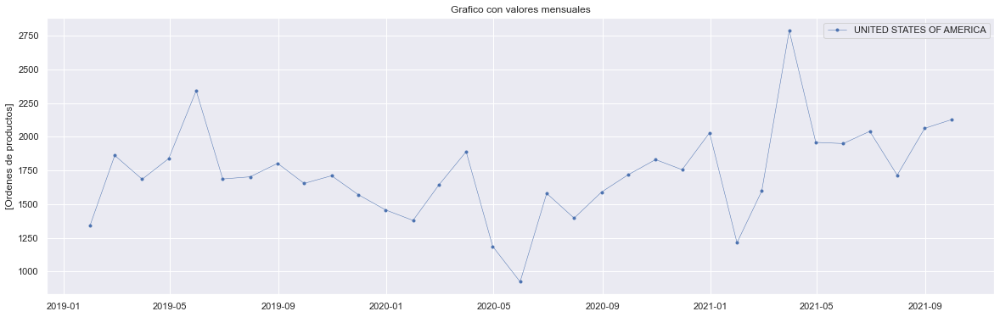

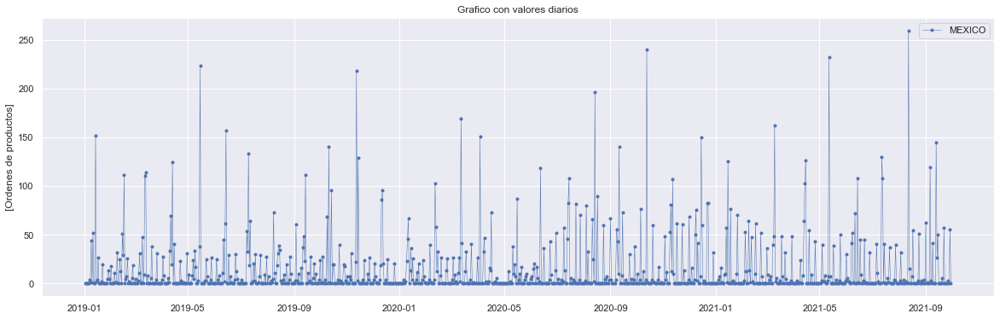

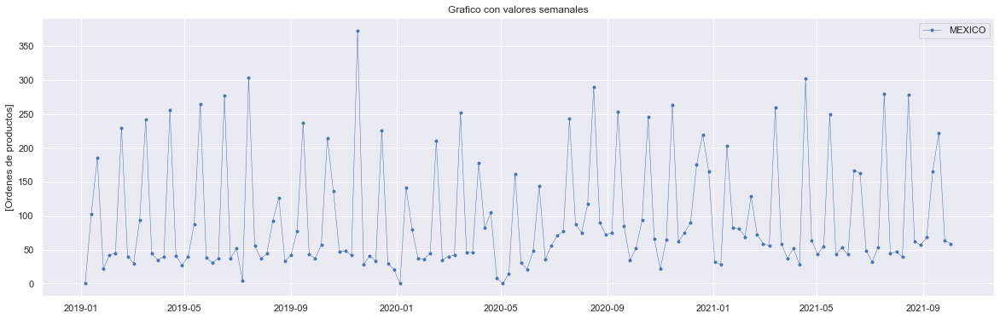

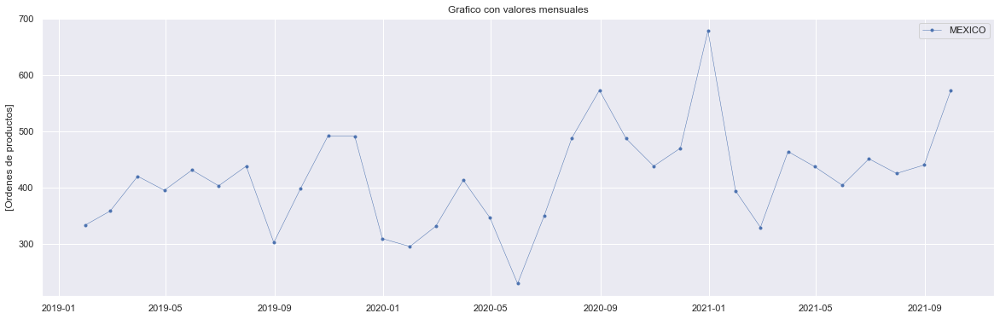

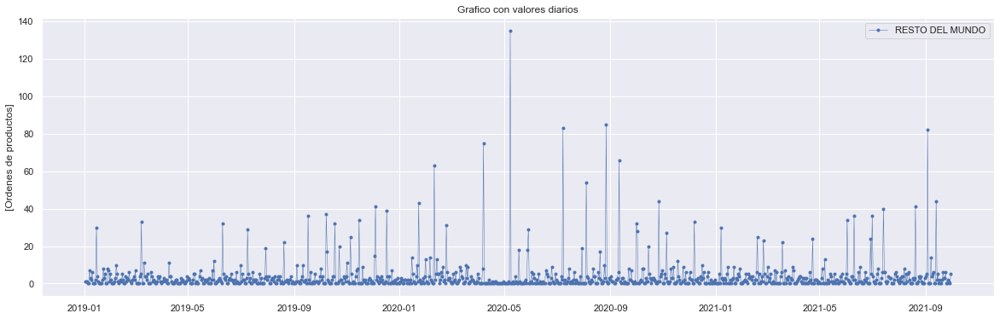

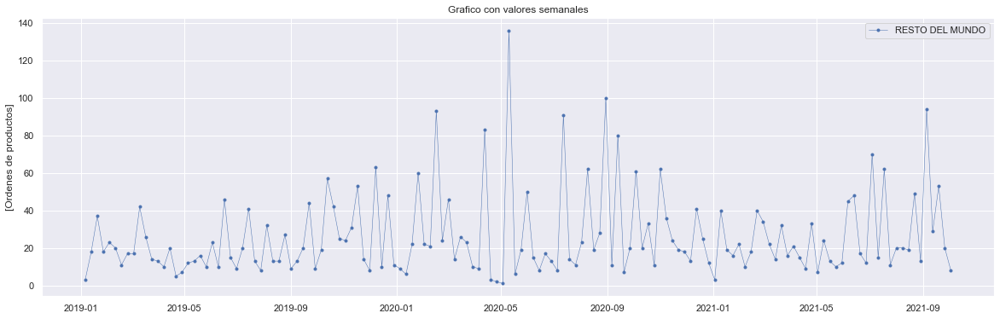

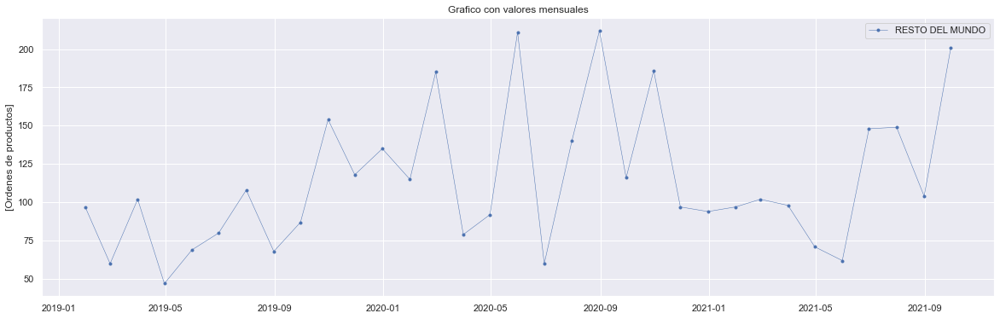

In [52]:
# Iteraremos primero sobre los posibles destinos, luego sobre  las frecuencias y los titulos de los graficos.
for column in Exportaciones_graph_4.sum().sort_values(ascending=False).index:
    for freq, title in zip(freqs, title_graphs):

        # Vamos a plotear nuestra variable AMOUNT_USD contra la variable tiempo=[dia,semana y mes]
        fig, ax = plt.subplots(figsize=(20, 6))
        ax.plot(Exportaciones_graph_4[column].resample(freq).sum(),marker='.', linestyle='-', linewidth=0.5, label=Exportaciones_graph_4[column].name)
        ax.set_title(label=title)
        ax.legend()
        ax.set_ylabel('[Ordenes de productos]')
        plt.show()

##### Analisis Descriptivo, COUNTRY_DESTINATION, CANTIDAD_DE_ORDENES, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

In [53]:
# Vamos a iterar para obtener el analisis descriptivo.
for freq in freqs:
       print(
              '\n Analisis descriptivo para la frecuencia {} :\n'.format(freq),
              Exportaciones_graph_4.resample(freq).sum().describe(),                                            # Analisis descriptivo
              '\n cv',                                                                                          # Coeficiente de variacion
              *Exportaciones_graph_4.resample(freq).sum().describe().loc['std'] / Exportaciones_graph_4.resample(freq).sum().describe().loc['mean'] # std / media
              )


 Analisis descriptivo para la frecuencia D :
             MEXICO  RESTO DEL MUNDO  UNITED STATES OF AMERICA
count  1003.000000      1003.000000               1003.000000
mean     13.744766         3.732802                 56.860419
std      31.329182         9.467793                 74.646943
min       0.000000         0.000000                  0.000000
25%       0.000000         0.000000                  1.000000
50%       0.000000         1.000000                 19.000000
75%      10.000000         4.000000                101.500000
max     260.000000       135.000000                520.000000 
 cv 2.2793536359749997 2.536377355568995 1.3128102963518289

 Analisis descriptivo para la frecuencia W :
            MEXICO  RESTO DEL MUNDO  UNITED STATES OF AMERICA
count  144.000000       144.000000                144.000000
mean    95.736111        26.000000                396.048611
std     83.760062        22.349731                116.910660
min      0.000000         1.000000         

##### Totales para todo el periodo, COUNTRY_DESTINATION, CANTIDAD_DE_ORDENES, RESAMPLING: DAILY, WEEKLY Y MONTHLY.

In [54]:
# Vamos a hacer la sumatoria para ver la cantidad de ordenes por destino. 
Exportaciones_graph_4.sum()

MEXICO                      13786
RESTO DEL MUNDO              3744
UNITED STATES OF AMERICA    57031
dtype: int64

In [55]:
# Grafiquemos la cantidad de ordenes por destino.
fig = px.pie(
            data_frame = Exportaciones_graph_4.sum(),
            names = Exportaciones_graph_4.sum().index,
            values = Exportaciones_graph_4.sum()
            )
fig.show()

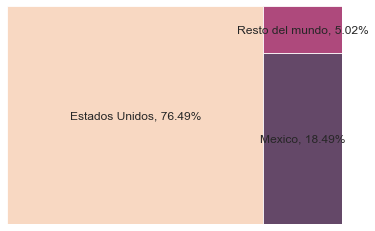

In [56]:
# Hagamos un heatmap de la cantidad de ordenes segun destino.
squarify.plot(sizes=np.array([0.7649, 0.1849, (1 - np.sum([0.7649, 0.1849]))]), label=['Estados Unidos, 76.49%', 'Mexico, 18.49%', 'Resto del mundo, 5.02%'], alpha=.8 )
plt.axis('off')
plt.show()

##### Conclusion, COUNTRY_DESTINATION, CANTIDAD_DE_ORDENES, RESAMPLING DAILY, WEEKLY Y MONTHLY.

Conclusiones de los graficos diarios:
- Podemos observar que Mexico y Resto del mundo tienen varios dias sin valores. Mientras que para Estados Unidos encontramos valores para la mayoria de los dias del periodo.

- Depsues del lapso de COVID, esta el dia con mas cantidad de ordenes proveniente de Resto Del Mundo, debe ser cuando se aliviano algun tipo de restriccion como hipotesis. Las ordenes parecieran mantenerse altas luego de esto, para luego ya en 2021 comportarse de manera semejante a 2019.

- Para Mexico es visible tambien el efecto de COVID con cierto rezago, mientras que para Estados Unidos, no esta tan claro el mismo por lo menos en el grafico con valores diarios.

Conclusiones de los graficos Semanales:
- La variacion para valores semanales para Mexico es notablemente alta, para Resto del mundo pareciera ser menor y para Estados Unidos la misma es una serie mucho mas estable. Esto se podria atribuir en Estados Unidos con que hay mas valores, y la misma se normaliza. Lo que si llama la atencion que la variacion para Mexico semanal sea mayor que Resto del Mundo, el cual tiene menos valores a lo largo de la serie.

- Post la grande orden luego del COVID para Resto del mundo, las ordenes parecieran mantenerse por encima de la media para ir ajustando levemente hasta volver a comportarse como en 2019.

- Mexico ya para el mes 7-8 de 2020 ya volvio a un comportamiento semejante a 2019. Estados Unidos tiene un comportamiento semejante a este.

Conclusiones de los graficos Mensuales:

- Para valores mensuales, podemos ver que los efectos del COVID no actuaron con los mismos rezagos, pareciera ser que Resto del Mundo tuvo mayor rapidez para reflejar estos efectos, mientras que Mexico y Estados Unidos tuvieron mas rezago para reflejar este suceso en sus valroes.

- La Varianza Post COVID para Resto del Mundo se mantuvo alta para el resto de 2020, con meses buenos y meses malos alternandose. En 2021 tuvo un comportamiento semejante a 2019.

- Mexico post Covid tuvo unos meses por encima de la media de 2019, pareciera que recuperando esas ventas perdidas a mediados de 2020, este comportamiento se mantuvo hasta comienzos de 2021.

- Estados Unidos para el mes 7-8 de 2020 ya estaba en valores semejantes a 2019, pero sin embargo en 2021 estuvo con una media mensual superior. Aca podriamos suponer que existe una hipotesis distinta a COVID que pueda explicar las ventas superiores a 2021, podria ser tambien COVID con un rezago mas grande, pero no descartaria tratar de buscar tambien si puede haber otro tipo de hipotesis.

Conclusiones Generales: 

- A nivel general los coeficientes de variacion son menores que cuando los mirabamos por monto de facturacion. Esta diferencia es aun mayor en los valores mensuales. De aqui podemos pensar que varia mas el monto de facturacion que la cantidad de ordenes, iria de la mano con el supuesto que planteamos previamente que pareciera que los clientes ajustan mas las ordenes por monto de facturacion (es decir por cantidad) que por frecuencia de ordenes.

- Es importante ver que las respuestas de Ordenes y AMOUNT_USD no fueron las mismas, y que los insights de los mismos fueron distintos. Esto me podria llevar a tratar de ver y generar hipotesis, para ver si Cantidad de Ordenes y AMOUNT_USD se comportan de manera distinta, como venimos planteando que la medida de ajuste de los clientes es el monto facturable de la orden y no la cantidad de ordenes. Una posible hipotesis es que los clientes le venden a determinadas empresas cada 'X' dias, y estas empresas segun la demanda que tuvieron ajustan la cantidad internamente a esa orden, y por eso el AMOUNT_USD fluctua en mayor medida.

## AMOUNT_USD y CANTIDAD_DE_ORDENES, por empresas.

Analizaremos las exportaciones a nivel empresas, tanto por cantidad de operaciones como por monto total de facturacion.

### CANTIDAD_DE_ORDENES, por empresas.
Tenemos 74.561 operaciones en total de las cuales corresponden: 
- 17.142 a la empresa 1, 
- 14.664 a la empresa 2, 
- 13.612 a la empresa 3, 
- 11.570 a la empresa 4, 
- 11.344 a la empresa 5 y 
- 6.229 a la empresa 6.

In [57]:
# Cantidad de operaciones por empresa.
Exportaciones.EMPRESAS.value_counts()

1    17142
2    14664
3    13612
4    11570
5    11344
6     6229
Name: EMPRESAS, dtype: int64

In [58]:
# Cantidad de operaciones en total.
Exportaciones.EMPRESAS.value_counts().sum()

74561

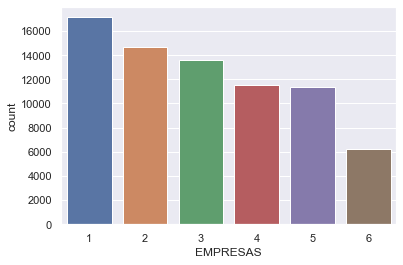

In [59]:
# Grafico contabilizando transacciones por empresas.
fig = sns.countplot(x = Exportaciones.EMPRESAS)
plt.show()

In [60]:
# Vamos a hacer un pie chart interactivo del porcentaje que represento cada empresa del total.
fig = px.pie(Exportaciones, values=Exportaciones.EMPRESAS.value_counts(), names=Exportaciones.EMPRESAS.value_counts().index)
fig.show()

# Si clickeamos las empresas a la derecha podemos ver como se compondria la cartera sacando ciertas empresas.

#### Conclusion, Cantidad de operaciones por empresa.

- Por cantidad de ordenes el 50% de los clientes, empresa 1, 2 y 3, representan el 60% de la cantidad de ordenes. Sin embargo sacando la empresa 6 que en cantidad de ordenes es un salto casi del 50% del ultimo valor, el resto de las empresas esta escalonado sin grandes diferencias en cuanto a cantidad de ordenes.

- De todas formas, si bien siempre es interesante saber como se componen las ordenes, creo que en general el analisis de mayor interes es segun facturacion total. 

- No obstante es importante hacer este analisis, porque podemos descubrir datos fuera de lo normal que podrian ser importantes para nuestro negocio, por ejemplo que un cliente sea el 90% de las ordenes pero en cuanto a facturacion presente un bajo porcentaje del total, ese dato seria importante de considerar a la hora de trabajar con el mismo y evaluar los esfuerzos que se hacen en el mismo. 

- Esto es solo un ejemplo pueden pasar muchas situaciones particulares, por eso siempre es importante tratar de analizar todas las variables que tengamos en un dataset, y ver si pueden aportarnos informacion importante para nuestro negocio.

- Tambien es importante siempre antes de empezar a analizar las variables plantear distintas posibles hipotesis, porque si lo hacemos una vez que ya vimos los resultados tenemos mayor probabilidad de sesgar nuestro juicio en ciertas situaciones.

### AMOUNT_USD, por empresas.

Tenemos un total facturable en dolares de 946.809.377 los cuales se distribuyen:
- 243.792.444 de la empresa 1,
- 271.812.063 de la empresa 2,
- 36.778.377  de la empreas 3,
- 245.708.847 de la empreas 4,
- 106.173.999 de la empresa 5 y
- 42.543.647  de la empresa 6.

Ordenado por valores decreciente serian:
- 271.812.063 de la empresa 2,
- 245.708.847 de la empreas 4,
- 243.792.444 de la empresa 1,
- 106.173.999 de la empresa 5,
- 42.543.647  de la empresa 6 y
- 36.778.377  de la empreas 3.

In [61]:
# Creamos una tabla pivot para ver el valor de los montos, agrupado por empresas y ordenado por total de facturacion.
USD_por_empresa = Exportaciones.pivot_table(index='EMPRESAS', values='AMOUNT_USD', aggfunc=np.sum)

# Ordenamos los valores segun AMOUNT_USD en order descendiente.
USD_por_empresa.sort_values(by='AMOUNT_USD', ascending=False)

,AMOUNT_USD
EMPRESAS,
2,271812063
4,245708847
1,243792444
5,106173999
6,42543647
3,36778377


In [62]:
# Calculamos el total de facturacion.
Total_Expo_USD = np.sum(Exportaciones.AMOUNT_USD)
Total_Expo_USD

946809377

In [63]:
# Hacemos un grafico de barras de las ventas por empresa.
fig = px.bar(USD_por_empresa, y=USD_por_empresa.AMOUNT_USD, x=USD_por_empresa.index)
fig.show()

#### Conclusion, AMOUNT_USD, por empresas.

- Si bien los porcentajes se van a analizar mas en profundo en la siguiente seccion, se puede ver a simple vista en el grafico de arriba que existen 3 clientes (1,2 y 4) que son notablemente superiores a los otros 3.

- No se observan grandes diferencias entre los 3 principales clientes.

- Entre los 3 clientes con menos facturacion (3,5 y 6), podriamos decir como que 5 estaria un escalon mas arriba si los agruparamos. 

- Para mi una agrupacion a simple vista por facturacion seria: (1, 2 y 4), 5 y (3,6).

- La ultima agrupacion es meramente intuitiva y basada en facturacion. En la practica tambien podriamos ver a que industria pertenece a cada una, si corresponden a la misma industria, que tipo de productos exportan, etc.

## Proporcion de cartera por empresa.

El orden segun importancia por facturacion fue:
- Empresa 2 con el 28.7%,
- Empresa 4 con el 26.0%,
- Empresa 1 con el 25.7%,
- Empresa 5 con el 11.2%,
- Empresa 6 con el 4.5% y
- Empresa 3 con el 3.9%.

In [64]:
# Calculamos las exportaciones por empresa.
Por_Empresa = Exportaciones.groupby('EMPRESAS').sum('AMOUNT_USD')
Por_Empresa

,AMOUNT_USD
EMPRESAS,
1,243792444
2,271812063
3,36778377
4,245708847
5,106173999
6,42543647


In [65]:
# Realizaremos un pie chart con plotly, lo que permitira que el mismo sea interactivo.
fig = px.pie(Por_Empresa, values='AMOUNT_USD', names=Por_Empresa.index, title='Composicion de cartera por empresas, segun facturacion')
fig.show()

# Al ser un grafico de plotly, podemos clickear a la derecha algun cliente, para ver como se compondria nuestra cartera si perdieramos ese cliente.

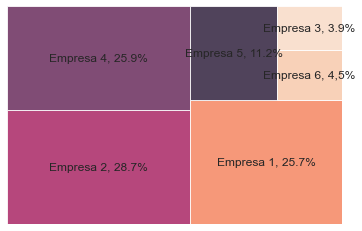

In [66]:
# Hagamos tambien un heatmap de la cartera.
squarify.plot(sizes=np.array([0.287082, 0.259512 , 0.257488, 0.112139, 0.044934, 0.038845]), label=['Empresa 2, 28.7%', 'Empresa 4, 25.9%', 'Empresa 1, 25.7%', 'Empresa 5, 11.2%', 'Empresa 6, 4,5%', 'Empresa 3, 3.9%'], alpha=.8 )
plt.axis('off')
plt.show()

### Conclusion, Proporcion de cartera por empresa.

- Podemos ver que por facturacion, el 50% de nuestra cartera (Empresas 1, 2 y 4) representan el 80% de la facturacion.

- Al mismo tiempo estas empresas poseen porcentajes similares en un rango entre 25,7% y 28,7% cada una.

- Podemos ver tambien que la Empresa 5, es superior su porcentaje a las otras 2 empresas restantes (6 y 3).

De este analisis podriamos entender que perder a cualquiera de los 3 principales clientes tendria un costo muy alto para Mundi. 
Si bien Mundi no depende exclusivamente de esas ventas, podemos preveer que clientes con mas ventas, siendo este no el unico criterio utilizado, tienen mayor posibilidades de acceder a mayores prestamos lo que dejaria mayores comisiones a Mundi.
Tener la cartera concentrada sin embargo tiene sus beneficios y desventajas:

- Como una desventaja, perder a uno de los principales clientes puede ser muy costoso. Podria poner en duda a Mundi por ejemplo si uno de estos tres principales clientes pidiera un prestamo mayor al que la compañia consideraria el monto maximo a prestarle. Estaria en la duda de si rechazar el prestamo y arriesgarse a perder el cliente, o aceptarlo y arriesgarse prestando mas del maximo estimado como adecuado.

- Como una ventaja, saber cuales son tus principales clientes te permite enfocar mas tus esfuerzos en mantener la relacion comercial, y en ademas saber que vale el esfuerzo investigar mas a estos clientes y mejorar los modelos respectos de los mismos.

- Como otra desventaja, si a una industria de estos clientes le va mal, mientras mas grande sea la industria mas va a afectar los ingresos de Mundi, dado que tendra mayor dependencia de ese cliente. Peor seria si varios de estos clientes principales comparten la industria de la que forman parte.



## Los 5 productos mas vendidos.

Vamos a analizar cuales son los 5 productos mas vendidos, segun cantidad de ordenes y por facturacion total.

In [67]:
import textacy
from textacy import preprocessing

### Limpieza de variable PRODUCT_DESCRIPTION.

In [68]:
# Vamos a crear un nuevo dataframe, en este contaremos la cantidad de ordenes segun pais de destino.
Exportaciones_Product = Exportaciones_index.copy()

Exportaciones_Product.head()

,PRODUCT_DESCRIPTION,AMOUNT_USD,DESTINATION_COUNTRY,EMPRESAS
DATE,,,,
2021-09-03,MANGUERA DE CAUCHO CON REFUERZO TEXTIL,118170,MEXICO,4
2021-09-30,PALETA DE PLASTICO,1,UNITED STATES OF AMERICA,1
2021-09-30,CIRCUITOS MODULARES,216,UNITED STATES OF AMERICA,3
2021-09-01,CONEXIONES AISLADAS - ROSCADAS,23,UNITED STATES OF AMERICA,5
2021-09-06,CAJA DE CARTON CORRUGADO,59,MEXICO,3


In [69]:
# Vamos a ver cuantas variables unicas tenemos originalmente.
Exportaciones_Product.PRODUCT_DESCRIPTION.nunique()

3139

In [70]:
# Aplicamos upper para poner todo en mayusculas, vemos que con este proceso bajamos en 13 la cantidad de variables unicas que tenemos.
Exportaciones_Product.PRODUCT_DESCRIPTION = Exportaciones_Product.PRODUCT_DESCRIPTION.str.upper()
Exportaciones_Product.PRODUCT_DESCRIPTION.nunique()

3126

In [71]:
# Aplicamos strip para borrar espacios blancos (es decir errores en el espaciado), vemos que nuestro numero de variables unicas no varia con este proceso. 
Exportaciones_Product.PRODUCT_DESCRIPTION = Exportaciones_Product.PRODUCT_DESCRIPTION.str.strip()
Exportaciones_Product.PRODUCT_DESCRIPTION.nunique()

3126

In [72]:
# Vi que hay varios productos que luego del '-' ponen una caracteristica mas del producto, asi que dividimos por '-' y nos quedamos solo con la primer parte.
# Luego de esto, bajamos en 618 nuestra cantidad de variables unicas.
Exportaciones_Product.PRODUCT_DESCRIPTION = Exportaciones_Product.PRODUCT_DESCRIPTION.str.split('-', expand=True)[0]
Exportaciones_Product.PRODUCT_DESCRIPTION.nunique()

2508

In [73]:
# Con los ':' pasa lo mismo que con el '-', luego de este proceso bajamos en 595 nuestra cantidad de variables unicas.
Exportaciones_Product.PRODUCT_DESCRIPTION = Exportaciones_Product.PRODUCT_DESCRIPTION.str.split(':', expand=True)[0]
Exportaciones_Product.PRODUCT_DESCRIPTION.nunique()

1913

In [74]:
pd.DataFrame(Exportaciones_Product.PRODUCT_DESCRIPTION.unique()).to_csv(r'/Users/cfontana/Downloads/Product.csv',index=False)

In [75]:
Exportaciones_Product.PRODUCT_DESCRIPTION.str.split(' ', expand=True)[0].nunique()

481

### Conclusion, Limpieza de variable PRODUCT_DESCRIPTION.

- IMPORTANTE: Hay que entender que a lo largo de estos procesos generales, podemos perder algo de precision, es decir perdamos diferenciacion en variables que efectivamente eran distintas, cada vez que apliquemos un paso es importante tratar de entender cuanto estamos ganando y a que costo, es decir cual es el trade off que hay detras.

- Un ejemplo de esta aclaracion al principio, es si hicieramos un split basados en el espacio y nos quedaramos solo con la primer palabra. Hay para muchos productos que este filtro serviria, incluso nuestro total de variables bajaria de 1913 a 481 pero tenemos que entender que a simple vista pude encontrar varios casos donde clasificariamos mal ciertos productos, es decir el costo habria que verlo en nuestros modelos futuros puede ser que sea alto, y perdamos mas de lo que ganemos.

- Si bien con estos simples pasos logre casi reducir a la mitad las variables, todavia queda mucho trabajo por hacer. Una posibilidad esta en agrupar variables por su producto principal, dado que veo que hay muchos productos que dicen Plastico, Metal, Cobre, Termistor.

- Al mismo tiempo debo tener cuidado de como agrupo productos como 'CABLE DE COBRE C/PLASTICO C/CONECTOR DE METAL C/PLASTICO', si me baso en la primera palabra que aparece, si lo dejo de manera individual, o como manejarlo.

- Otra cuestion si agruparamos por material principal, seria preguntarnos por ejemplo si tenemos ACERO, ?es realmente representantivo de tornillo y bola?, ?O nos importa mas saber que es un tornillo y si tuvieramos tornillo de cobre o acero nos daria igual?

- Este seria un proceso en si, de manera manual tambien se puede hacer, pero lo interesante seria tratar de armar un sistema para poder filtrarlo de manera automatica, capaz meterse un poco en NLP rubro que no es mi especialidad pero que quiero aprender en estos dias. Esto sera util para que cuando vayan cambiando los productos no haya que modificarlos manualmente.

- Tambien veo que hay algunos productos mal cargado como por ejemplo 'TAPN DE PLSTICO', luego de filtrar por palabras principales como plastico en este caso, habria que correr por similitud o distancia entre las palabras, y aca con un treshold alto las agruparia (otro problema seria si por treshold hay palabras que queden fuera, por ejemplo si dijera PLST. para plastico)

### Los 5 productos mas vendidos, segun cantidad de ordenes, sin limpiar PRODUCT_DESCRIPTION.

In [76]:
Exportaciones.PRODUCT_DESCRIPTION.value_counts().sort_values(ascending=False).head()

MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS    3808
TERMISTOR                                                3131
CONTENEDOR DE PLASTICO                                   2891
VALVULA SOLENOIDE                                        2522
CHAROLA DE PLASTICO                                      2248
Name: PRODUCT_DESCRIPTION, dtype: int64

In [77]:
# Iteracion para traer la facturacion de los 5 productos mas vendidos por cantidad de ordenes, PRODUCT_DESCRIPTION sin limpiar.
for product in Exportaciones.PRODUCT_DESCRIPTION.value_counts().sort_values(ascending=False).index[:5]:
    print(
            product,
            'por un monto de:',
            Exportaciones[Exportaciones.PRODUCT_DESCRIPTION == product]['AMOUNT_USD'].sum()
            )


MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS por un monto de: 206759747
TERMISTOR por un monto de: 32227405
CONTENEDOR DE PLASTICO por un monto de: 1027159
VALVULA SOLENOIDE por un monto de: 113585847
CHAROLA DE PLASTICO por un monto de: 2248


#### Conclusion, Los 5 productos mas vendidos, segun cantidad de ordenes, sin limpiar PRODUCT_DESCRIPTION.

- Manguera de Caucho con refuerzo textil con accesorios : 3808
- Termistor : 3131
- Contenedor PLastico : 2891
- Valvula Solenoide : 2522
- Charola de plastico : 2248

y sus montos de facturacion fueron:

- MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS por un monto de: 206759747
- TERMISTOR por un monto de: 32227405
- CONTENEDOR DE PLASTICO por un monto de: 1027159
- VALVULA SOLENOIDE por un monto de: 113585847
- CHAROLA DE PLASTICO por un monto de: 2248

### Los 5 productos mas vendidos, segun cantidad de ordenes, limpiado PRODUCT_DESCRIPTION.

In [78]:
Exportaciones_Product.PRODUCT_DESCRIPTION.value_counts().sort_values(ascending=False).head()

MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS    3808
LINEAS SANGUINEAS ID                                     3448
TERMISTOR                                                3131
CONTENEDOR DE PLASTICO                                   2891
DIALISIS PERITONEAL ID                                   2611
Name: PRODUCT_DESCRIPTION, dtype: int64

In [79]:
# Iteracion para traer la facturacion de los 5 productos mas vendidos por cantidad de ordenes, PRODUCT_DESCRIPTION limpiado.
for product in Exportaciones_Product.PRODUCT_DESCRIPTION.value_counts().sort_values(ascending=False).index[:5]:
    print(
            product,
            'por un monto de:',
            Exportaciones_Product[Exportaciones_Product.PRODUCT_DESCRIPTION == product]['AMOUNT_USD'].sum()
            )

MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS por un monto de: 206759747
LINEAS SANGUINEAS ID por un monto de: 140738552
TERMISTOR por un monto de: 32227405
CONTENEDOR DE PLASTICO por un monto de: 1027159
DIALISIS PERITONEAL ID por un monto de: 100655145


#### Conclusion, Los 5 productos mas vendidos, segun cantidad de ordenes, limpiado PRODUCT_DESCRIPTION.

- MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS    3808
- LINEAS SANGUINEAS ID                                     3448
- TERMISTOR                                                3131
- CONTENEDOR DE PLASTICO                                   2891
- DIALISIS PERITONEAL ID                                   2611

y sus montos de facturacion fueron:

- MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS por un monto de: 206759747
- LINEAS SANGUINEAS ID por un monto de: 140738552
- TERMISTOR por un monto de: 32227405
- CONTENEDOR DE PLASTICO por un monto de: 1027159
- DIALISIS PERITONEAL ID por un monto de: 100655145

Observamos que al limpiar sin ir muy profundamente PRODUCT_DESCRIPTION, el top 5 cambia.

### Los 5 productos mas vendidos, segun facturacion, sin limpiar PRODUCT_DESCRIPTION.

In [80]:
Exportaciones.groupby('PRODUCT_DESCRIPTION').AMOUNT_USD.sum().sort_values(ascending=False).head(5)

PRODUCT_DESCRIPTION
MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS    206759747
VALVULA SOLENOIDE                                        113585847
CUERPO DE ACELERACION                                     76675460
LINEAS SANGUINEAS ID:03-2722-9                            49096507
INYECTOR DE GASOLINA                                      43775977
Name: AMOUNT_USD, dtype: int64

In [81]:
# Iteracion para traer la facturacion de los 5 productos mas vendidos por facturacion, PRODUCT_DESCRIPTION sin limpiar.
for product in Exportaciones.groupby('PRODUCT_DESCRIPTION').AMOUNT_USD.sum().sort_values(ascending=False).index[:5]:
    print(
            product,
            'por una cantidad de:',
            *Exportaciones[Exportaciones.PRODUCT_DESCRIPTION == product]['PRODUCT_DESCRIPTION'].value_counts().values
            )

MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS por una cantidad de: 3808
VALVULA SOLENOIDE por una cantidad de: 2522
CUERPO DE ACELERACION por una cantidad de: 1177
LINEAS SANGUINEAS ID:03-2722-9 por una cantidad de: 1119
INYECTOR DE GASOLINA por una cantidad de: 342


#### Conclusion, Los 5 productos mas vendidos, segun facturacion, sin limpiar PRODUCT_DESCRIPTION.

- Manguera de caucho con refuerzo textil con accesorios : 206.759.747
- Valvula solenoide: 113.585.847
- Cuerpo de aceleracion: 76.675.460
- Lineas sanguineas ID:03-2722-9 : 49.096.507
- Inyector de gasolina : 43.775.977

y sus cantidades fueron:

- MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS por una cantidad de: 3808
- VALVULA SOLENOIDE por una cantidad de: 2522
- CUERPO DE ACELERACION por una cantidad de: 1177
- LINEAS SANGUINEAS ID:03-2722-9 por una cantidad de: 1119
- INYECTOR DE GASOLINA por una cantidad de: 342

### Los 5 productos mas vendidos, segun facturacion, limpiado PRODUCT_DESCRIPTION.


In [82]:
Exportaciones_Product.groupby('PRODUCT_DESCRIPTION').AMOUNT_USD.sum().sort_values(ascending=False).head(5)

PRODUCT_DESCRIPTION
MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS    206759747
LINEAS SANGUINEAS ID                                     140738552
VALVULA SOLENOIDE                                        113585847
DIALISIS PERITONEAL ID                                   100655145
CUERPO DE ACELERACION                                     76675460
Name: AMOUNT_USD, dtype: int64

In [83]:
# Iteracion para traer la facturacion de los 5 productos mas vendidos por facturacion, PRODUCT_DESCRIPTION sin limpiar.
for product in Exportaciones_Product.groupby('PRODUCT_DESCRIPTION').AMOUNT_USD.sum().sort_values(ascending=False).index[:5]:
    print(
            product,
            'por una cantidad de:',
            *Exportaciones_Product[Exportaciones_Product.PRODUCT_DESCRIPTION == product]['PRODUCT_DESCRIPTION'].value_counts().values
            )

MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS por una cantidad de: 3808
LINEAS SANGUINEAS ID por una cantidad de: 3448
VALVULA SOLENOIDE por una cantidad de: 2522
DIALISIS PERITONEAL ID por una cantidad de: 2611
CUERPO DE ACELERACION por una cantidad de: 1177


#### Conclusion, Los 5 productos mas vendidos, segun facturacion, limpiado PRODUCT_DESCRIPTION.

- MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS    206759747
- LINEAS SANGUINEAS ID                                     140738552
- VALVULA SOLENOIDE                                        113585847
- DIALISIS PERITONEAL ID                                   100655145
- CUERPO DE ACELERACION                                     76675460

y sus cantidades fueron:

- MANGUERA DE CAUCHO CON REFUERZO TEXTIL CON ACCESORIOS por una cantidad de: 3808
- LINEAS SANGUINEAS ID por una cantidad de: 3448
- VALVULA SOLENOIDE por una cantidad de: 2522
- DIALISIS PERITONEAL ID por una cantidad de: 2611
- CUERPO DE ACELERACION por una cantidad de: 1177

Aca podemos ver nuevamente que cambia el top 5 al trabajar un poco la variable PRODUCT_DESCRIPTION.

## Cantidad de distintos productos exportados, por empresa.

- Aqui vamos a trabajar ya con la variable PRODUCT_DESCRIPTION trabajada. 

- Haremos el analisis de los distintos productos exportados, para todo el periodo y su promedio anual y mensual. 

- Elegimos estos modos de calcularlo pero podriamos haber elegido tambien por ejemplo, el total anual para ver la diferencia durante los 3 años. Ver el mensual promedio de los 3 años es decir, la comparacion de los meses de los años, entre otros sistemas.

### Cantidad de distintos productos exportados, por empresa, durante todo el periodo.

Primero analizaremos cuantos productos distintos exporto cada empresa a lo largo de todo el periodo.

La cantidad de productos distintos que exporto cada empresa en orden descendiente fue:
- Empresa 2: 1903 productos.
- Empresa 5: 391 productos.
- Empresa 3: 381 productos.
- Empresa 4: 192 productos.
- Empresa 6: 183 productos.
- Empresa 1: 160 productos.

El valor sumado de todas estas variables nos da mayor a la cantidad de productos unicos que tenemos, esto significa que hay distintas empresas que exportan el mismo item y lo reportan con el mismo nombre.

In [84]:
# Creamos un dict vacio sobre el cual guardaremos los resultados de nuestra iteracion.
productos_exportados_todo_el_periodo = {}

# Iteramos para obtener para las distintas empresas, el total de exportaciones de distintos productos para todo el periodo.
for i in range(1,7):
    productos_exportados_todo_el_periodo[i] = Exportaciones_Product[Exportaciones_Product['EMPRESAS'] == i].PRODUCT_DESCRIPTION.nunique()
productos_exportados_todo_el_periodo

{1: 160, 2: 692, 3: 380, 4: 192, 5: 383, 6: 177}

In [85]:
print('Entre todas las empresas, en total exportaron {} productos distintos, para el periodo entero.'.format(np.sum(list(productos_exportados_todo_el_periodo.values()))))

Entre todas las empresas, en total exportaron 1984 productos distintos, para el periodo entero.


In [86]:
print('Sin embargo de estos productos solo {} fueron unicos, es decir hay empresas que exportaron los mismos productos'.format(Exportaciones_Product.PRODUCT_DESCRIPTION.nunique()))

Sin embargo de estos productos solo 1913 fueron unicos, es decir hay empresas que exportaron los mismos productos


In [87]:
# Graficamos la cantidad de distintos productos exportados por cada empresa.
px.bar(
        Exportaciones_Product,
        x = ['Empresa 1','Empresa 2','Empresa 3','Empresa 4','Empresa 5','Empresa 6'],
        y = list(productos_exportados_todo_el_periodo.values())
        )

#### Conclusion, Cantidad de distintos productos exportados, por empresa, durante todo el periodo.

- La sumatoria de los distintos productos exportados por las empresas da 1984, mientras que la cantidad de distintos productos exportados fue de 1913. Esto quiere decir que hubo empresas que exportaron los mismos productos con los mismos nombres.

- Este numero podriamos reducirlo si hicieramos NLP, o una limpieza mas profunda, ya que hay varios productos con factores en comun o incluso productos que estan mal cargados (error al escribirlos).

- Podemos observar una diferenciacion notable a lo largo de las empresas, desde las inferiores (Empresas 4,6 y 1 con 192,177,160 produtos respectivamente), a las medias (Empresas 5 y 3 con 383 y 380 productos respectivamente) y la empresa 2 con un monto total de 692 productos.

- Sin embargo no seria del todo correcto hacer inferencias finales, hasta no limpiar mas profundamente la variable 'PRODUCT_DESCRIPTION', e incluso el mejor analisis puede ser que venga depsues que podamos agrupar tambien ciertos terminos.

La cantidad de productos distintos que exporto cada empresa en orden descendiente fue:
- Empresa 2: 692 productos.
- Empresa 5: 383 productos.
- Empresa 3: 380 productos.
- Empresa 4: 192 productos.
- Empresa 6: 177 productos.
- Empresa 1: 160 productos.

### Cantidad de distintos productos exportados, por empresa, promedio anual.

In [88]:
# Creamos un nuevo dataframe el cual utilizaremos para hacer division anual, usaremos como base Exportaciones con PRODUCT_DESCRIPTION limpiado.
Exportaciones_Product_Yearly = Exportaciones_Product.copy()

# Reseteamos el indice de nuestro dataframe.
Exportaciones_Product_Yearly.reset_index(inplace=True)

# Creamos la nueva columna, basada en DATE, trayendo solo el ano.
Exportaciones_Product_Yearly['YEARLY'] = Exportaciones_Product_Yearly.DATE.dt.strftime('%Y')

# Volvemos a setear la columna DATE como indice.
Exportaciones_Product_Yearly.set_index('DATE', inplace=True)

# Traemos nuestro nuevo dataframe.
Exportaciones_Product_Yearly.head()

,PRODUCT_DESCRIPTION,AMOUNT_USD,DESTINATION_COUNTRY,EMPRESAS,YEARLY
DATE,,,,,
2021-09-03,MANGUERA DE CAUCHO CON REFUERZO TEXTIL,118170,MEXICO,4,2021
2021-09-30,PALETA DE PLASTICO,1,UNITED STATES OF AMERICA,1,2021
2021-09-30,CIRCUITOS MODULARES,216,UNITED STATES OF AMERICA,3,2021
2021-09-01,CONEXIONES AISLADAS,23,UNITED STATES OF AMERICA,5,2021
2021-09-06,CAJA DE CARTON CORRUGADO,59,MEXICO,3,2021


In [89]:
# Creamos un dict vacio sobre el cual guardaremos los resultados de nuestra iteracion.
productos_exportados_por_ano = {}

# Iteramos para obtener para las distintas empresas, su promedio de exportaciones anuales de distintos productos.
for i in range(1,7):
    productos_exportados_por_ano[i] = np.round(Exportaciones_Product_Yearly[Exportaciones_Product_Yearly['EMPRESAS'] == i].groupby('YEARLY').PRODUCT_DESCRIPTION.nunique().mean(),0)
productos_exportados_por_ano

{1: 85.0, 2: 292.0, 3: 188.0, 4: 92.0, 5: 238.0, 6: 89.0}

In [90]:
# Graficamos el promedio de productos exportados por cada empresa.
px.bar(
        Exportaciones_Product_Yearly,
        x = ['Empresa 1','Empresa 2','Empresa 3','Empresa 4','Empresa 5','Empresa 6'],
        y = list(productos_exportados_por_ano.values())
        )

#### Conclusion, Cantidad de distintos productos exportados, por empresa, promedio anual.

- Podemos ver una tendencia parecida, al total de productos distintos para todo el periodo. 

- Salvo que supongamos que incluso dentro del mismo año fueron cambiando las notacioens de los productos, salvo por errores a la hora de cargarlos, la empresa 2 sigue siendo la que mas productos distintos exporto.

- Es importante ver que sumo importancia la Empresa 5, y que su diferenciacion entre el promedio anual (238 productos) y el total para todo el periodo (383) no es tan grande. Podemos suponer que esta empresa exporta y carga una cantidad de producto similar a lo largo del tiempo.

El promedio anual de productos distintos que exporto cada empresa en orden descendiente fue:

- Empresa 2: 292 productos.
- Empresa 5: 238 productos.
- Empresa 3: 188 productos.
- Empresa 4: 92 productos.
- Empresa 6: 89 productos.
- Empresa 1: 85 productos.

### Cantidad de distintos productos exportados, por empresa, promedio mensual.

Analizaremos cuantos productos distintos exporto cada empresa en promedio por año, a lo largo de todo el periodo.

In [91]:
# Creamos un nuevo dataframe el cual utilizaremos para hacer division mensual, usaremos como base Exportaciones con PRODUCT_DESCRIPTION limpiado.
Exportaciones_Product_Monthly = Exportaciones_Product.copy()

# Reseteamos el indice de nuestro dataframe.
Exportaciones_Product_Monthly.reset_index(inplace=True)

# Creamos la nueva columna, basada en DATE, trayendo solo el mes y el ano.
Exportaciones_Product_Monthly['MONTHLY'] = Exportaciones_Product_Monthly.DATE.dt.strftime('%Y-%b')

# Volvemos a setear la columna DATE como indice.
Exportaciones_Product_Monthly.set_index('DATE', inplace=True)

# Traemos nuestro nuevo dataframe.
Exportaciones_Product_Monthly.head()

,PRODUCT_DESCRIPTION,AMOUNT_USD,DESTINATION_COUNTRY,EMPRESAS,MONTHLY
DATE,,,,,
2021-09-03,MANGUERA DE CAUCHO CON REFUERZO TEXTIL,118170,MEXICO,4,2021-Sep
2021-09-30,PALETA DE PLASTICO,1,UNITED STATES OF AMERICA,1,2021-Sep
2021-09-30,CIRCUITOS MODULARES,216,UNITED STATES OF AMERICA,3,2021-Sep
2021-09-01,CONEXIONES AISLADAS,23,UNITED STATES OF AMERICA,5,2021-Sep
2021-09-06,CAJA DE CARTON CORRUGADO,59,MEXICO,3,2021-Sep


In [92]:
# Creamos un dict vacio sobre el cual guardaremos los resultados de nuestra iteracion.
productos_exportados_por_mes = {}

# Iteramos para obtener para las distintas empresas, su promedio de exportaciones mensuales de distintos productos.
for i in range(1,7):
    productos_exportados_por_mes[i] = np.round(Exportaciones_Product_Monthly[Exportaciones_Product_Monthly['EMPRESAS'] == i].groupby('MONTHLY').PRODUCT_DESCRIPTION.nunique().mean(),0)
productos_exportados_por_mes

{1: 29.0, 2: 54.0, 3: 60.0, 4: 27.0, 5: 99.0, 6: 26.0}

In [93]:
# Graficamos el promedio de productos exportados por cada empresa.
px.bar(
        Exportaciones_Product_Monthly,
        x = ['Empresa 1','Empresa 2','Empresa 3','Empresa 4','Empresa 5','Empresa 6'],
        y = list(productos_exportados_por_mes.values())
        )

#### EXPLAYAR, Conclusion, Cantidad de distintos productos exportados, por empresa, promedio mensual.

- Siguio ganando relevancia la Empresa 5, lo que hace suponer que nuestra teoria previa puede tener sentido, es decir que esta empresa exporta y carga a su base de datos una cantidad de productos distintos mas o menos estable a lo largo del tiempo.

- La empresa 2, incluso ahora paso a 3er lugar, lo que nos quiere decir que mensualmente no exporta tantos productos distintos, pero si lo hace anualmente. Esto nos podria levantar una sospecha a investigar porque pasa esto, ver si no es que cambian las notaciones con la que cargan los productos.

El promedio mensual de productos distintos que exporto cada empresa en orden descendiente fue:

- Empresa 5: 99 productos.
- Empresa 3: 60 productos.
- Empresa 2: 54 productos.
- Empresa 1: 29 productos.
- Empresa 4: 27 productos.
- Empresa 6: 26 productos.

## Prediccion de exportaciones por empresa.

Se realizaran modelos de ARIMA y Prophet, para tratar de predecir las ventas por empresa para los meses 10, 11 y 12 del año 2021.

In [94]:
# Creamos un nuevo Dataframe basado en Exportaciones_index.
Exportaciones_encod = Exportaciones_index.copy()

# Generaremos nuevamente la variable cantidad de ordenes.
Exportaciones_encod['CANTIDAD_DE_ORDENES'] = 1

# Veamos como quedo nuestro Dataframe.
Exportaciones_encod.head()


,PRODUCT_DESCRIPTION,AMOUNT_USD,DESTINATION_COUNTRY,EMPRESAS,CANTIDAD_DE_ORDENES
DATE,,,,,
2021-09-03,MANGUERA DE CAUCHO CON REFUERZO TEXTIL,118170,MEXICO,4,1
2021-09-30,PALETA DE PLASTICO,1,UNITED STATES OF AMERICA,1,1
2021-09-30,CIRCUITOS MODULARES,216,UNITED STATES OF AMERICA,3,1
2021-09-01,CONEXIONES AISLADAS - ROSCADAS,23,UNITED STATES OF AMERICA,5,1
2021-09-06,CAJA DE CARTON CORRUGADO,59,MEXICO,3,1


### Prophet.

#### Prophet, con resampling D.

In [95]:
# Obtenemos el nombre de las empresas.
Empresas_names = Exportaciones_encod.EMPRESAS.sort_values().unique()

# Creamos un dict para las empresas.
Empresas_dict_P_D = {elem : pd.DataFrame() for elem in Empresas_names}

# Iteramos sobre el dict para unir cada key con su empresa correspondiente.
for key in Empresas_dict_P_D.keys():
    Empresas_dict_P_D[key] = Exportaciones_encod[:][Exportaciones_encod.EMPRESAS == key]

# Traemos los datos de la primer empresa, en nuestro dict, con resampling diario.
Empresas_dict_P_D[1].resample('D').sum()

,AMOUNT_USD,EMPRESAS,CANTIDAD_DE_ORDENES
DATE,,,
2019-01-03,8307,1,1
2019-01-04,0,0,0
2019-01-05,0,0,0
2019-01-06,0,0,0
2019-01-07,0,0,0
...,...,...,...
2021-09-26,0,0,0
2021-09-27,0,0,0
2021-09-28,0,0,0


In [96]:
# Vamos a ver cuantos dias con null values hay para las empresas.
for key in Empresas_dict_P_D.keys():
    print(Empresas_dict_P_D[key].resample('D').sum().value_counts()[0])

EMPRESAS  CANTIDAD_DE_ORDENES
0         0                      744
dtype: int64
EMPRESAS  CANTIDAD_DE_ORDENES
0         0                      810
dtype: int64
EMPRESAS  CANTIDAD_DE_ORDENES
0         0                      671
dtype: int64
EMPRESAS  CANTIDAD_DE_ORDENES
0         0                      229
dtype: int64
EMPRESAS  CANTIDAD_DE_ORDENES
0         0                      637
dtype: int64
EMPRESAS  CANTIDAD_DE_ORDENES
0         0                      812
dtype: int64


In [97]:
# Iteramos sobre nuestro dict, para todos nuestros dataframes. 
for key in Empresas_dict_P_D.keys():
    
    # Resampleamos todos nuestros Dataframe con frecuencia diaria, de aqui nos quedamos con la suma.
    Empresas_dict_P_D[key] = Empresas_dict_P_D[key].resample('D').sum()

    # Recuperamos nuestra variable DATE, ya que la necesitaremos para Propeth.
    Empresas_dict_P_D[key] = Empresas_dict_P_D[key].reset_index()

    # Renombramos nuestras columnas.
    Empresas_dict_P_D[key] = Empresas_dict_P_D[key].rename(columns={'AMOUNT_USD':'y','DATE':'ds'}, errors='ignore')

    # Dropeamos las columnas que no vamos a usar.
    Empresas_dict_P_D[key] = Empresas_dict_P_D[key].drop('EMPRESAS', axis=1, errors='ignore')

Initial log joint probability = -38.9054
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       1145.94   0.000649669       105.568           1           1      125   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     169       1146.16   0.000342135       91.8676   3.555e-06       0.001      254  LS failed, Hessian reset 
     199       1146.19   6.49377e-07       93.7157      0.4475      0.4475      294   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     299       1146.25   1.85557e-07       98.0953           1           1      420   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     329       1146.25   1.47145e-07       99.0469      0.2435           1      458   
Optimization terminated normally: 
  Convergence detected: relative gradient magnitude is below tolerance
Initial log joint probabil

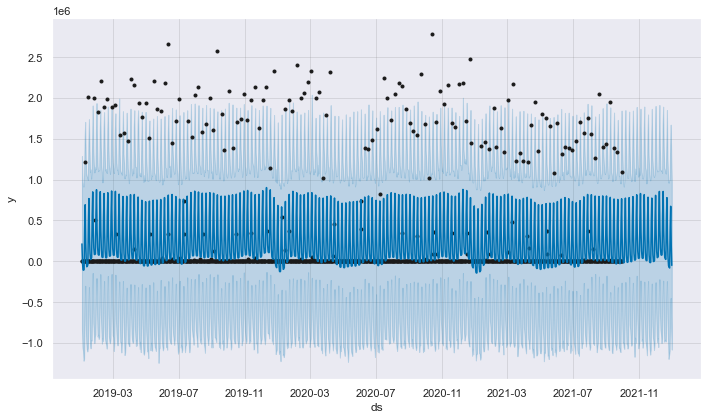

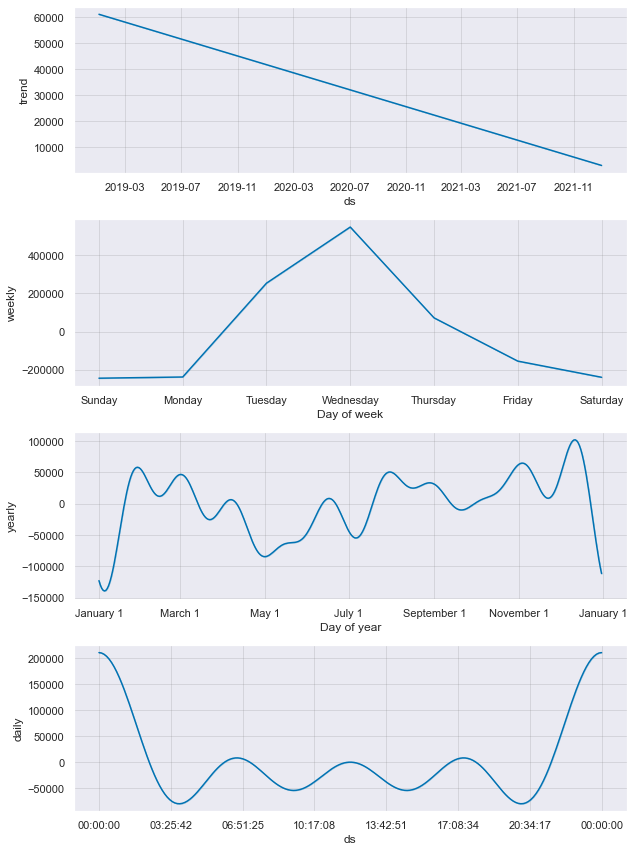

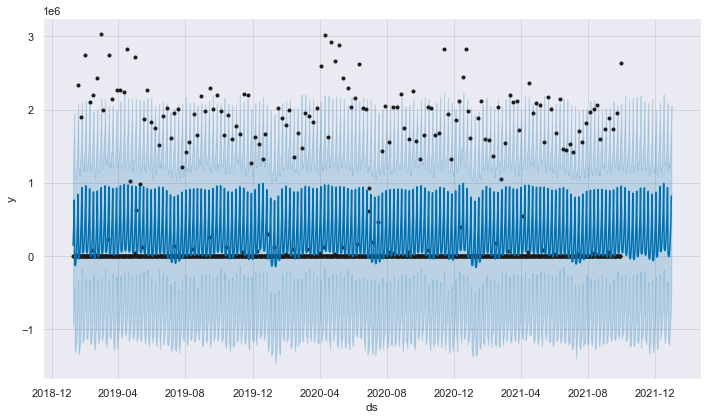

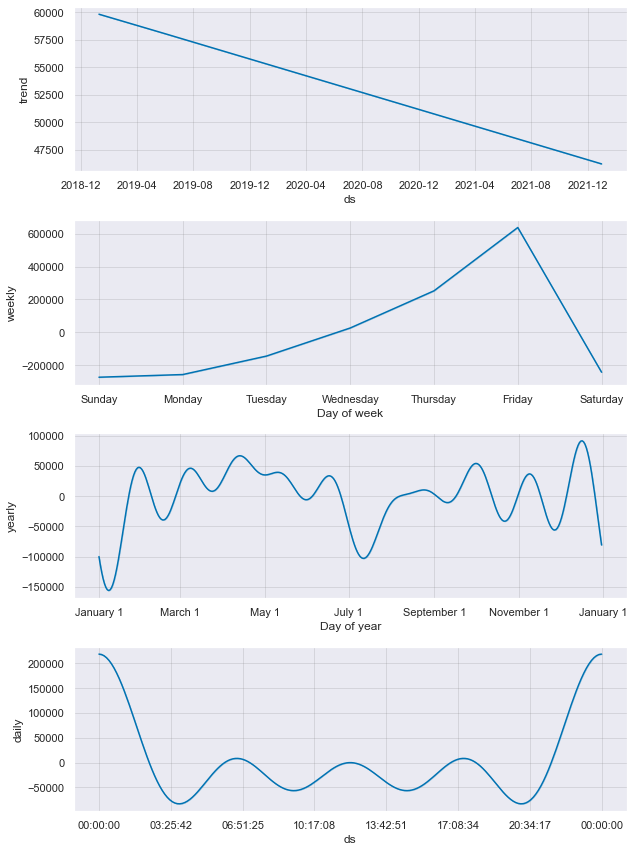

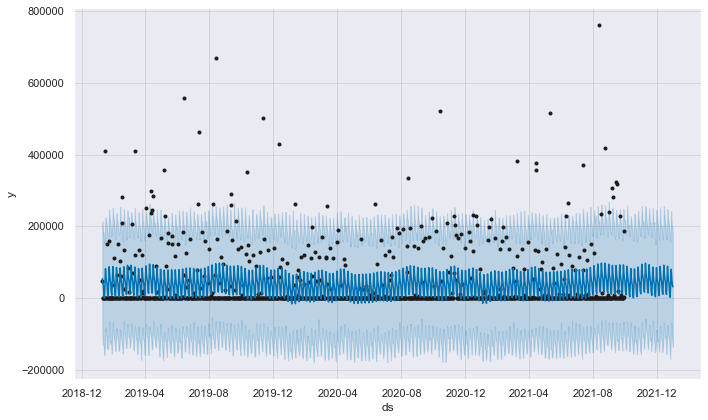

...

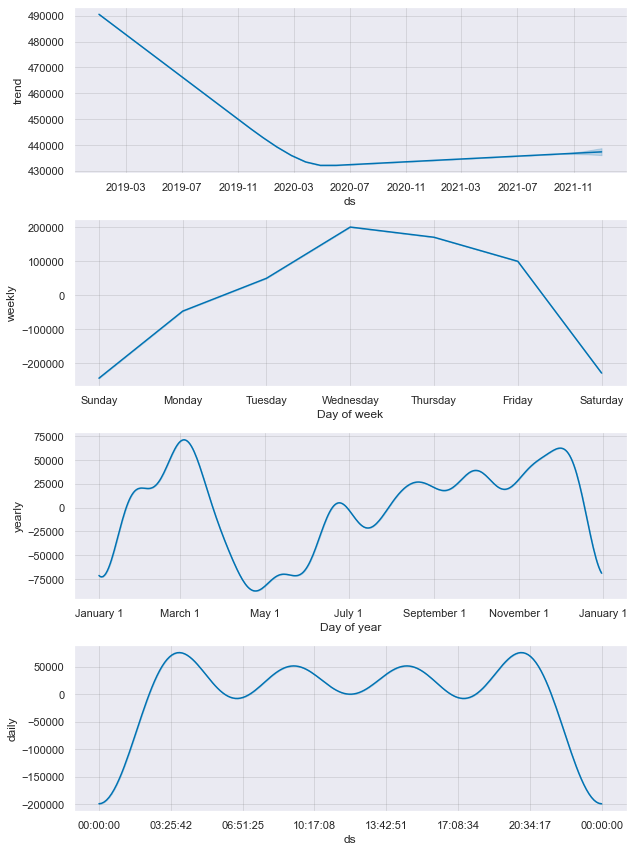

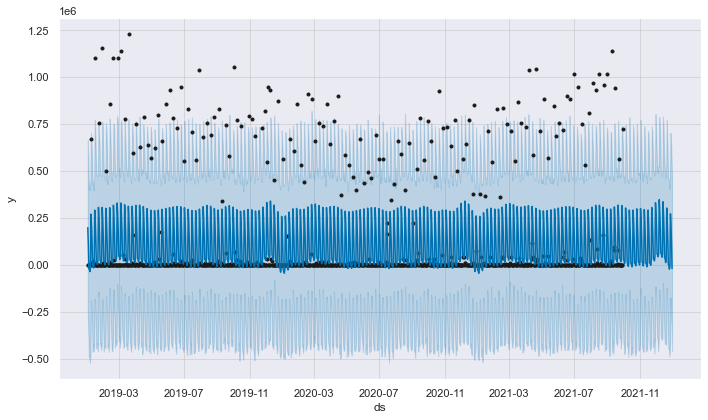

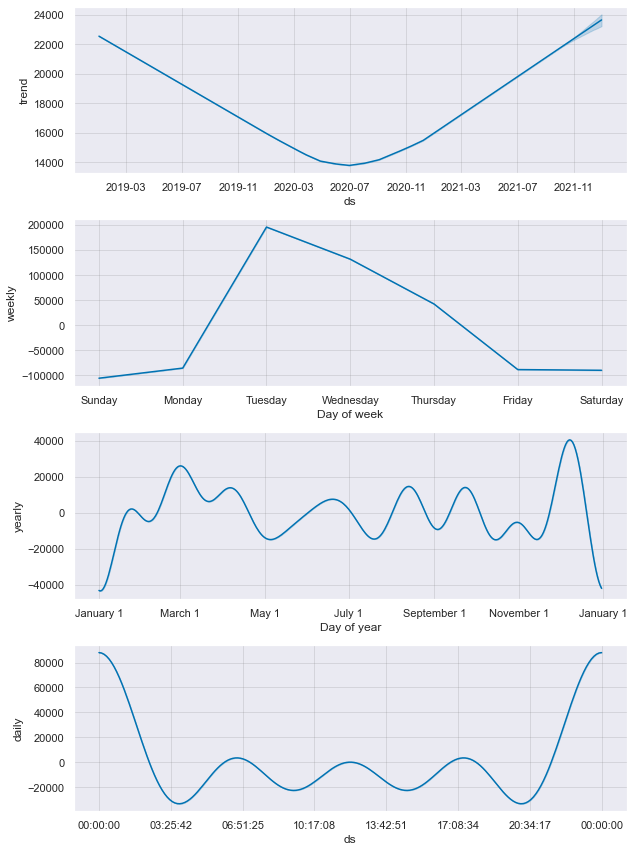

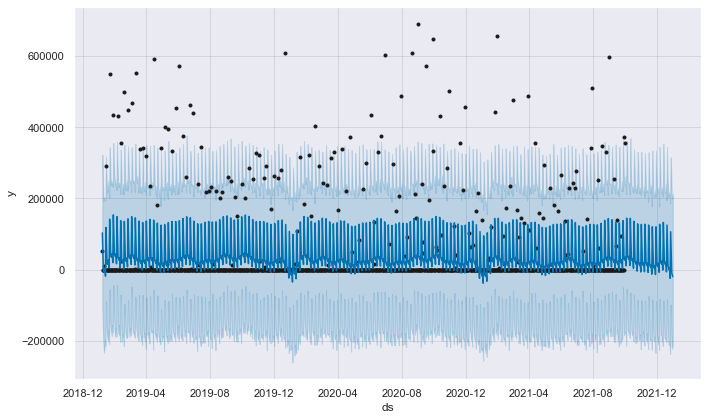

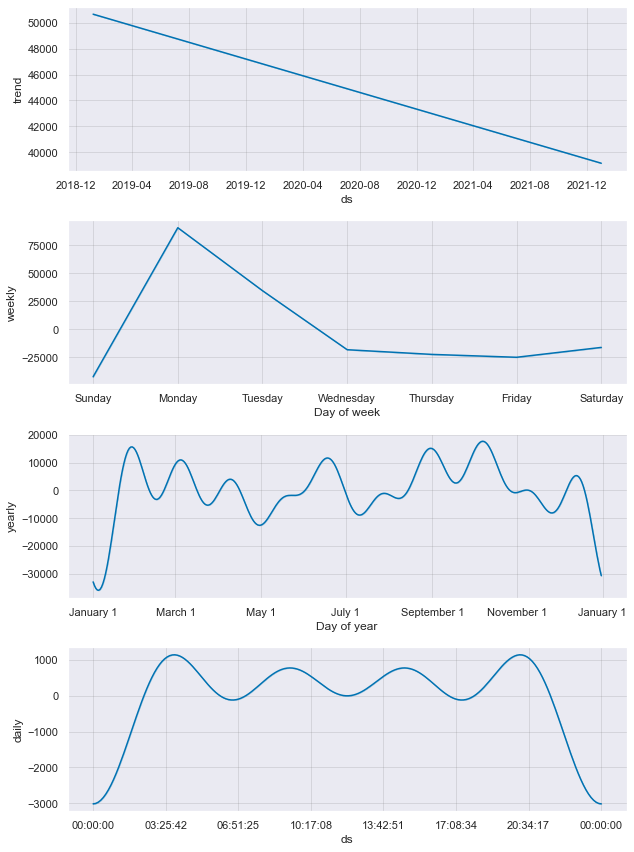

In [98]:
# Vamos a iterar nuestras predicciones para todos los dataframes de manera rapida.
for key in Empresas_dict_P_D.keys():

    # Seteamos nuestro predictor, Propeth.
    m_d = Prophet(interval_width=0.95, daily_seasonality=True)

    # Le hacemos fit a nuestro Dataframe.
    model = m_d.fit(Empresas_dict_P_D[key])

    # Seteamos nuestro forecast, para 100 periodos en frecuencia diaria.
    future = m_d.make_future_dataframe(periods=92,freq='D')

    # Predecimos nuestras variables.
    forecast = m_d.predict(future)

    # Ploteamos nuestras predicciones.
    plot1 = m_d.plot(forecast)

    # Ploteamos los componentes de nuestras predicciones.
    plot2 = m_d.plot_components(forecast)


##### Conclusion, Prophet, con resampling D.

- Si bien podria haber seguido, tratando de mejorar la serie, separar los graficos para que sea mas entendible,etc. lo que queria ver rapidamente era si tenia sentido trabajar mas con el modelo con resamplig diario. Rapidamente pude ver que las prediciones no eran acertadas.

- Que las predicciones no sean buenas, era algo esperable por la cantidad de dias sin valores, de una serie de aproximadamente 1000 dias, habia empresas que para 800 dias no tenian valores, muy dificil de esta manera poder hacer predicciones.

#### Prophet, con resampling W.

In [99]:
# Creamos un dict para las empresas.
Empresas_dict_P_W = {elem : pd.DataFrame() for elem in Empresas_names}

# Iteramos sobre el dict para unir cada key con su empresa correspondiente.
for key in Empresas_dict_P_W.keys():
    Empresas_dict_P_W[key] = Exportaciones_encod[:][Exportaciones_encod.EMPRESAS == key]

# Traemos los datos de la primer empresa, en nuestro dict, con resampling mensual.
Empresas_dict_P_W[1].resample('W').sum()

,AMOUNT_USD,EMPRESAS,CANTIDAD_DE_ORDENES
DATE,,,
2019-01-06,8307,1,1
2019-01-13,1210209,105,105
2019-01-20,2016876,150,150
2019-01-27,2000750,167,167
2019-02-03,2347105,163,163
...,...,...,...
2021-09-05,1442644,81,81
2021-09-12,1969590,155,155
2021-09-19,1386794,84,84


In [100]:
for key in Empresas_dict_P_W.keys():
    Empresas_dict_P_W[key] = Empresas_dict_P_W[key].resample('W').sum()
    Empresas_dict_P_W[key] = Empresas_dict_P_W[key].reset_index()
    Empresas_dict_P_W[key] = Empresas_dict_P_W[key].rename(columns={'AMOUNT_USD':'y','DATE':'ds'}, errors='ignore')
    Empresas_dict_P_W[key] = Empresas_dict_P_W[key].drop('EMPRESAS', axis=1, errors='ignore')

In [101]:
def Propeth_prediction_w(compania):
    m_w = Prophet(interval_width=0.95, weekly_seasonality=True)
    m_w.fit(Empresas_dict_P_W[compania])
    future_w = m_w.make_future_dataframe(periods=13,freq='W')
    forecast_w = m_w.predict(future_w)
    m_w.plot(forecast_w)
    m_w.plot_components(forecast_w)
    print(
            '\n',
            forecast_w.tail(14)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
         )

##### Empresa 1, W, Prophet.

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -10.7664
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       215.452   5.43564e-07       90.5711     0.05403      0.6249      128   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     125       215.452    9.8619e-09       81.2123      0.5563      0.5563      159   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance

             ds          yhat    yhat_lower    yhat_upper
143 2021-10-03  1.569157e+06  5.315370e+05  2.582764e+06
144 2021-10-10  1.626743e+06  5.751447e+05  2.579328e+06
145 2021-10-17  1.640245e+06  5.515162e+05  2.696662e+06
146 2021-10-24  1.708508e+06  6.572073e+05  2.626930e+06
147 2021-10-31  1.881398e+06  8.062096e+05  2.886964e+06
148 2021-11-07  2.018462e+06  1.019511e+06  3.095657e+06
149 2021-11-14  1.935253e+06  8.748638e+05  2.983496e+06
150 2021-11-21  1.686080e+06  6.282805

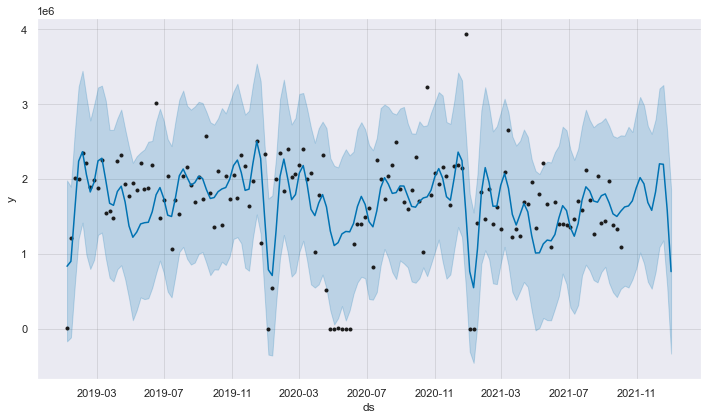

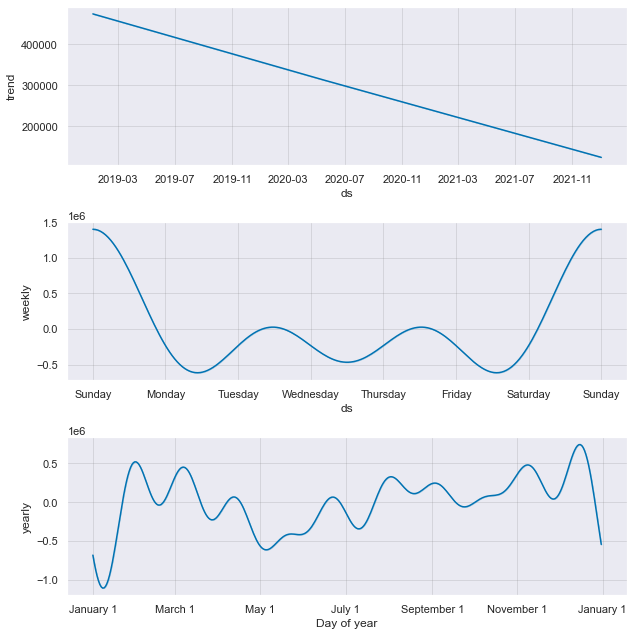

In [102]:
Propeth_prediction_w(1)

##### Empresa 2, W, Prophet.


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -6.27175
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       241.808   0.000257561        94.109      0.1861           1      123   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     141       241.832   8.30868e-07       99.1702   9.239e-09       0.001      215  LS failed, Hessian reset 
     158       241.832   8.68662e-09       96.1534      0.3431      0.3431      236   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance

             ds          yhat    yhat_lower    yhat_upper
142 2021-10-03  1.990636e+06  9.594325e+05  3.006936e+06
143 2021-10-10  1.881257e+06  8.250332e+05  2.909693e+06
144 2021-10-17  1.648081e+06  6.128296e+05  2.685387e+06
145 2021-10-24  1.545596e+06  4.616963e+05  2.593435e+06
146 2021-10-31  1.734532e+06  6.645420e+05  2.742425e+06
147 2021-11-07  2.039917e+06  1.026283e+0

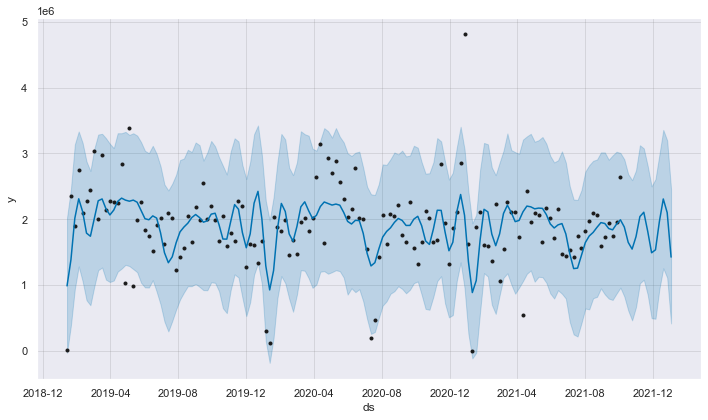

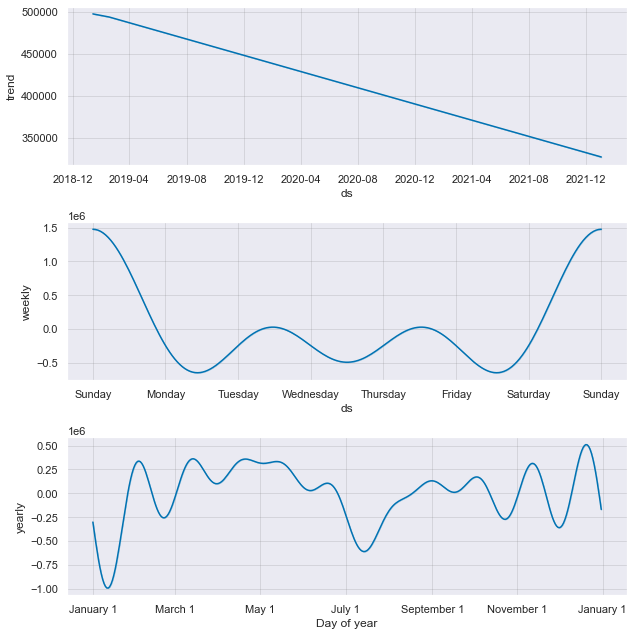

In [103]:
Propeth_prediction_w(2)

##### Empresa 3, W, Prophet.


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -6.99109
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       151.708   4.63964e-06       92.5836      0.1618           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     127       151.711    1.0775e-05       89.3949   9.903e-08       0.001      212  LS failed, Hessian reset 
     175       151.712    9.4203e-07       98.4269   9.888e-09       0.001      307  LS failed, Hessian reset 
     199       151.712   2.47959e-08       90.3366           1           1      339   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     201       151.712   9.19475e-09       96.2661      0.5312      0.5312      341   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance

             ds           yhat     yhat_lower     yhat_upper
142 2021-10-03  271061.515388 -12

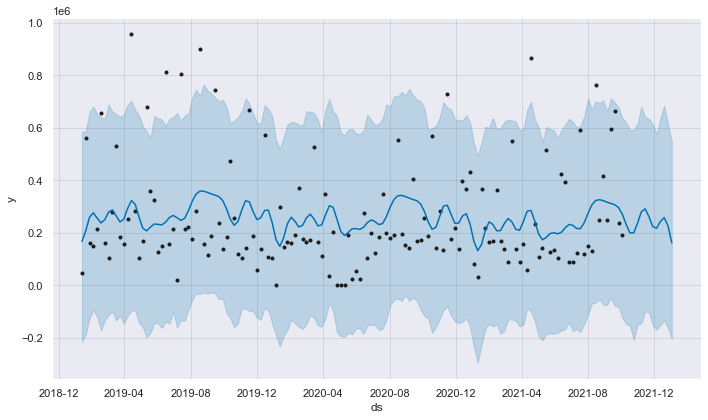

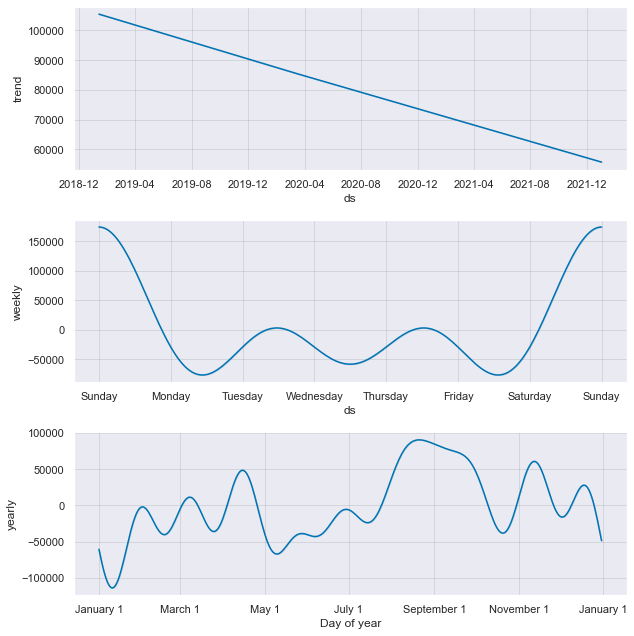

In [104]:
Propeth_prediction_w(3)

##### Empresa 4, W, Prophet.


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.80101
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       197.919   2.21127e-06       94.2942           1           1      130   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     137       197.949   9.64142e-05       97.2756   9.716e-07       0.001      230  LS failed, Hessian reset 
     199        197.97   4.71735e-08       88.0036      0.3317      0.7792      307   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     233        197.97   8.47445e-09       85.2069      0.3162      0.3162      349   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance

             ds          yhat    yhat_lower    yhat_upper
143 2021-10-03  1.748257e+06  8.534992e+05  2.627984e+06
144 2021-10-10  1.721348e+06  8.552686e+05  2.604028e+06
145 2021-10-17  1.711910e+06  8.4

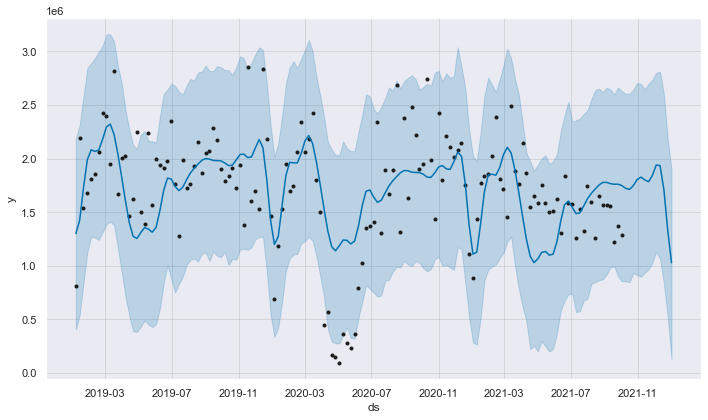

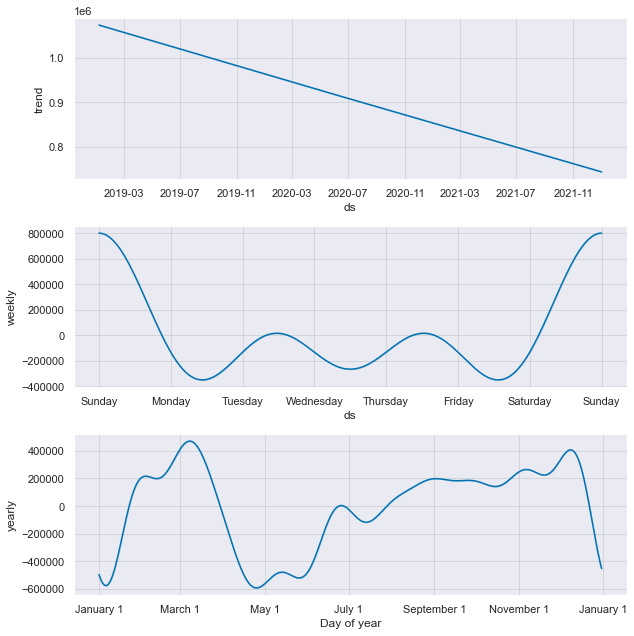

In [105]:
Propeth_prediction_w(4)

##### Empresa 5, W, Prophet.


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -9.66601
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      93       189.993   0.000119946       64.3709   1.605e-06       0.001      164  LS failed, Hessian reset 
      99       189.997   1.37895e-05       65.2804           1           1      173   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     136       190.011   1.73758e-05       59.9259   3.762e-07       0.001      275  LS failed, Hessian reset 
     181       190.026   6.80759e-09       65.0717      0.3073      0.3073      331   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance

             ds          yhat     yhat_lower    yhat_upper
143 2021-10-03  8.019246e+05  295285.420180  1.354670e+06
144 2021-10-10  7.331205e+05  227030.052318  1.232109e+06
145 2021-10-17  6.883345e+05  221088.631899  1.151883e+06
146 2021-10-24  7.036062e+05  178117.683

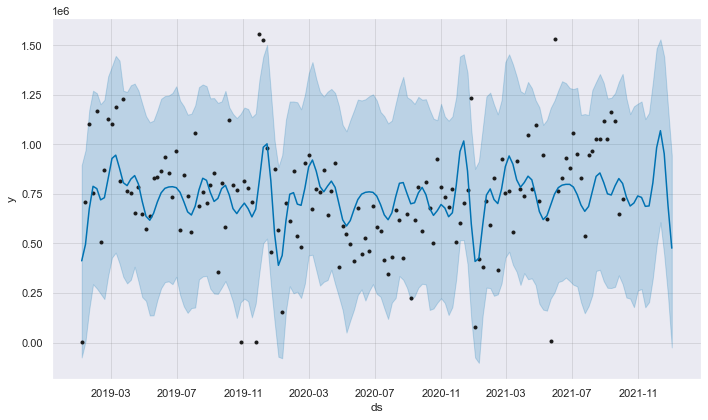

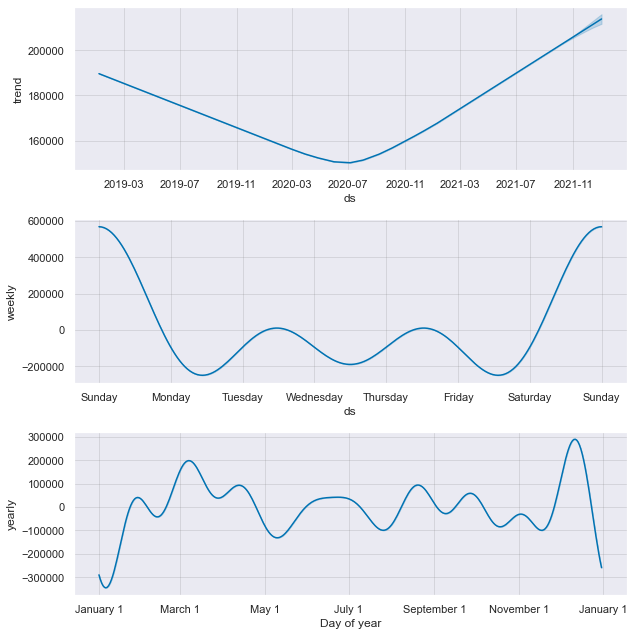

In [106]:
Propeth_prediction_w(5)

##### Empresa 6, W, Prophet.


INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


Initial log joint probability = -8.13871
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
      99       168.767   5.93638e-05       104.314       0.923       0.923      118   
    Iter      log prob        ||dx||      ||grad||       alpha      alpha0  # evals  Notes 
     108       168.818   0.000372568       97.1423   3.717e-06       0.001      187  LS failed, Hessian reset 
     158       168.848   7.98114e-09       102.382      0.8543      0.8543      254   
Optimization terminated normally: 
  Convergence detected: absolute parameter change was below tolerance

             ds           yhat     yhat_lower     yhat_upper
142 2021-10-03  317617.875650  -86855.352778  729745.836338
143 2021-10-10  359061.809204  -46084.584725  741208.009170
144 2021-10-17  362571.399086  -38703.784710  744959.046728
145 2021-10-24  334829.776342  -60157.385875  715763.439334
146 2021-10-31  309869.429894 -109403.784550  708043.375967
147 2021-11-07  293336.

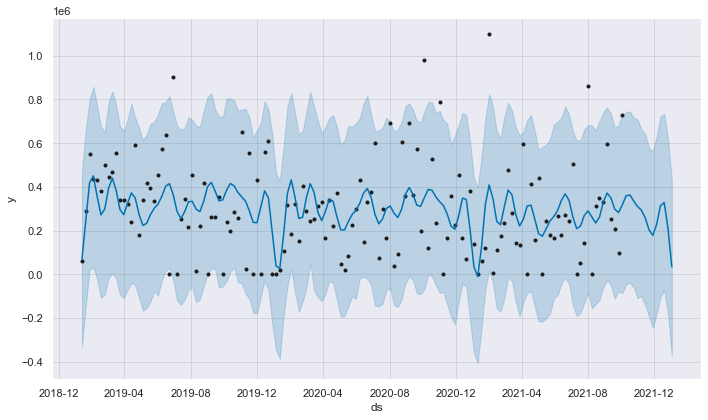

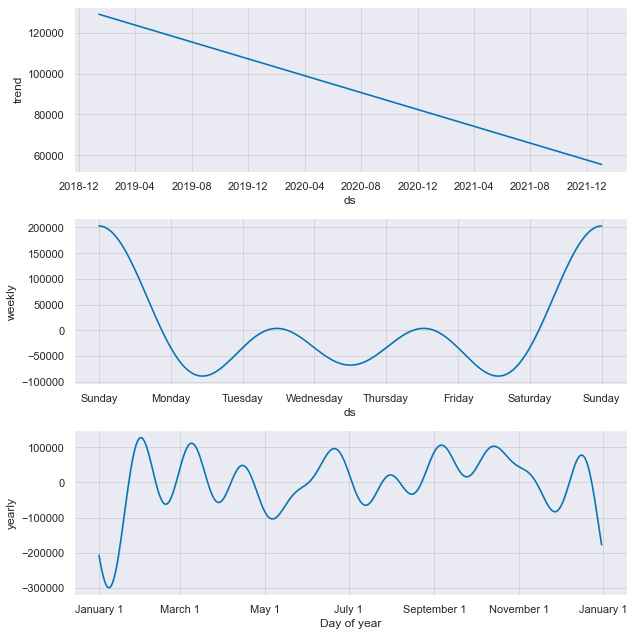

In [107]:
Propeth_prediction_w(6)

##### Conclusion, Prophet, con resampling W.

- Estoy conforme con los resultados obtenidos rapidamente, los modelos tuvieron buen poder predictivo y siento que ajustaron bien a los datos.

- Es el uso mas basico de Prophet, me quedaria tratar de usarlo agregando puntos de cambio por COVID, modificando la serie original (por ejemplo cambiando los meses post covid por sus promedios de 2019 y 2021), entre otras cosas.

- De todas maneras siento que es un modelo simple, que capaz para hacer rapido sirva y para dar una idea tambien, pero predecir las ventas, solo con las ventas pasadas, me parece un modelo que va a tener ciertos problemas cuando haya cambios de tendencia por distintos factores. Por ejemplo cambios en el precio del petroleo, cambios en los precios de ciertos comodities, o cualquier otro analisis mas soft que deberian tener los modelos predictivos.

- Al mismo tiempo agregar esa parte 'SOFT', agrega la incertidumbre de si esas predicciones son correctas, es decir dependes de predecir bien otras variables, ni que hablar del tiempo agregado de trabajo que significa eso.

#### Propeth, con resampling M.

In [108]:
# Creamos un dict para las empresas.
Empresas_dict_M = {elem : pd.DataFrame() for elem in Empresas_names}

# Iteramos sobre el dict para unir cada key con su empresa correspondiente.
for key in Empresas_dict_M.keys():
    Empresas_dict_M[key] = Exportaciones_encod[:][Exportaciones_encod.EMPRESAS == key]

# Traemos los datos de la primer empresa, en nuestro dict, con resampling mensual.
Empresas_dict_M[1].resample('M').sum()

,AMOUNT_USD,EMPRESAS,CANTIDAD_DE_ORDENES
DATE,,,
2019-01-31,5750092,434,434
2019-02-28,9798288,811,811
2019-03-31,6846614,659,659
2019-04-30,8251012,636,636
2019-05-31,9752505,754,754
2019-06-30,8397144,635,635
2019-07-31,8404076,654,654
2019-08-31,7790820,585,585
2019-09-30,7491077,559,559


In [109]:
for key in Empresas_dict_M.keys():
    Empresas_dict_M[key] = Empresas_dict_M[key].resample('M').sum()
    Empresas_dict_M[key] = Empresas_dict_M[key].reset_index()
    Empresas_dict_M[key] = Empresas_dict_M[key].rename(columns={'AMOUNT_USD':'y','DATE':'ds'}, errors='ignore')
    Empresas_dict_M[key] = Empresas_dict_M[key].drop(['EMPRESAS','CANTIDAD_DE_ORDENES'], axis=1, errors='ignore')

In [110]:
def Propeth_prediction_M(compania):
    model_M = Prophet(interval_width=0.95, seasonality_mode='multiplicative')
    model_M.fit(Empresas_dict_M[compania])
    future_M = model_M.make_future_dataframe(periods=3,freq='MS')
    forecast_M = model_M.predict(future_M)
    model_M.plot(forecast_M)
    model_M.plot_components(forecast_M)
    print('\n',forecast_M.tail(3)[['ds', 'yhat', 'yhat_lower', 'yhat_upper']])

##### Empresa 1, M, Prophet.

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -45.5025
Iteration  1. Log joint probability =    14.3426. Improved by 59.8451.
Iteration  2. Log joint probability =    36.0607. Improved by 21.7181.
Iteration  3. Log joint probability =    50.4271. Improved by 14.3663.
Iteration  4. Log joint probability =    54.5004. Improved by 4.07334.
Iteration  5. Log joint probability =    54.7277. Improved by 0.227298.
Iteration  6. Log joint probability =    54.9811. Improved by 0.253412.
Iteration  7. Log joint probability =    55.2975. Improved by 0.316393.
Iteration  8. Log joint probability =    55.4493. Improved by 0.151779.
Iteration  9. Log joint probability =    55.5317. Improved by 0.0823801.
Iteration 10. Log joint probability =    55.5547. Improved by 0.0230212.
Iteration 11. Log joint probability =    55.5568. Improved by 0.0021136.
Iteration 12. Log joint probability =    55.6009. Improved by 0.0441259.
Iteration 13. Log joint probability =    55.6185. Improved by 0.0175822.
Iteration 14. Log joi

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator



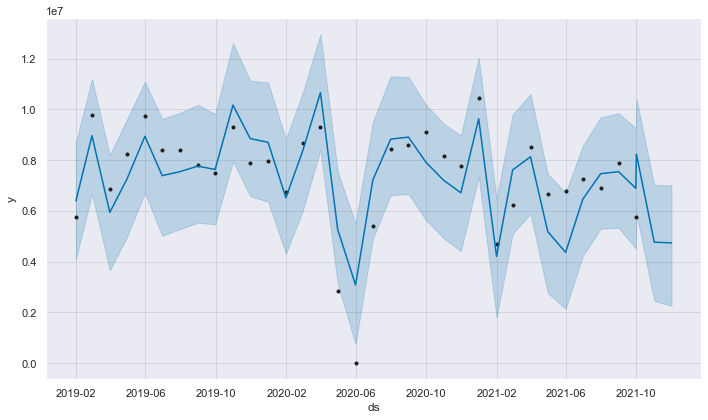

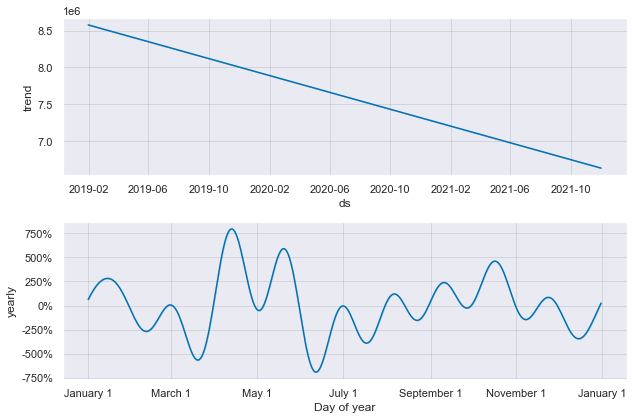

In [111]:
Propeth_prediction_M(1)

##### Empresa 2, M, Prophet.

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -44.9274
Iteration  1. Log joint probability =    30.8393. Improved by 75.7666.
Iteration  2. Log joint probability =    46.4422. Improved by 15.603.
Iteration  3. Log joint probability =    58.7053. Improved by 12.2631.
Iteration  4. Log joint probability =    72.4248. Improved by 13.7195.
Iteration  5. Log joint probability =    74.0867. Improved by 1.6619.
Iteration  6. Log joint probability =    74.7353. Improved by 0.64864.
Iteration  7. Log joint probability =    74.7368. Improved by 0.00142639.
Iteration  8. Log joint probability =    74.7416. Improved by 0.00487437.
Iteration  9. Log joint probability =    74.7609. Improved by 0.019224.
Iteration 10. Log joint probability =     74.771. Improved by 0.0101047.
Iteration 11. Log joint probability =    74.8115. Improved by 0.0405927.
Iteration 12. Log joint probability =    74.9306. Improved by 0.119023.
Iteration 13. Log joint probability =     74.988. Improved by 0.0574334.
Iteration 14. Log joint

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator



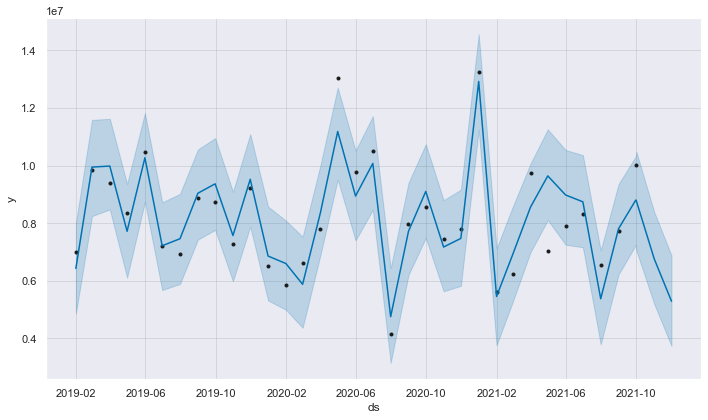

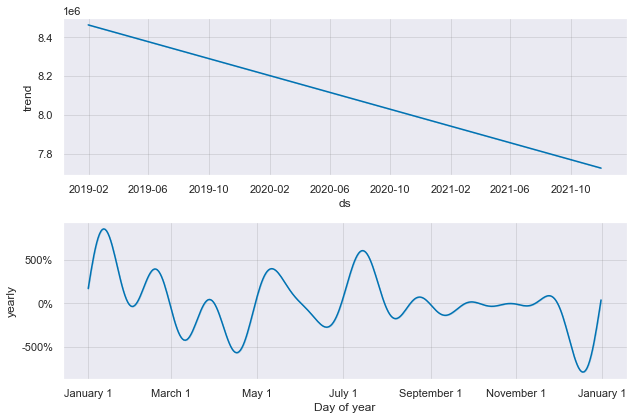

In [112]:
Propeth_prediction_M(2)

##### Empresa 3, M, Prophet.

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -45.8069
Iteration  1. Log joint probability =    9.01096. Improved by 54.8179.
Iteration  2. Log joint probability =    29.7528. Improved by 20.7418.
Iteration  3. Log joint probability =    43.1089. Improved by 13.3561.
Iteration  4. Log joint probability =     47.678. Improved by 4.56907.
Iteration  5. Log joint probability =     48.034. Improved by 0.356023.
Iteration  6. Log joint probability =    48.0381. Improved by 0.00410027.
Iteration  7. Log joint probability =    48.0415. Improved by 0.00338002.
Iteration  8. Log joint probability =    48.0459. Improved by 0.00435991.
Iteration  9. Log joint probability =     48.054. Improved by 0.00816585.
Iteration 10. Log joint probability =    48.0552. Improved by 0.00114707.
Iteration 11. Log joint probability =    48.0821. Improved by 0.0269233.
Iteration 12. Log joint probability =    48.4438. Improved by 0.361719.
Iteration 13. Log joint probability =    48.4617. Improved by 0.0178604.
Iteration 14. 

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator




            ds          yhat     yhat_lower    yhat_upper
33 2021-10-01  1.441098e+06  928488.377113  1.946835e+06
34 2021-11-01  9.234344e+05  428284.645946  1.437475e+06
35 2021-12-01  8.695364e+05  330150.505766  1.404699e+06


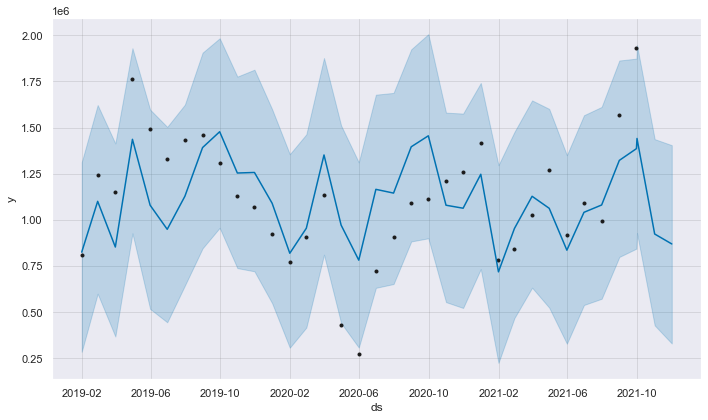

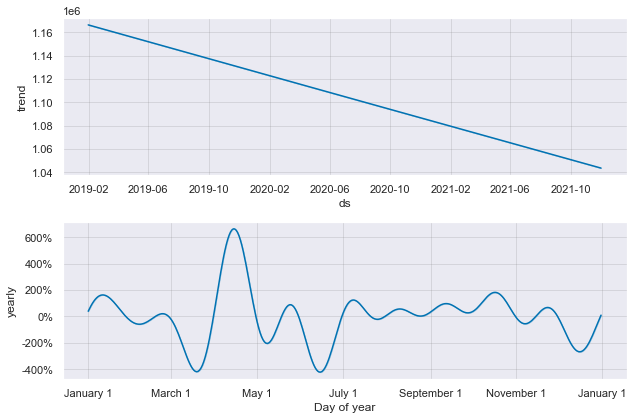

In [113]:
Propeth_prediction_M(3)

##### Empresa 4, M, Prophet.

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -45.0814
Iteration  1. Log joint probability =    15.6002. Improved by 60.6817.
Iteration  2. Log joint probability =    32.1099. Improved by 16.5097.
Iteration  3. Log joint probability =    42.4668. Improved by 10.3569.
Iteration  4. Log joint probability =    48.2308. Improved by 5.76398.
Iteration  5. Log joint probability =    49.7376. Improved by 1.50681.
Iteration  6. Log joint probability =    50.0476. Improved by 0.310001.
Iteration  7. Log joint probability =    50.0747. Improved by 0.027079.
Iteration  8. Log joint probability =    50.0941. Improved by 0.0194657.
Iteration  9. Log joint probability =    50.1174. Improved by 0.0232892.
Iteration 10. Log joint probability =    50.1288. Improved by 0.0113791.
Iteration 11. Log joint probability =     50.203. Improved by 0.0741721.
Iteration 12. Log joint probability =    50.2228. Improved by 0.0198231.
Iteration 13. Log joint probability =    50.2924. Improved by 0.0696078.
Iteration 14. Log joi

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator




            ds          yhat    yhat_lower    yhat_upper
33 2021-10-01  7.986492e+06  5.432977e+06  1.027176e+07
34 2021-11-01  8.441954e+06  5.988589e+06  1.081556e+07
35 2021-12-01  5.230560e+06  2.881033e+06  7.670273e+06


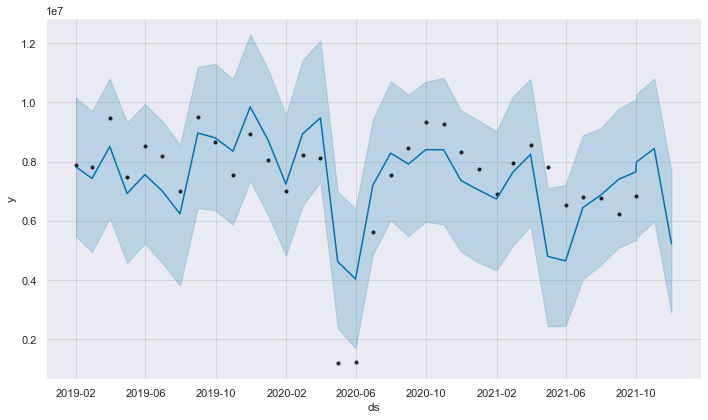

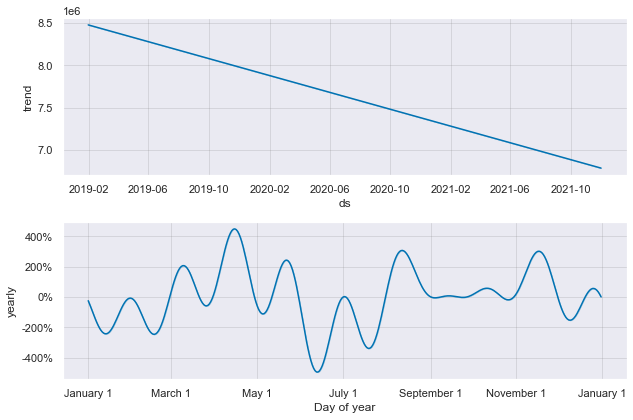

In [114]:
Propeth_prediction_M(4)

##### Empresa 5, M, Prophet.

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -45.6112
Iteration  1. Log joint probability =   -1.74026. Improved by 43.8709.
Iteration  2. Log joint probability =    10.0476. Improved by 11.7879.
Iteration  3. Log joint probability =    25.7438. Improved by 15.6962.
Iteration  4. Log joint probability =     33.897. Improved by 8.15312.
Iteration  5. Log joint probability =    46.4011. Improved by 12.5042.
Iteration  6. Log joint probability =    51.3062. Improved by 4.90507.
Iteration  7. Log joint probability =    52.3013. Improved by 0.995128.
Iteration  8. Log joint probability =    52.4103. Improved by 0.108977.
Iteration  9. Log joint probability =    52.4548. Improved by 0.0444865.
Iteration 10. Log joint probability =    52.5027. Improved by 0.0479167.
Iteration 11. Log joint probability =    52.6194. Improved by 0.116718.
Iteration 12. Log joint probability =    52.6649. Improved by 0.0454943.
Iteration 13. Log joint probability =    52.6858. Improved by 0.0208431.
Iteration 14. Log joint 

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator



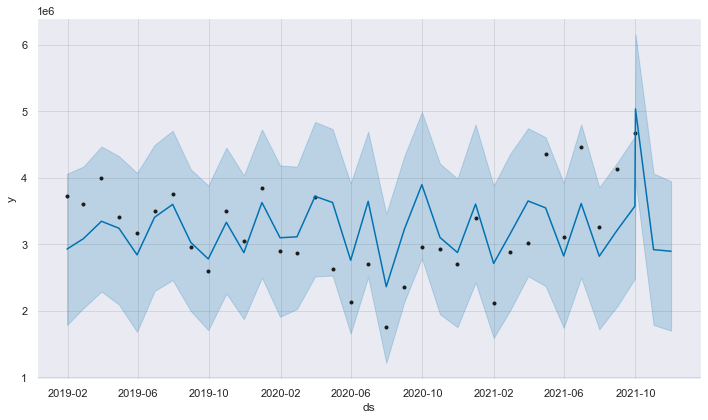

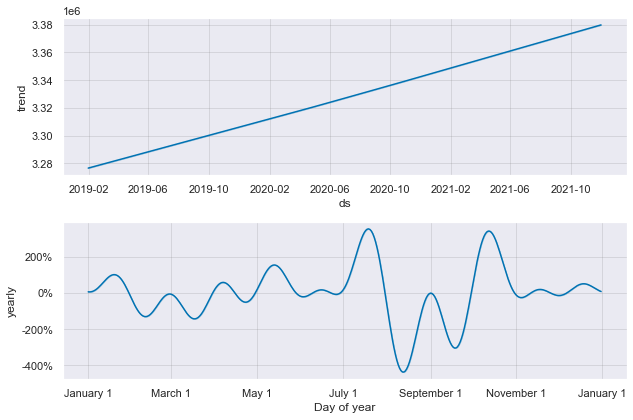

In [115]:
Propeth_prediction_M(5)

##### Empresa 6, M, Prophet.

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.



Initial log joint probability = -45.0785
Iteration  1. Log joint probability =    28.9546. Improved by 74.0331.
Iteration  2. Log joint probability =    48.0576. Improved by 19.103.
Iteration  3. Log joint probability =    51.4273. Improved by 3.3697.
Iteration  4. Log joint probability =    51.4845. Improved by 0.0571897.
Iteration  5. Log joint probability =    51.6168. Improved by 0.132272.
Iteration  6. Log joint probability =    51.6673. Improved by 0.0505112.
Iteration  7. Log joint probability =    51.6867. Improved by 0.0193703.
Iteration  8. Log joint probability =     51.687. Improved by 0.000291374.
Iteration  9. Log joint probability =    51.6912. Improved by 0.00417472.
Iteration 10. Log joint probability =    51.6924. Improved by 0.00123514.
Iteration 11. Log joint probability =    51.7045. Improved by 0.0121203.
Iteration 12. Log joint probability =    51.7174. Improved by 0.0129007.
Iteration 13. Log joint probability =    51.7254. Improved by 0.00798125.
Iteration 14.

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/fbprophet/plot.py:422: UserWarning:

FixedFormatter should only be used together with FixedLocator




            ds          yhat    yhat_lower    yhat_upper
33 2021-10-01  1.759423e+06  1.240789e+06  2.275250e+06
34 2021-11-01  1.115321e+06  6.164480e+05  1.649871e+06
35 2021-12-01  3.134796e+05 -2.091327e+05  8.379274e+05


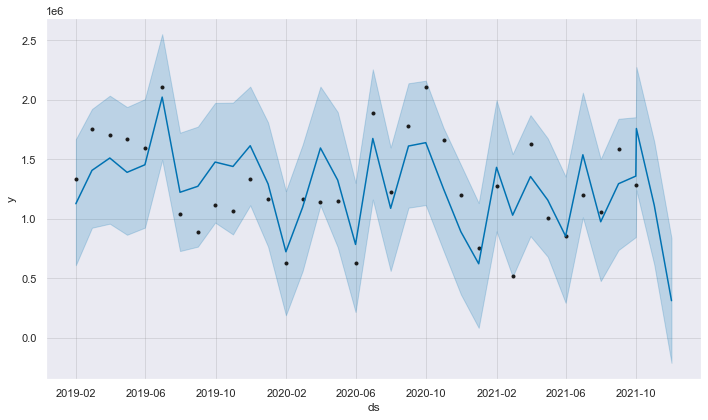

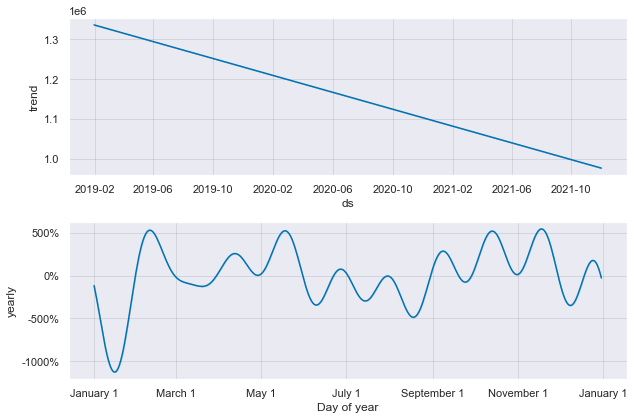

In [116]:
Propeth_prediction_M(6)

##### Conclusion, Propeth, con resampling M.

- Conclusion semejante a la de resampling semanal, estoy conforme con las predicciones, reconozco las limitaciones del modelo, que lo utilice de una manera simple sin ir en mucho detalle, que no refleja otras variables mas que si mismo y el tiempo para predecir el futuro, que no trabaje mas la serie sobretodo con un suceso importante como COVID en el medio, etc.

### ARIMA y AUTOARIMA.

ACLARACION IMPORTANTE: Se que estos modelos deberian haber sido entrenados (en general utilizo el 80% para esto) y ver como predicen el otro 20%, es un paso fundamental. Sencillamente me quede para la presentacion con el modelo generado con Prophet, y deje esta tarea que es fundamental de lado.

Voy a trabajar ARIMA y AUTOARIMA juntos, asi es mas facil visualizar para cada empresa la diferencias entre estos.


En los AUTOARIMA hay que tener en consideracion:
- Este esta configurado para que elija como mejor modelo exclusivamente el que brinde un AIC menor, lo cual es un criterio de decision limitado, dado que si bien es importante minimizar el AIC, siempre es importante evaluar otras cuestiones.

- Importante leer las advertencias que nos genera.

- Los AUTOARIMA, cuando tenia el m=54 (es decir suponer que habia seasonality cada 1 año, los modelos me daban un poco mejor el output, pero tardaban bastante en cargar). Como este test es meramente introductorio decidi poner m=4, pero claramente habria que probar varios seteos distintos para estos AUTOARIMA para ver cual daria mejores resultados.

- Quise probar los AUTOARIMA como solucion rapida, y los resultados rapidos obtenidos con este sistema no me gustaron. Obviamente estos modelos deberia seguir modificando los seteos para intentar obtener resultados mejores, a nivel general me parecio mas rapido en relacion con su calidad, los modelos ARIMA analizados en base a los graficos.

- Los AUTOARIMA, no parecieran buenos modelos predictivos, habria que modificar los settings, splitearlos para testearlos, y tratar de mejorarlos. Diria que los pases por alto, pero los deje porque capaz los ves por arriba, vez algun error y se pueda corregir facilmente.

#### Seteos generales para nuestros ARIMA y AUTOARIMA.

In [117]:
# Creamos un dict para las empresas.
Empresas_dict_A_W = {elem : pd.DataFrame() for elem in Empresas_names}

# Iteramos sobre el dict para unir cada key con su empresa correspondiente.
for key in Empresas_dict_A_W.keys():
    Empresas_dict_A_W[key] = Exportaciones_encod[:][Exportaciones_encod.EMPRESAS == key]

# Traemos los datos de la primer empresa, en nuestro dict, con resampling mensual.
Empresas_dict_A_W[1].resample('W').sum()

,AMOUNT_USD,EMPRESAS,CANTIDAD_DE_ORDENES
DATE,,,
2019-01-06,8307,1,1
2019-01-13,1210209,105,105
2019-01-20,2016876,150,150
2019-01-27,2000750,167,167
2019-02-03,2347105,163,163
...,...,...,...
2021-09-05,1442644,81,81
2021-09-12,1969590,155,155
2021-09-19,1386794,84,84


In [118]:
# Iteramos para que los cambios apliquen a todos los Dataframes de nuestro dict.
for key in Empresas_dict_A_W.keys():
    # Hacemos resampling semanal para todas las empresas.
    Empresas_dict_A_W[key] = Empresas_dict_A_W[key].resample('W').sum()

    # Dropeamos para nuestros Dataframes dentro del dict la columna empresas, ya que no posee mucho sentido, ya que es la sumatoria de que empresa es cada una.
    Empresas_dict_A_W[key] = Empresas_dict_A_W[key].drop(['EMPRESAS','CANTIDAD_DE_ORDENES'], axis=1, errors='ignore')

In [119]:
# Definamos una funcion que nos ayude a quitar los outliers para mejorar el poder predictivo de nuestro modelo.
def quitamosoutliers(compania):

    # Configuremos el tamaño de los subplots.
    fig, ax = plt.subplots(figsize=(20, 6))

    # Plotiemos la variable AMOUNT_USD para nuestro data frame sin modificar.
    ax.plot(Empresas_dict_A_W[compania].AMOUNT_USD, label='Grafico Original')

    # Saquemos cualquier outlier con un Z > 3. Este proceso podriamos elegir repetirlo, porque despues de sacar nuestro outlier, puede que aparezcan otros al sacar ese valor extremo.
    Empresas_dict_A_W[compania].loc[(np.abs(stats.zscore(Empresas_dict_A_W[compania])) > 3).all(axis=1), 'AMOUNT_USD'] = np.mean(Empresas_dict_A_W[compania].AMOUNT_USD)

    # Plotiemos como quedo la variable AMOUNT_USD.
    ax.plot(Empresas_dict_A_W[compania].AMOUNT_USD, label='Grafico Nuevo')
    ax.legend()
    plt.show()

In [120]:
# Haremos una funcion que nos ayudara a ver si tenemos que diferenciar, y que AR seria correcto usar.
def seteemos_AR(compania):

    plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

    # Original Series
    fig, ax = plt.subplots(3, 2)

    # Ploteamos la serie original
    ax[0, 0].plot(Empresas_dict_A_W[compania].AMOUNT_USD)
    ax[0, 0].set_title('Original Series')

    # Seteamos los x axis.
    ax[0, 0].xaxis.set_major_formatter(formatter)
    ax[0, 0].xaxis.set_minor_formatter(date_form)

    # Ploteamos los coeficientes de correlacion para la serie original.
    plot_acf(Empresas_dict_A_W[compania].AMOUNT_USD, ax=ax[0,1])

    # 1st Differencing
    # Ploteamos la serie diferenciada 1 vez.
    ax[1, 0].plot(Empresas_dict_A_W[compania].AMOUNT_USD.diff())
    ax[1, 0].set_title('1st Order Differencing')

    # Seteamos los x axis.
    ax[1, 0].xaxis.set_major_formatter(formatter)
    ax[1, 0].xaxis.set_minor_formatter(date_form)

    # Ploteamos los coeficientes de correlacion para la serie diferenciada 1 vez.
    plot_acf(Empresas_dict_A_W[compania].AMOUNT_USD.diff().dropna(), ax=ax[1, 1])


    # 2nd Differencing
    # Ploteamos la serie diferenciada 2 veces.
    ax[2, 0].plot(Empresas_dict_A_W[compania].AMOUNT_USD.diff().diff())
    ax[2, 0].set_title('2nd Order Differencing')

    # Seteamos los x axis.
    ax[2, 0].xaxis.set_major_formatter(formatter)
    ax[2, 0].xaxis.set_minor_formatter(date_form)

    # Ploteamos los coeficientes de correlacion para la serie diferenciada 2 veces.
    plot_acf(Empresas_dict_A_W[compania].AMOUNT_USD.diff().diff().dropna(), ax=ax[2, 1])

    fig.tight_layout()

In [121]:
# Haremos una funcion que nos ayudara a ver si tenemos que diferenciar, y que MA seria correcto usar.
def seteemos_MA(compania):

    plt.rcParams.update({'figure.figsize':(9,7), 'figure.dpi':120})

    # Original Series
    fig, ax = plt.subplots(3, 2)

    # Ploteamos la serie original
    ax[0, 0].plot(Empresas_dict_A_W[compania].AMOUNT_USD)
    ax[0, 0].set_title('Original Series')

    # Seteamos los x axis.
    ax[0, 0].xaxis.set_major_formatter(formatter)
    ax[0, 0].xaxis.set_minor_formatter(date_form)

    # Ploteamos los coeficientes de correlacion parcial para la serie original.
    plot_pacf(Empresas_dict_A_W[compania].AMOUNT_USD, ax=ax[0,1])

    # 1st Differencing
    # Ploteamos la serie diferenciada 1 vez.
    ax[1, 0].plot(Empresas_dict_A_W[compania].AMOUNT_USD.diff())
    ax[1, 0].set_title('1st Order Differencing')

    # Seteamos los x axis.
    ax[1, 0].xaxis.set_major_formatter(formatter)
    ax[1, 0].xaxis.set_minor_formatter(date_form)

    # Ploteamos los coeficientes de correlacion parcial para la serie diferenciada 1 vez.
    plot_pacf(Empresas_dict_A_W[compania].AMOUNT_USD.diff().dropna(), ax=ax[1, 1])


    # 2nd Differencing
    # Ploteamos la serie diferenciada 2 veces.
    ax[2, 0].plot(Empresas_dict_A_W[compania].AMOUNT_USD.diff().diff())
    ax[2, 0].set_title('2nd Order Differencing')

    # Seteamos los x axis.
    ax[2, 0].xaxis.set_major_formatter(formatter)
    ax[2, 0].xaxis.set_minor_formatter(date_form)

    # Ploteamos los coeficientes de correlacion parcial para la serie diferenciada 2 veces.
    plot_pacf(Empresas_dict_A_W[compania].AMOUNT_USD.diff().diff().dropna(), ax=ax[2, 1])

    fig.tight_layout()

In [122]:
# Haremos una funcion que nos ayude a ejecutar un test adfuller para ver si hay estacionariedad.
def testadfuller(compania):
    result1 = adfuller(Empresas_dict_A_W[compania].AMOUNT_USD)
    
    print(
            'ADF Statistic: {}'.format(result1[0]),
            '\n p-value: {}'.format(result1[1]),
            '\n Critical Values:'
            )
    
    # Vamos a traernos los values para el 1%,5% y 10% de significancia.
    for key, value in result1[4].items():
        print('\t{}: {}'.format(key, value))

In [123]:
# Funcion para correr la funcion de autoarima.
def autoarima_W(compania):
    model = pm.auto_arima(
                      Empresas_dict_A_W[1].AMOUNT_USD, 
                      start_p=0, start_q=0,
                      test='adf',       # use adftest to find optimal 'd'
                      max_p=5, max_q=5, # maximum p and q
                      d=None,           # let model determine 'd'
                      start_P=0, 
                      D=0,
                      m=4,
                      seasonal=True, 
                      trace=True,
                      error_action='ignore',  
                      suppress_warnings=True, 
                      stepwise=True,
                      randrom_state=23, n_fits=50
                      )
    print(model.summary(),
        '\n',
        'Los valores predictos para las proximas 13 semanas son:',
        model.predict(n_periods=13)
        )

In [124]:
# Funcion para correr arimas con los indicadores seteados manualmente.
def modelo_arima(compania,p,d,q):
     modelx = ARIMA(Empresas_dict_A_W[compania].AMOUNT_USD, order=(p,d,q))
     model_fit = modelx.fit()
     print(model_fit.summary(),
          '\n',
          model_fit.forecast(13, alpha=0.05).tail(15)
          )

In [125]:
# Plot residual errors
def ploteo_residual(compania,p,d,q):
    modelx = ARIMA(Empresas_dict_A_W[compania].AMOUNT_USD, order=(p,d,q))
    model_fit = modelx.fit()
    residuals = pd.DataFrame(model_fit.resid)
    fig, ax = plt.subplots(1,2)
    residuals.plot(title="Residuals", ax=ax[0])
    residuals.plot(kind='kde', title='Density', ax=ax[1])
    plt.show()

##### Conclusiones de los seteos generales para nuestros ARIMA y AUTOARIMA.

- La idea del test de adfuller es que se testea a cola izquierda si hay raices unitarias o no. Si rechazamos es porque tenemos informacion para una confianza del 1%,5% o 10% para decir que no tiene raices unitarias. En caso de que esto suceda deberiamos diferenciar hasta que para nuestro nivel de significancia no rechacemos la hipotesis nula.

- Que no tengamos raices unitarias significa que no tenemos estacionariedad, el cual es un fundamento necesario para que podamos correr nuestros arimas.

- De nuestras series veremos los coeficientes de correlacion, para setear en nuestro ARIMA el AR, luego para el MA necesitamos que los coeficientes sean reversibles y que sean significativos para el modelo.

- La I de ARIMA es por la cantidad de veces que diferenciamos nuestra serie original.

- Para modelos ARIMAS necesitamos minimamente siempre 50 valores y el ideal es estar por encima de 100. En frecuencia mensual tenemos solo 33 datos, por lo cual se que los resultados no van a ser los adecuados, por lo cual voy a trabajarlos solo en frecuencia semanal.

#### AUTOARIMA, Empresa 1.

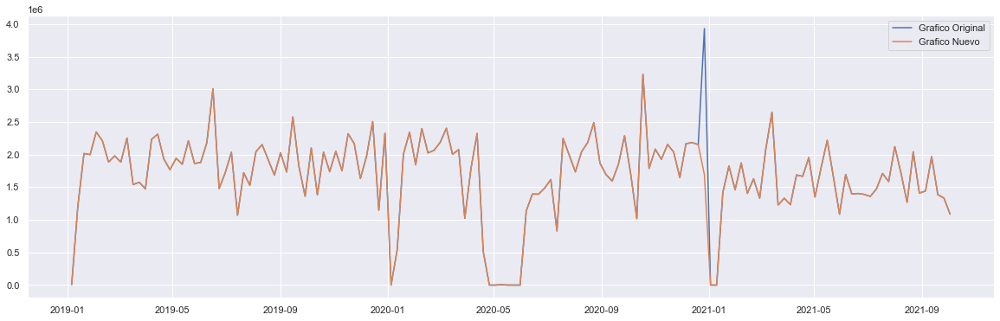

In [126]:
quitamosoutliers(1)

In [127]:
autoarima_W(1)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[4] intercept   : AIC=4252.224, Time=0.39 sec
 ARIMA(0,0,0)(0,0,0)[4] intercept   : AIC=4254.450, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[4] intercept   : AIC=4224.326, Time=0.05 sec
 ARIMA(0,0,1)(0,0,1)[4] intercept   : AIC=4232.368, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[4]             : AIC=4557.007, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[4] intercept   : AIC=4222.326, Time=0.01 sec
 ARIMA(1,0,0)(0,0,1)[4] intercept   : AIC=4224.278, Time=0.02 sec
 ARIMA(1,0,0)(1,0,1)[4] intercept   : AIC=4226.158, Time=0.10 sec
 ARIMA(2,0,0)(0,0,0)[4] intercept   : AIC=4222.618, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[4] intercept   : AIC=4222.672, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[4] intercept   : AIC=4231.251, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[4] intercept   : AIC=4224.334, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[4]             : AIC=4258.447, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[4] intercept
Total fit time: 0.786 seconds
                      

##### Conclusion AUTOARIMA, Empresa 1.

- El modelo planteado es un AR = 1 , d = 0, MA = 0.

- Los coeficientes dieron significativos y a nivel general, para ser un AUTOARIMA diria que es una buena base. 

- No me gusta que sea un modelo AR=1 , porque seria suponer que las ventas dependen solo de las ventas de la semana pasada, pero al ser un modelo simple voy a dejarlo asi.

#### ARIMA, Empresa 1.

Seguiremos trabajando en base al dataframe calculado en la seccion de AUTOARIMA, con quitamosoutliers.

In [128]:
testadfuller(1)

ADF Statistic: -4.37112211648685 
 p-value: 0.0003337804578952014 
 Critical Values:
	1%: -3.4776006742422374
	5%: -2.882265832283648
	10%: -2.5778219289774156


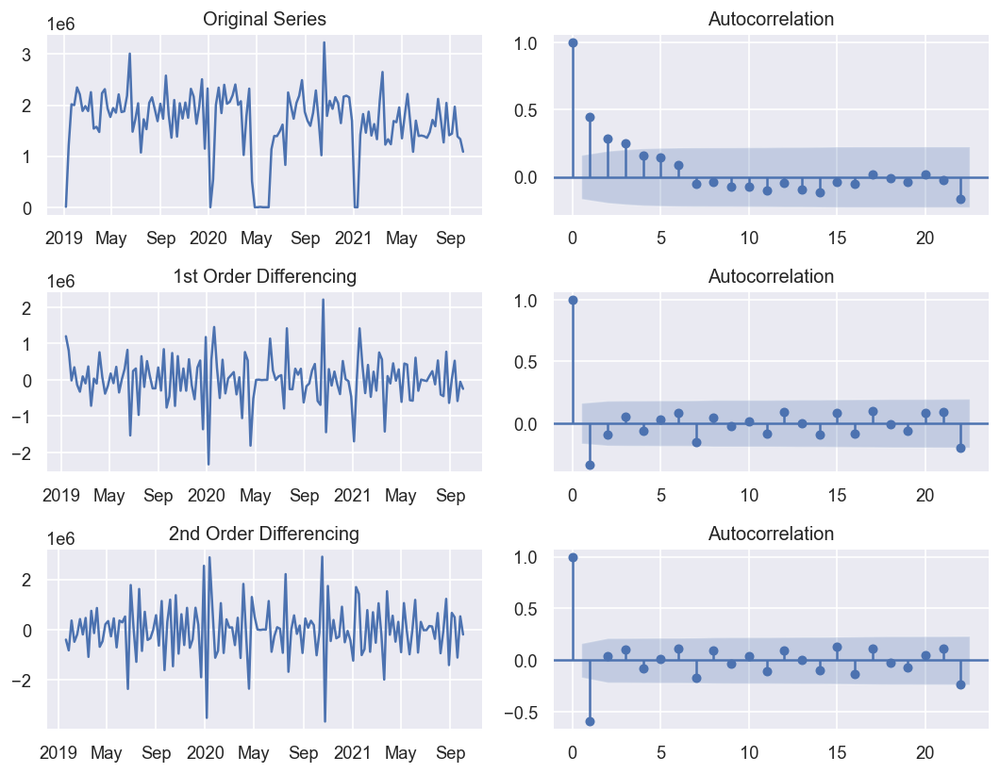

In [129]:
seteemos_AR(1)

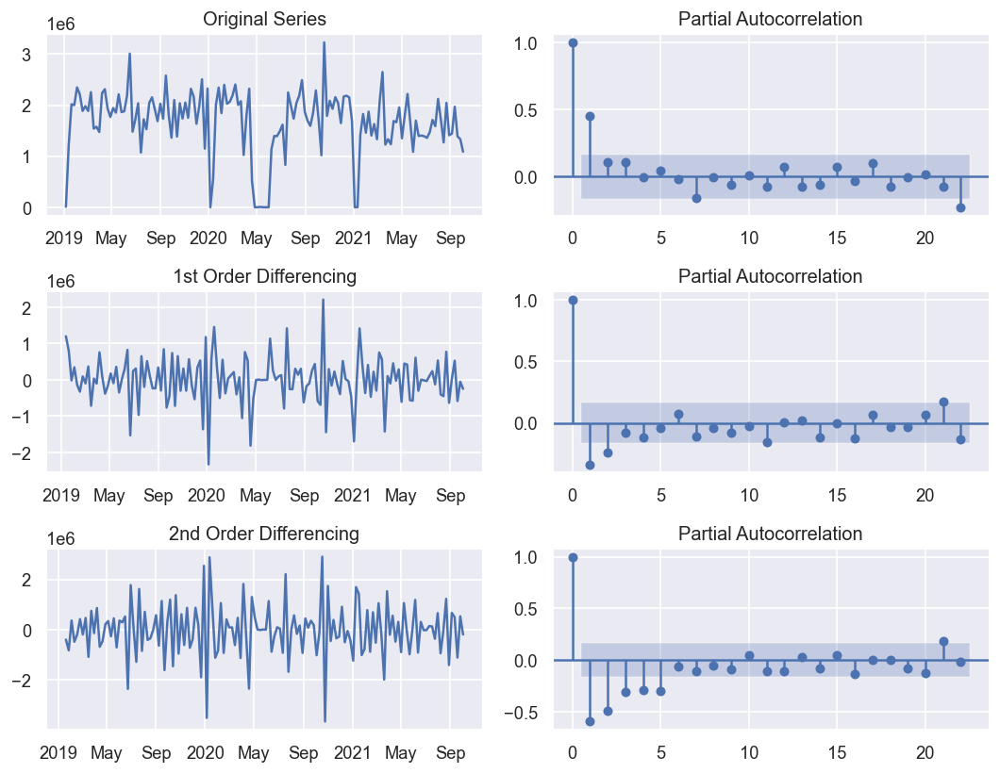

In [130]:
seteemos_MA(1)

In [131]:
# Si bien por los graficos deberia ser un modelo arima AR=3, d=0, MA=1 , me daban insignificancia los coeficientes, sin embargo el modelo propuesto me parece acorde. 
modelo_arima(1,3,0,2)

                               SARIMAX Results                                
Dep. Variable:             AMOUNT_USD   No. Observations:                  144
Model:                 ARIMA(3, 0, 2)   Log Likelihood               -2106.110
Date:                Tue, 12 Apr 2022   AIC                           4226.219
Time:                        14:20:53   BIC                           4247.008
Sample:                    01-06-2019   HQIC                          4234.666
                         - 10-03-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.677e+06    9.2e+04     18.241      0.000     1.5e+06    1.86e+06
ar.L1         -0.4712      0.145     -3.260      0.001      -0.754      -0.188
ar.L2         -0.3639      0.163     -2.234      0.0

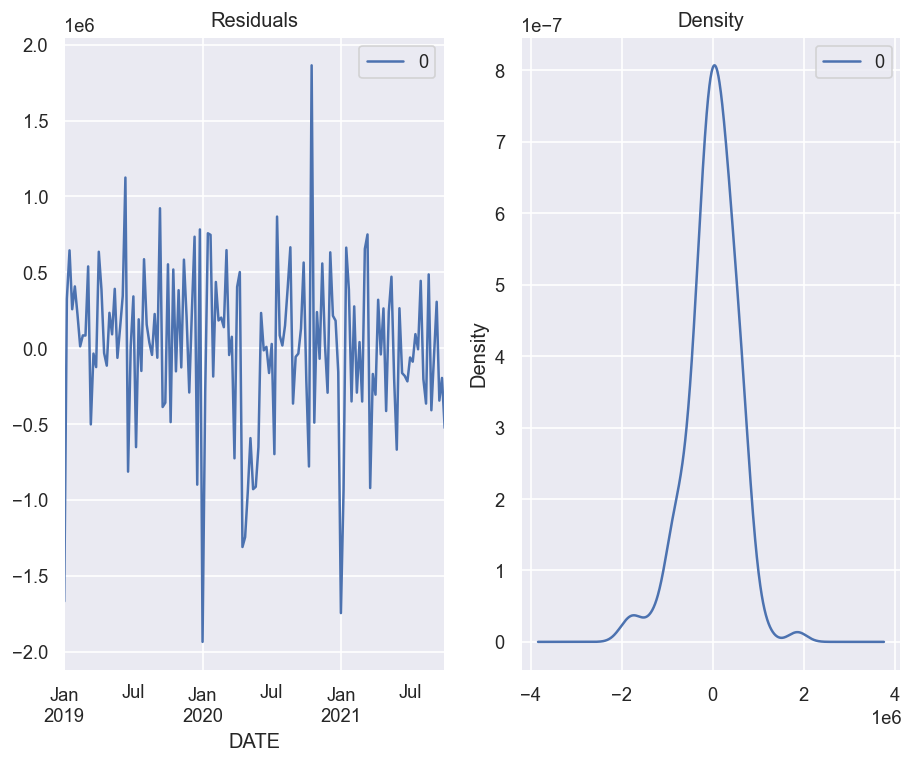

In [132]:
ploteo_residual(1,3,0,2)

##### Conclusion ARIMA, Empresa 1.

- Segun lo analizado nos daba para probar un AR = 3, I = 0 , MA = 1. Cuando probe ese modelo los coeficientes no podia rechazar la h0, es decir no tenia pruebas para decir que eran distintos a 0.

- Entonces decidi probar un AR = 3, I = 0, MA = 2, me dieron que todos los coeficientes eran significativos y los coeficientes eran invertibles (condicion necesaria para los MA), asi que como primer approach me quede conforme con los resultados.

- Luego plotee los residuos, aqui esperaba ver una varianza mas o menos uniforme y una media centrada en 0. A simple vista pareciera cumplir con estas condiciones, asi que no encuentro motivos para rechazar el modelo.

#### AUTOARIMA, Empresa 2.

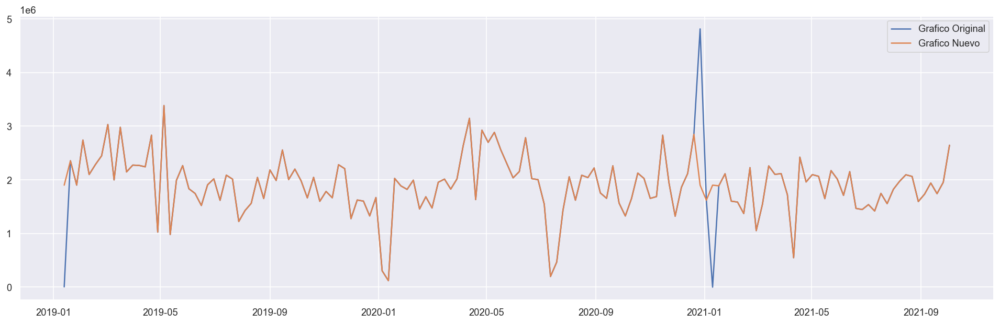

In [133]:
quitamosoutliers(2)

In [134]:
autoarima_W(2)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[4] intercept   : AIC=4252.224, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[4] intercept   : AIC=4254.450, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[4] intercept   : AIC=4224.326, Time=0.04 sec
 ARIMA(0,0,1)(0,0,1)[4] intercept   : AIC=4232.368, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[4]             : AIC=4557.007, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[4] intercept   : AIC=4222.326, Time=0.01 sec
 ARIMA(1,0,0)(0,0,1)[4] intercept   : AIC=4224.278, Time=0.04 sec
 ARIMA(1,0,0)(1,0,1)[4] intercept   : AIC=4226.158, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[4] intercept   : AIC=4222.618, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[4] intercept   : AIC=4222.672, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[4] intercept   : AIC=4231.251, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[4] intercept   : AIC=4224.334, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[4]             : AIC=4258.447, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[4] intercept
Total fit time: 0.377 seconds
                      

##### Conclusion AUTOARIMA, Empresa 2.

- El modelo plantaedo es un AR = 1, resto = 0.

- Los coeficientes son distintos de 0 los a un nivel de significancia del 1%.

- No me gusta que sea un modelo AR=1 , porque seria suponer que las ventas dependen solo de las ventas de la semana pasada, pero al ser un modelo simple voy a dejarlo asi.

#### ARIMA, Empresa 2.

Seguiremos trabajando en base al dataframe calculado en la seccion de AUTOARIMA, con quitamosoutliers.

In [135]:
testadfuller(2)

ADF Statistic: -5.857887305471612 
 p-value: 3.46540531791048e-07 
 Critical Values:
	1%: -3.4776006742422374
	5%: -2.882265832283648
	10%: -2.5778219289774156


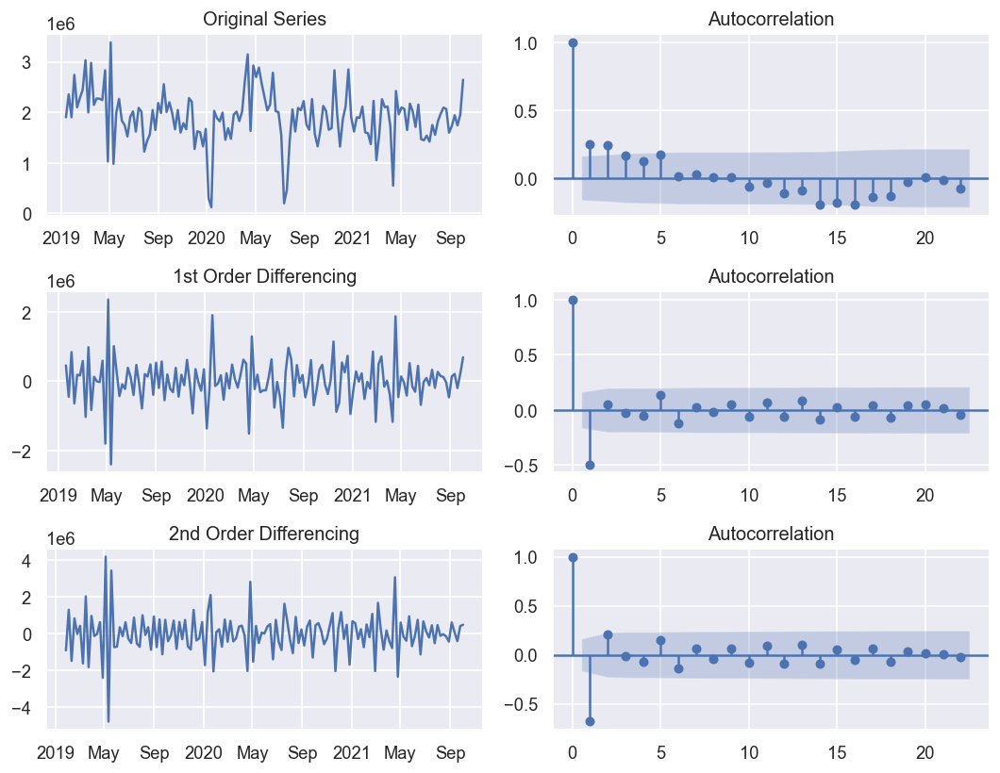

In [136]:
seteemos_AR(2)

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:1434: RuntimeWarning:

invalid value encountered in sqrt



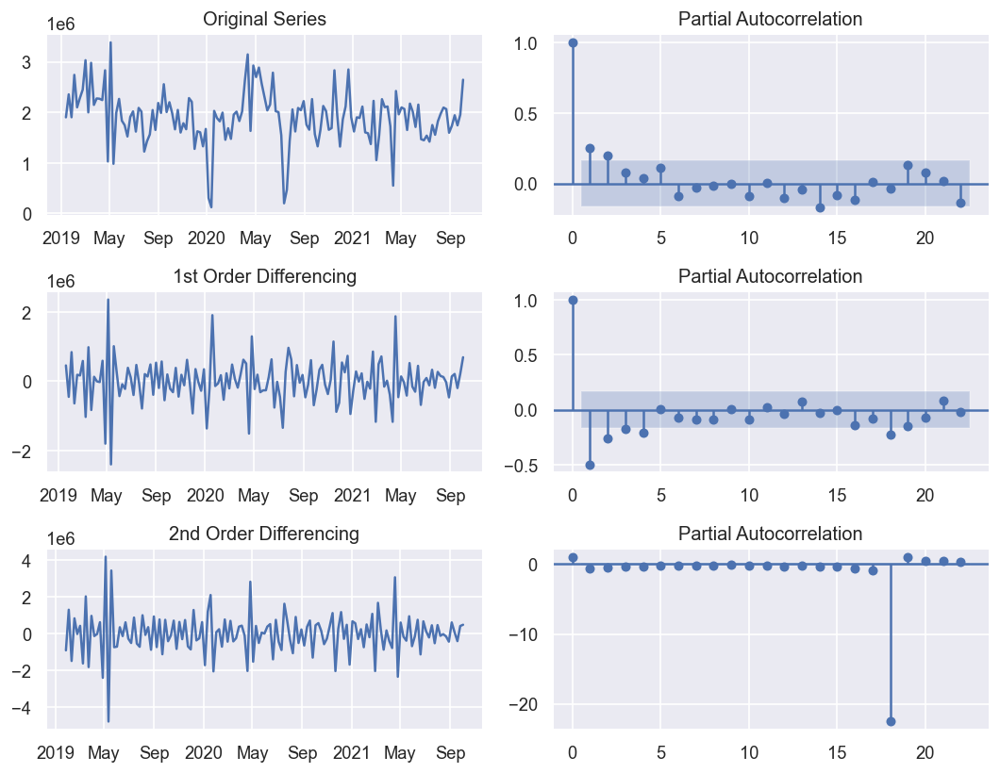

In [137]:
seteemos_MA(2)

In [138]:
# Modelo AR=2, MA=2 basados en los graficos de autocorrelaciones.
modelo_arima(2,2,0,2)

                               SARIMAX Results                                
Dep. Variable:             AMOUNT_USD   No. Observations:                  143
Model:                 ARIMA(2, 0, 2)   Log Likelihood               -2075.725
Date:                Tue, 12 Apr 2022   AIC                           4163.451
Time:                        14:20:58   BIC                           4181.228
Sample:                    01-13-2019   HQIC                          4170.674
                         - 10-03-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.907e+06   5.61e+04     33.962      0.000     1.8e+06    2.02e+06
ar.L1          1.9280      0.030     65.279      0.000       1.870       1.986
ar.L2         -0.9755      0.030    -32.760      0.0

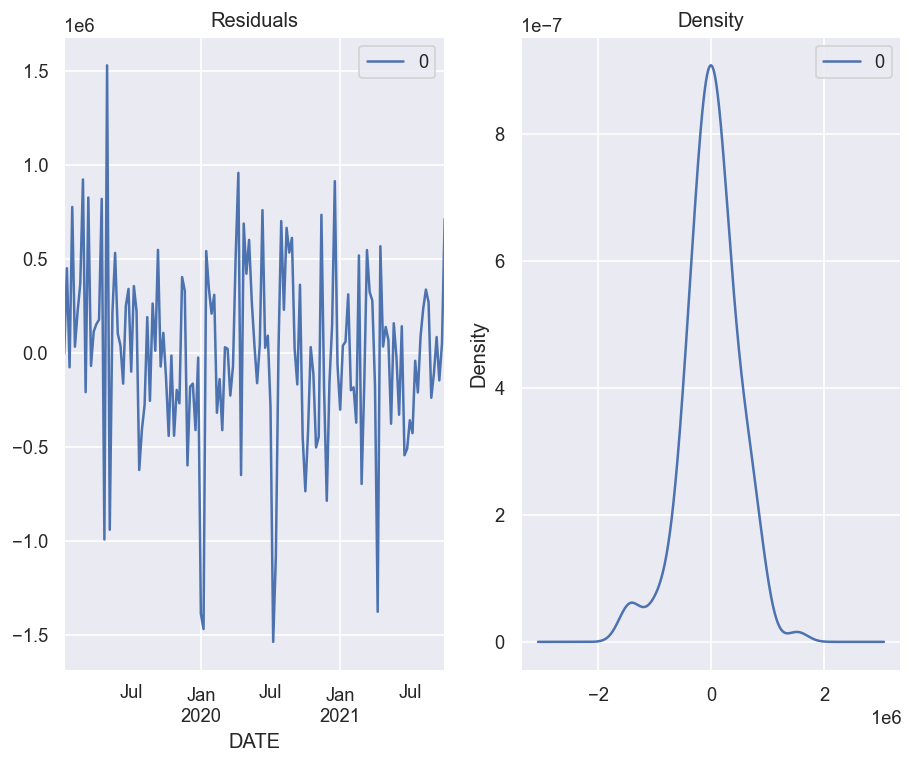

In [139]:
ploteo_residual(2,2,0,2)

##### Conclusion, ARIMA, Empresa 2.

- Es un modelo AR = 2, d=0, MA=2. 

- Con una significancia del 1% puedo suponer que sus coeficientes son distintos de 0.

- Luego plotee los residuos, aqui esperaba ver una varianza mas o menos uniforme y una media centrada en 0. A simple vista pareciera cumplir con estas condiciones, asi que no encuentro motivos para rechazar el modelo.

#### AUTOARIMA, Empresa 3.

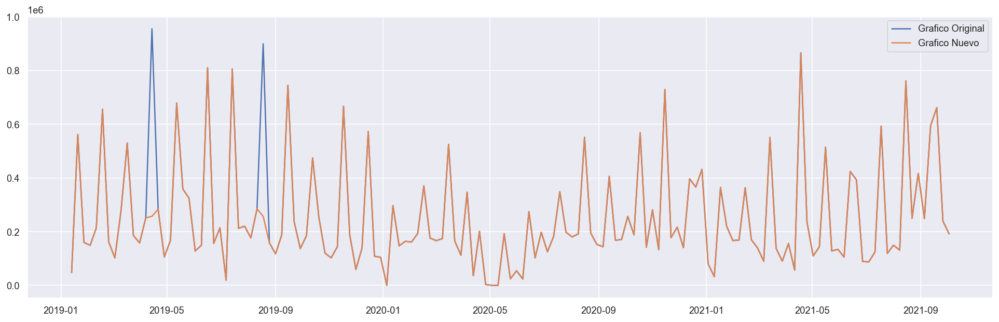

In [140]:
quitamosoutliers(3)

In [141]:
autoarima_W(3)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[4] intercept   : AIC=4252.224, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[4] intercept   : AIC=4254.450, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[4] intercept   : AIC=4224.326, Time=0.04 sec
 ARIMA(0,0,1)(0,0,1)[4] intercept   : AIC=4232.368, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[4]             : AIC=4557.007, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[4] intercept   : AIC=4222.326, Time=0.01 sec
 ARIMA(1,0,0)(0,0,1)[4] intercept   : AIC=4224.278, Time=0.02 sec
 ARIMA(1,0,0)(1,0,1)[4] intercept   : AIC=4226.158, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[4] intercept   : AIC=4222.618, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[4] intercept   : AIC=4222.672, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[4] intercept   : AIC=4231.251, Time=0.02 sec
 ARIMA(2,0,1)(0,0,0)[4] intercept   : AIC=4224.334, Time=0.04 sec
 ARIMA(1,0,0)(0,0,0)[4]             : AIC=4258.447, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[4] intercept
Total fit time: 0.340 seconds
                      

##### Conclusion, AUTOARIMA, Empresa 3.

- El modelo plantaedo es un AR = 1, resto = 0.

- Los coeficientes son distintos de 0 los a un nivel de significancia del 1%.

- No me gusta que sea un modelo AR=1 , porque seria suponer que las ventas dependen solo de las ventas de la semana pasada, pero al ser un modelo simple voy a dejarlo asi.

#### ARIMA, Empresa 3.

Seguiremos trabajando en base al dataframe calculado en la seccion de AUTOARIMA, con quitamosoutliers.

In [142]:
testadfuller(3)

ADF Statistic: -2.1998981176007413 
 p-value: 0.20628243636573962 
 Critical Values:
	1%: -3.4825006939887997
	5%: -2.884397984161377
	10%: -2.578960197753906


In [143]:
# Tengo que volver a diferenciar ya que en la primera no puede rechazar la hipotesis nula ni para nivel de significancia del 10%.
result = adfuller(Empresas_dict_A_W[3].AMOUNT_USD.diff().dropna())
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')
for key, value in result[4].items():
    print('Critial Values:')
    print(f'   {key}, {value}')

ADF Statistic: -3.7048231928668254
p-value: 0.004045820840730848
Critial Values:
   1%, -3.482920063655088
Critial Values:
   5%, -2.884580323367261
Critial Values:
   10%, -2.5790575441750883


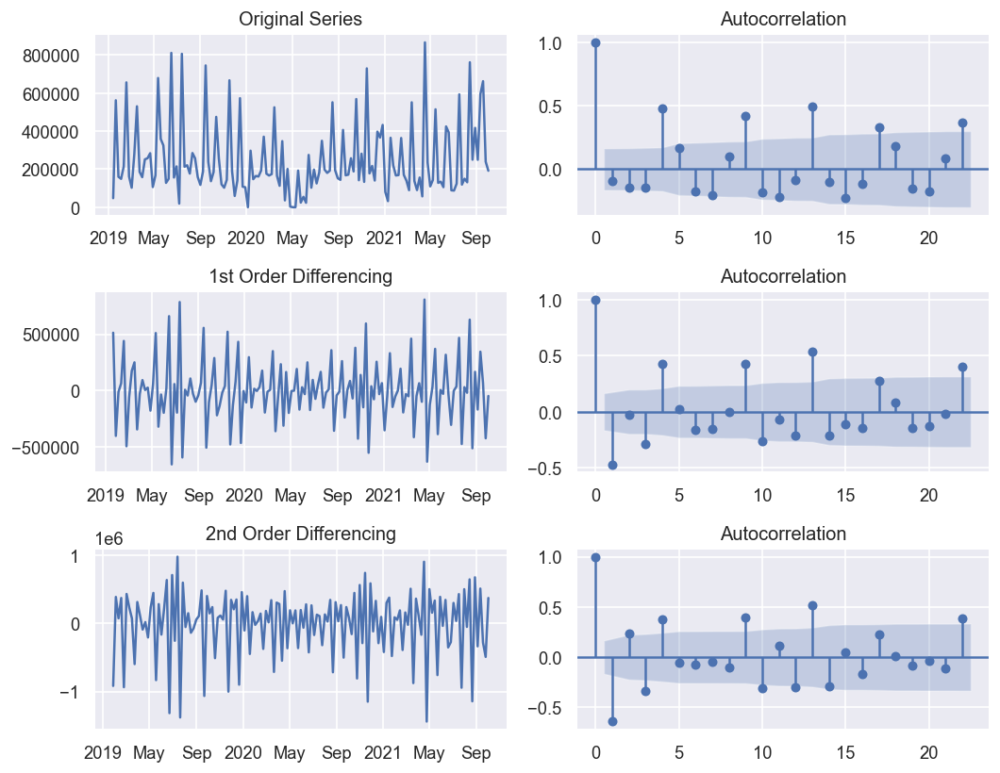

In [144]:
seteemos_AR(3)

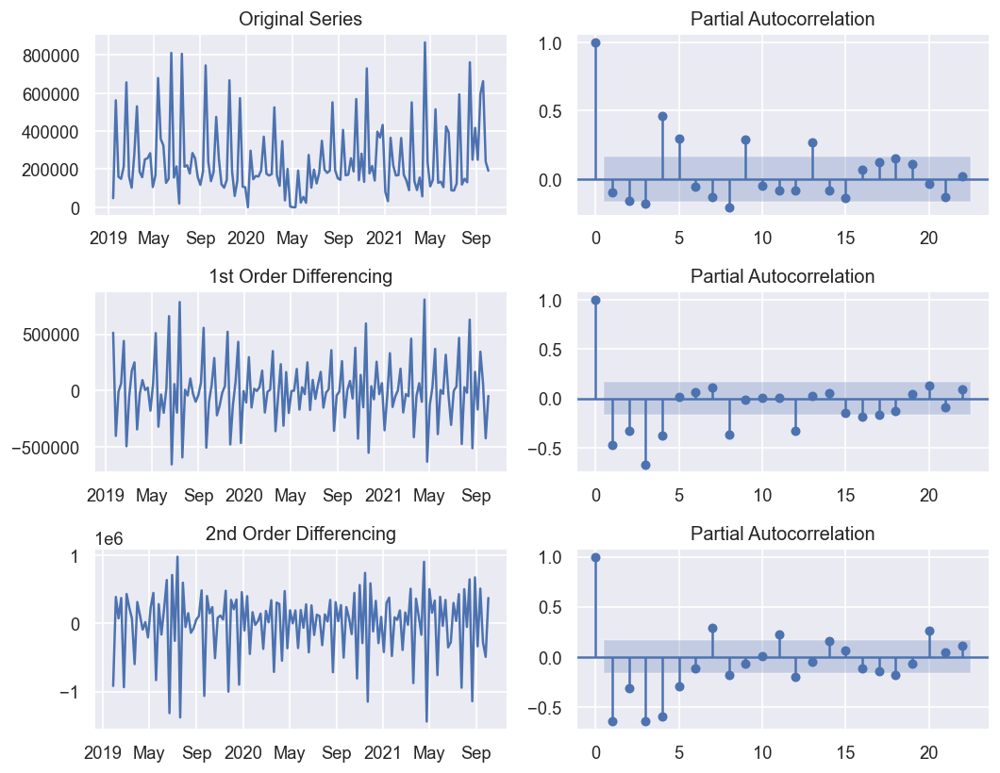

In [145]:
seteemos_MA(3)

In [146]:
modelo_arima(3,1,1,4)

                               SARIMAX Results                                
Dep. Variable:             AMOUNT_USD   No. Observations:                  143
Model:                 ARIMA(1, 1, 4)   Log Likelihood               -1925.255
Date:                Tue, 12 Apr 2022   AIC                           3862.509
Time:                        14:21:02   BIC                           3880.244
Sample:                    01-13-2019   HQIC                          3869.716
                         - 10-03-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1         -0.6193      0.355     -1.743      0.081      -1.315       0.077
ma.L1         -0.3581      0.298     -1.203      0.229      -0.941       0.225
ma.L2         -0.6283      0.310     -2.030      0.0

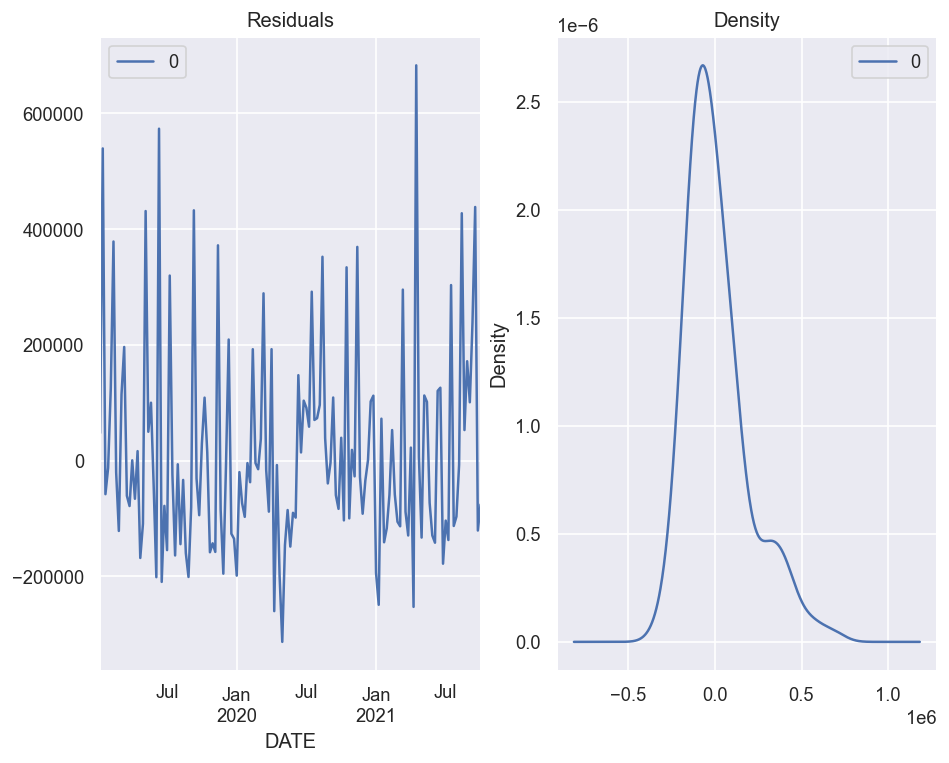

In [147]:
ploteo_residual(3,1,1,4)

##### Conclusion, ARIMA, Empresa 3.

- Tuvimos que diferenciar 1 vez dado que en nuestra serie original no pudimos rechazar que haya raices unitarias.

- Una vez diferenciada ya pudimos rechazar que haya raices unitarias, a un nivel de significancia del 1%, siendo nuestra serie estacionaria.

- El modelo AR=1,d=1,MA=1 tiene varios coeficientes que no podemos rechazar la h0:coef=0, por lo cual deberiamos seguir trabajando esta serie.

- Los residuos la media no esta centrada en 0, y la varianza no es uniforme, lo cual nos indicaria que deberiamos trabajar nuestro modelo tambien.

#### AUTOARIMA, Empresa 4.

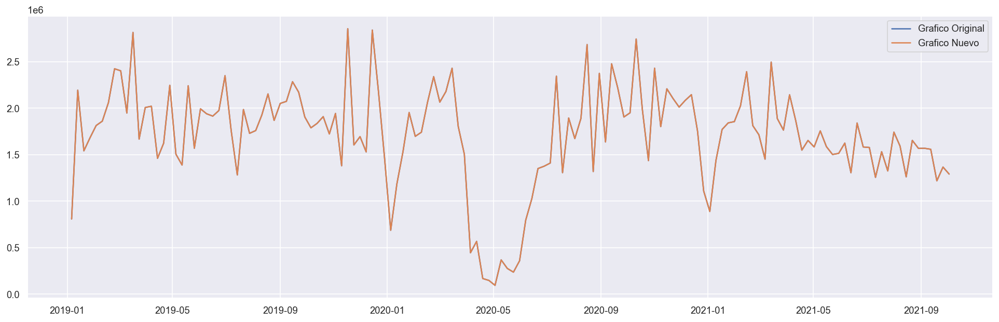

In [148]:
quitamosoutliers(4)

In [149]:
autoarima_W(4)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[4] intercept   : AIC=4252.224, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[4] intercept   : AIC=4254.450, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[4] intercept   : AIC=4224.326, Time=0.04 sec
 ARIMA(0,0,1)(0,0,1)[4] intercept   : AIC=4232.368, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[4]             : AIC=4557.007, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[4] intercept   : AIC=4222.326, Time=0.01 sec
 ARIMA(1,0,0)(0,0,1)[4] intercept   : AIC=4224.278, Time=0.03 sec
 ARIMA(1,0,0)(1,0,1)[4] intercept   : AIC=4226.158, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[4] intercept   : AIC=4222.618, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[4] intercept   : AIC=4222.672, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[4] intercept   : AIC=4231.251, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[4] intercept   : AIC=4224.334, Time=0.05 sec
 ARIMA(1,0,0)(0,0,0)[4]             : AIC=4258.447, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[4] intercept
Total fit time: 0.353 seconds
                      

##### Conclusion, AUTOARIMA, Empresa 4.

- Nuevamente el modelo plantaedo es un AR = 1, resto = 0.

- Los coeficientes son distintos de 0 los a un nivel de significancia del 1%.

- No me gusta que sea un modelo AR=1 , porque seria suponer que las ventas dependen solo de las ventas de la semana pasada, pero al ser un modelo simple voy a dejarlo asi. 

- Ya que los 4 modelos hayan sido iguales y encima un AR=1, me hace considerar que estoy por el camino incorrecto, y que deberia reveer los settings del AUTOARIMA, estudiarlo mas a fondo y modificarlo.

#### ARIMA, Empresa 4.

Seguiremos trabajando en base al dataframe calculado en la seccion de AUTOARIMA, con quitamosoutliers.

In [150]:
testadfuller(4)

ADF Statistic: -3.741008771654945 
 p-value: 0.0035719418061682345 
 Critical Values:
	1%: -3.477261624048995
	5%: -2.8821181874544233
	10%: -2.5777431104939494


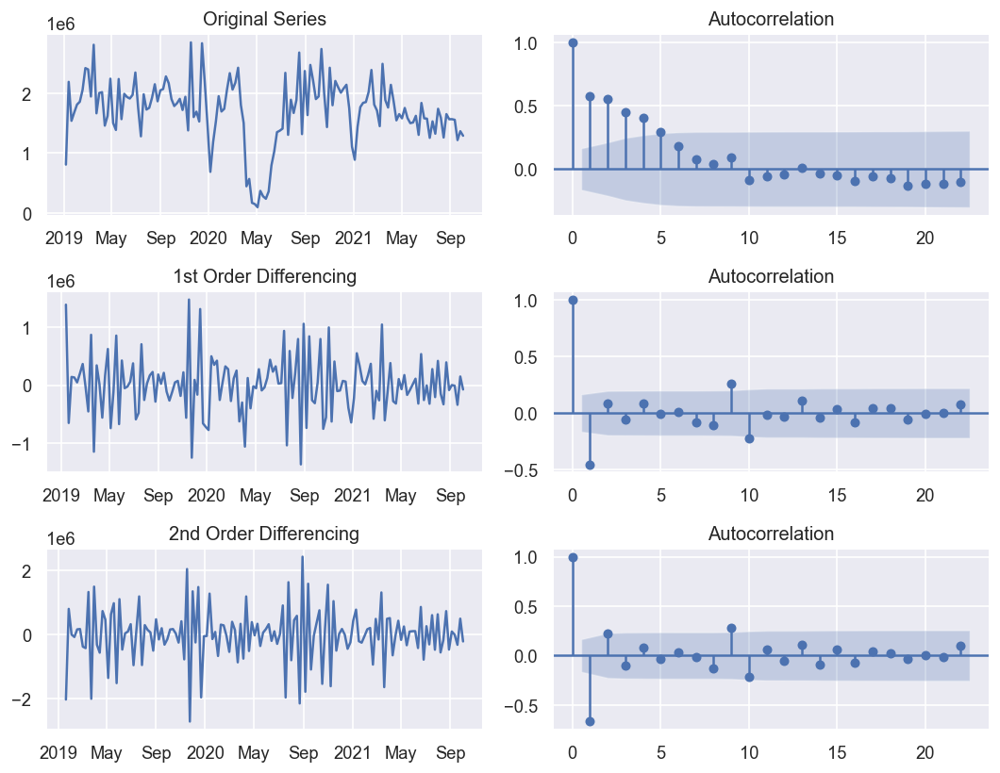

In [151]:
seteemos_AR(4)

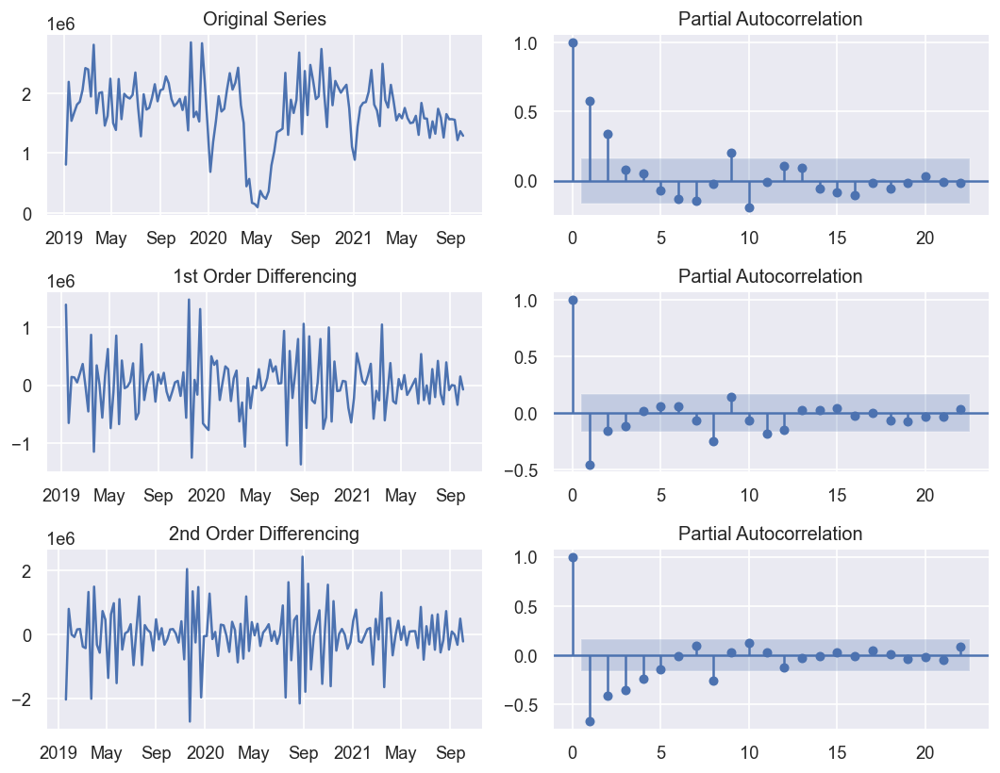

In [152]:
seteemos_MA(4)

In [153]:
modelo_arima(4,4,0,2)

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



                               SARIMAX Results                                
Dep. Variable:             AMOUNT_USD   No. Observations:                  144
Model:                 ARIMA(4, 0, 2)   Log Likelihood               -2063.052
Date:                Tue, 12 Apr 2022   AIC                           4142.104
Time:                        14:21:05   BIC                           4165.862
Sample:                    01-06-2019   HQIC                          4151.758
                         - 10-03-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.706e+06   1.38e+05     12.379      0.000    1.44e+06    1.98e+06
ar.L1          0.5109      0.091      5.636      0.000       0.333       0.689
ar.L2         -0.6239      0.117     -5.313      0.0

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/statsmodels/tsa/statespace/sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

/Users/cfontana/opt/anaconda3/lib/python3.9/site-packages/statsmodels/base/model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



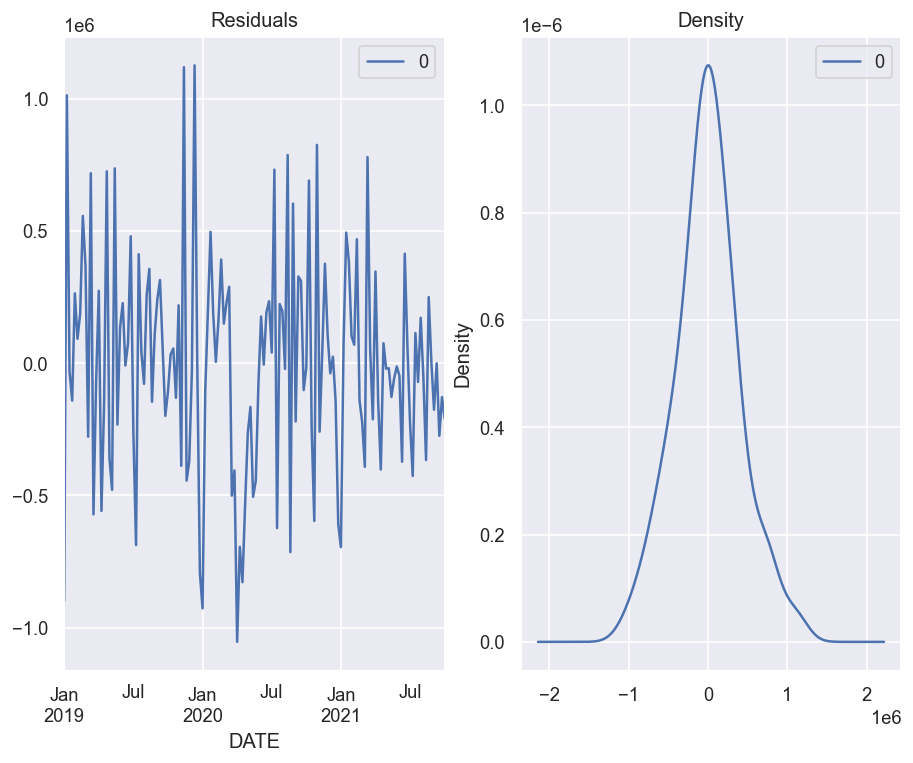

In [154]:
ploteo_residual(4,4,0,2)

##### Conclusion, ARIMA, Empresa 4.

- El modelo fue un AR=4, d=0, MA=2.

- Interesante que sea un AR=4, porque las ventas de la semana vienen influenciadas por las ventas del ultimo mes, e incluso mas llamativo es que el AR=2 sea de coeficiente negativo.

- MA=2 un poco la misma idea, las ventas vienen influenciados por los promedios semanales, de las ultimas 2 semanas, pero de vuelta negativamente cuando se incluye a la 2da semana.

- Con una significancia del 5% puedo suponer que sus coeficientes son distintos de 0.

- Los residuos estan centrados en 0, la varianza estaria al limite de decir que es uniforme o no.



#### AUTOARIMA, Empresa 5.

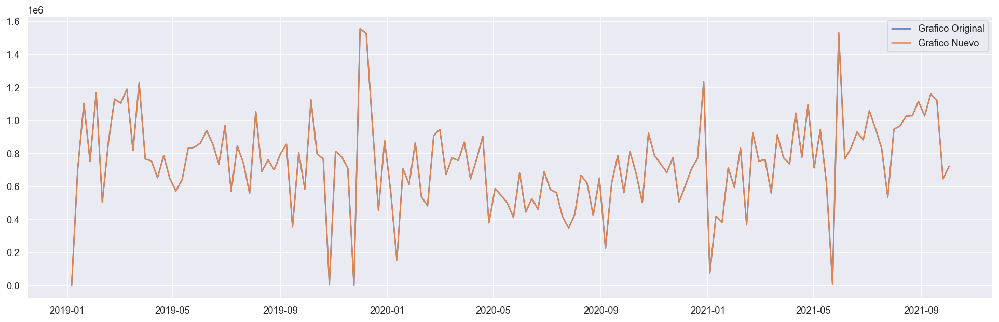

In [155]:
quitamosoutliers(5)

In [156]:
autoarima_W(5)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[4] intercept   : AIC=4252.224, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[4] intercept   : AIC=4254.450, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[4] intercept   : AIC=4224.326, Time=0.07 sec
 ARIMA(0,0,1)(0,0,1)[4] intercept   : AIC=4232.368, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[4]             : AIC=4557.007, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[4] intercept   : AIC=4222.326, Time=0.02 sec
 ARIMA(1,0,0)(0,0,1)[4] intercept   : AIC=4224.278, Time=0.02 sec
 ARIMA(1,0,0)(1,0,1)[4] intercept   : AIC=4226.158, Time=0.08 sec
 ARIMA(2,0,0)(0,0,0)[4] intercept   : AIC=4222.618, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[4] intercept   : AIC=4222.672, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[4] intercept   : AIC=4231.251, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[4] intercept   : AIC=4224.334, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[4]             : AIC=4258.447, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[4] intercept
Total fit time: 0.342 seconds
                      

##### Conclusion, AUTOARIMA, Empresa 5.

- Nuevamente las mismas conclusioens de todos los otros AUTOARIMA, a este punto ya no tiene sentido seguir analizandolos, claramente deberiamos comenzar de 0 con los AUTOARIMA cambiando los settings, los resultados que arroja no estan funcionando para nada.

- Dato interesante: Esto podria haber previsto o aunque sea ser esperable luego de testear los primeros AUTOARIMA, no seria una prueba infalible, pero levantaria seguramente nuestros alertas, y nos ayudaria a darnos cuentas previamente que no esta funcionando.

#### ARIMA, Empresa 5.

Seguiremos trabajando en base al dataframe calculado en la seccion de AUTOARIMA, con quitamosoutliers.

In [157]:
testadfuller(5)

ADF Statistic: -4.12260565993097 
 p-value: 0.0008884692310984425 
 Critical Values:
	1%: -3.4779446621720114
	5%: -2.8824156122448983
	10%: -2.577901887755102


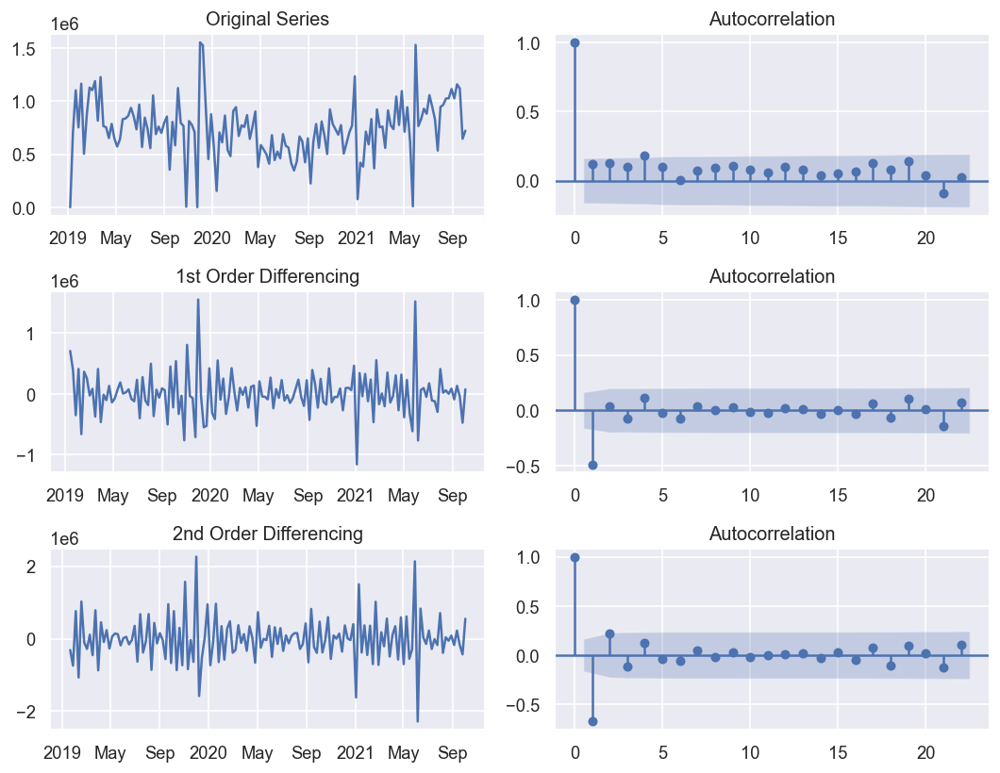

In [158]:
seteemos_AR(5)

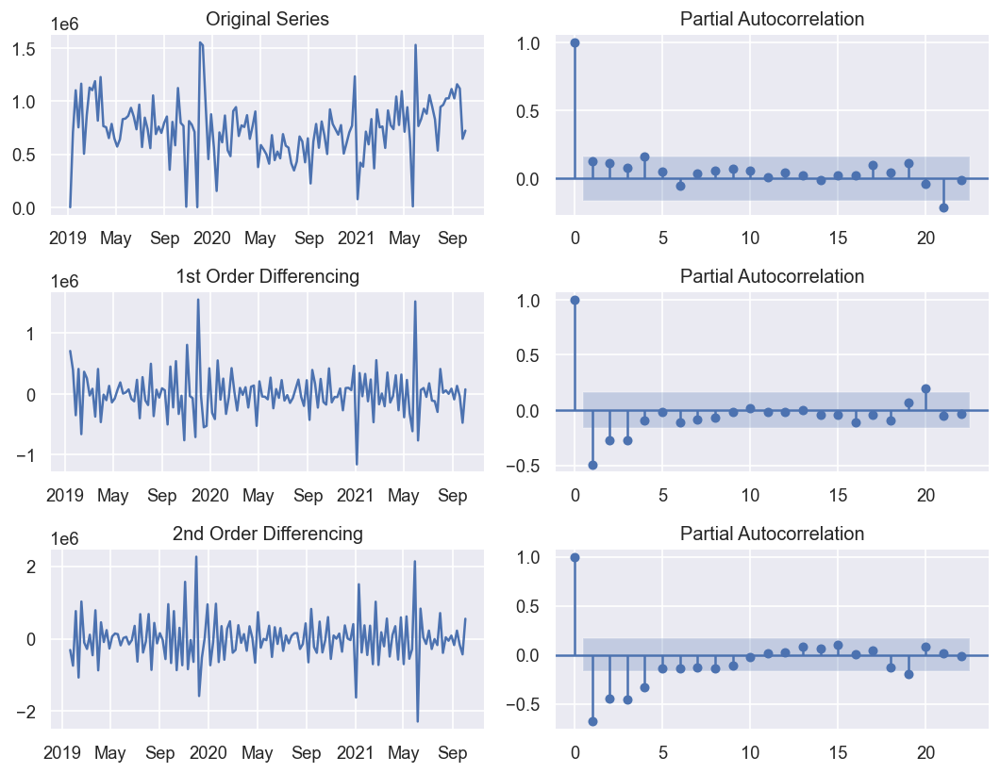

In [159]:
seteemos_MA(5)

##### Conclusion, ARIMA, Empresa 5.

- Basado en los graficos, la respuesta es un ARIMA con todos los parametros = 0, aqui deberia investigar mejor como ajustar esto.

- En un principio lo que esto nos diria es que nuestras ventas para la Empresa 5 no dependen del tiempo, cosa que no me cierra del todo. Pero demos esto como supuesto podriamos aplicar para explicar estas ventas Linear Regression, Random Forest Regressor o Gradient Boosting.

- Sin embargo lo que mas me interesaria en caso de enfrentarme a esta situacion, seria ver si se puede ajustar la serie de alguna forma, hacer transformaciones, o realmente porque estoy frente a una serie que pareciera no depender de la variable tiempo.

#### AUTOARIMA, Empresa 6.

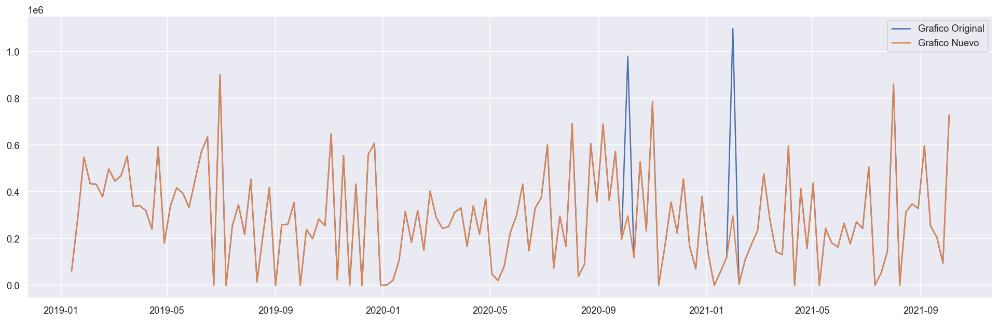

In [160]:
quitamosoutliers(6)

In [161]:
autoarima_W(6)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,1)[4] intercept   : AIC=4252.224, Time=0.03 sec
 ARIMA(0,0,0)(0,0,0)[4] intercept   : AIC=4254.450, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[4] intercept   : AIC=4224.326, Time=0.06 sec
 ARIMA(0,0,1)(0,0,1)[4] intercept   : AIC=4232.368, Time=0.02 sec
 ARIMA(0,0,0)(0,0,0)[4]             : AIC=4557.007, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[4] intercept   : AIC=4222.326, Time=0.01 sec
 ARIMA(1,0,0)(0,0,1)[4] intercept   : AIC=4224.278, Time=0.02 sec
 ARIMA(1,0,0)(1,0,1)[4] intercept   : AIC=4226.158, Time=0.09 sec
 ARIMA(2,0,0)(0,0,0)[4] intercept   : AIC=4222.618, Time=0.02 sec
 ARIMA(1,0,1)(0,0,0)[4] intercept   : AIC=4222.672, Time=0.02 sec
 ARIMA(0,0,1)(0,0,0)[4] intercept   : AIC=4231.251, Time=0.01 sec
 ARIMA(2,0,1)(0,0,0)[4] intercept   : AIC=4224.334, Time=0.03 sec
 ARIMA(1,0,0)(0,0,0)[4]             : AIC=4258.447, Time=0.01 sec

Best model:  ARIMA(1,0,0)(0,0,0)[4] intercept
Total fit time: 0.344 seconds
                      

##### Conclusion, AUTOARIMA, Empresa 6.

- Para sorprendernos nuevamente nos arroja un AR=1, resto =0. 

- No hay mucho analisis que hacer, mas que nuestro no modelo no es un buen predictor, posiblemente si dividieramos en train y test, su poder predictivo veriamos que es bastante bajo.

#### ARIMA, Empresa 6.

Seguiremos trabajando en base al dataframe calculado en la seccion de AUTOARIMA, con quitamosoutliers.

In [162]:
testadfuller(6)

ADF Statistic: -3.6177946302894615 
 p-value: 0.005429804910923867 
 Critical Values:
	1%: -3.47864788917503
	5%: -2.882721765644168
	10%: -2.578065326612056


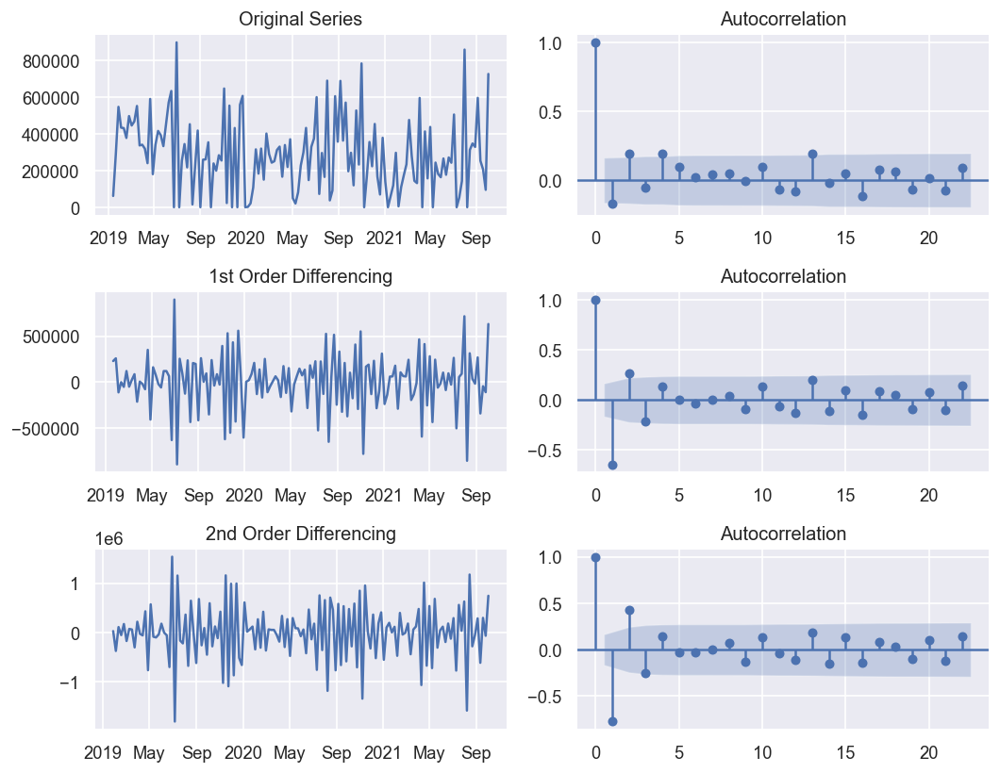

In [163]:
seteemos_AR(6)

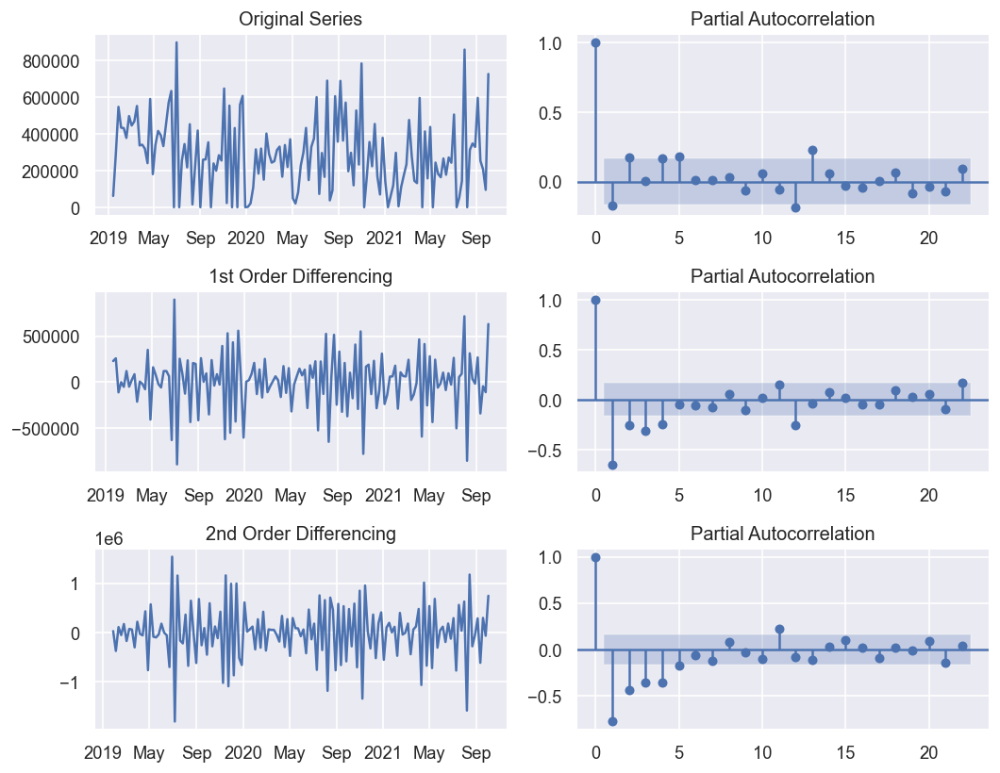

In [164]:
seteemos_MA(6)

In [165]:
modelo_arima(6,1,0,1)

                               SARIMAX Results                                
Dep. Variable:             AMOUNT_USD   No. Observations:                  143
Model:                 ARIMA(1, 0, 1)   Log Likelihood               -1945.658
Date:                Tue, 12 Apr 2022   AIC                           3899.315
Time:                        14:21:11   BIC                           3911.167
Sample:                    01-13-2019   HQIC                          3904.131
                         - 10-03-2021                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const       2.871e+05   1.51e+04     18.992      0.000    2.58e+05    3.17e+05
ar.L1         -0.7154      0.213     -3.361      0.001      -1.132      -0.298
ma.L1          0.5446      0.254      2.144      0.0

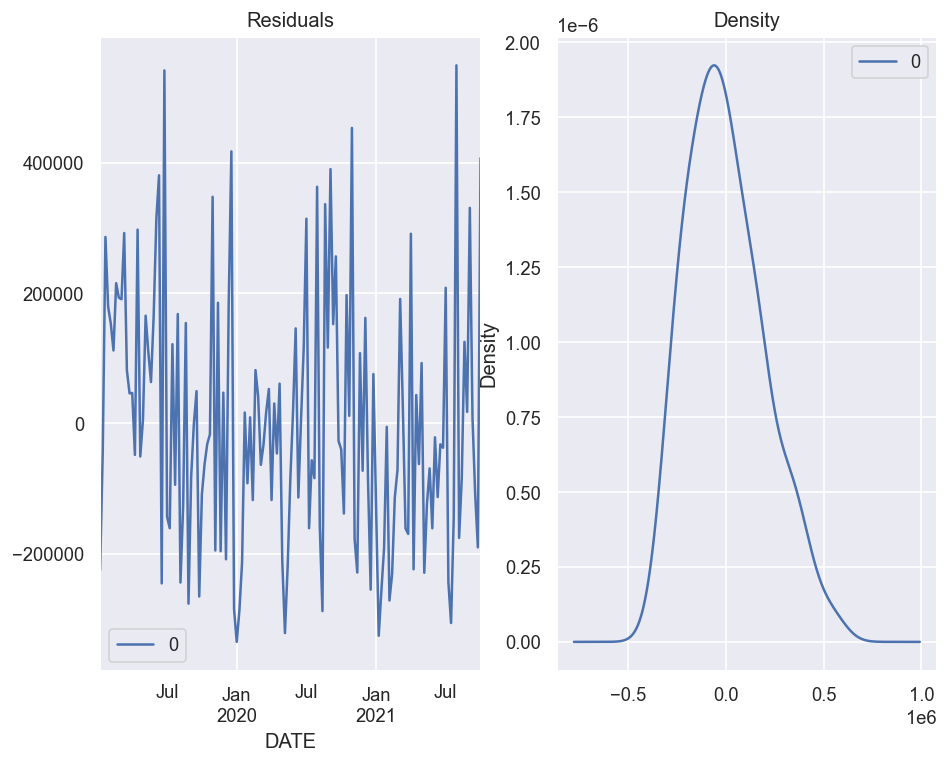

In [166]:
ploteo_residual(6,1,0,1)

##### Conclusion, ARIMA, Empresa 6.

- Un modelo AR=1, d=0, MA=1.

- Los coeficientes son distintos de 0, con una significancia del 5%.

- Interesante ver que el AR=1 tiene coeficiente negativo, esto nos dice que nuestras ventas de esta semana tienen una relacion negativa con la semana pasada, es decir mientras mas haya vendido la semana pasada, menos voy a vender esta semana y viceversa.

- Al mismo tiempo el MA=1, es positivo.

- La media esta levemente corrido del eje 0, y la varianza no pareciera uniforme. Esto nos indicaria que deberiamos reveer nuestro modelo, con diferenciacion o alguna transformacion, para ver si lo podemos mejorar.

## Modelos Incorrectos.

- Aqui hice unos modelos, simplemente para Empresa 1. Estos modelos no serian correctos, dado que no contemplan una serie de tiempo, es decir son modelos donde las variables no dependen del periodo del tiempo en que se evaluen. Podriamos aplicar algunos de estos modelos si las variables que tuvieramos para predecir, sabriamos con certeza sus valores futuros.

- Aqui al hacer resampling mensual nos quedan AMOUNT_USD y CANTIDAD_DE_ORDENES, asi que por ejemplo podriamos tratar de aplicar estos modelos si supieramos para los meses futuros las cantidades de ordenes que vamos a tener.

- Tambien seria interesante hacer estos modelos si tuvieramos para los meses futuros otras variables que podamos intuir que nos ayuden a predecir las ventas como por ejemplo : Headcount de las empresas exportadoras, cantidad de contratos de venta para esos meses, nuevos posibles contratos (deberiamos ajustar por posibilidad), valor del cambio con el dolar, precio del petroleo, y cualquier otra variable que podamos intuir que podria servirnos para explicar el monto que se va a facturar para esos meses.

- Es decir estos modelos serian interesantes para tratar de conocer el Monto facturado para los meses 10,11 y 12 de 2021, si por ejemplo tuvieramos los otros datos para esos meses. Puede pasarnos que son variables que nos brindan esas empresas, entonces ahi podriamos considerar utilizar los modelos utilizados a continuacion, dado que la variable tiempo ya no seria una determinante sino que seria algo conocido.

### Seteo para estos modelos.

In [167]:
# Obtenemos el nombre de las empresas.
Empresas_names = Exportaciones_encod.EMPRESAS.sort_values().unique()

# Creamos un dict para las empresas.
Empresas_dict_M = {elem : pd.DataFrame() for elem in Empresas_names}

# Iteramos sobre el dict para unir cada key con su empresa correspondiente.
for key in Empresas_dict_M.keys():
    Empresas_dict_M[key] = Exportaciones_encod[:][Exportaciones_encod.EMPRESAS == key]

In [168]:
# Iteramos para que los cambios apliquen a todos los Dataframes de nuestro dict.
for key in Empresas_dict_M.keys():
    # Hacemos resampling mensual para todas las empresas.
    Empresas_dict_M[key] = Empresas_dict_M[key].resample('M').sum()

    # Dropeamos para nuestros Dataframes dentro del dict la columna empresas, ya que no posee mucho sentido, ya que es la sumatoria de que empresa es cada una.
    Empresas_dict_M[key] = Empresas_dict_M[key].drop('EMPRESAS', axis=1, errors='ignore')

In [169]:
Empresas_dict_M[1].reset_index(inplace=True)
Empresas_dict_M[1]

,DATE,AMOUNT_USD,CANTIDAD_DE_ORDENES
0,2019-01-31,5750092,434
1,2019-02-28,9798288,811
2,2019-03-31,6846614,659
3,2019-04-30,8251012,636
4,2019-05-31,9752505,754
5,2019-06-30,8397144,635
6,2019-07-31,8404076,654
7,2019-08-31,7790820,585
8,2019-09-30,7491077,559
9,2019-10-31,9312151,772


In [170]:
X = Empresas_dict_M[1]['CANTIDAD_DE_ORDENES']
y = Empresas_dict_M[1]['AMOUNT_USD']
X = X.values.reshape(-1, 1)

In [171]:
from sklearn.model_selection import cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
def train(model, X, y):
    # train-test split
    x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=23, test_size=0.2)
    model.fit(x_train, y_train)
    
    # predict the results
    pred = model.predict(x_test)
    pred_real = model.predict(X)
    
    # cross validation
    cv_score = cross_val_score(model, X, y, scoring='neg_mean_squared_error', cv=5)
    cv_score = np.abs(np.mean(cv_score))
    
    print("Results")
    print("MSE:", np.sqrt(mean_squared_error(y_test, pred)))
    print("CV Score:", np.sqrt(cv_score))
    print('predicted response:', pred_real, sep='\n')

#### Empresa 1, con resample = Month

##### Linear Regression

In [172]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
train(model, X, y)
print('R2 score:', model.score(X,y))
plt.show()

Results
MSE: 598482.5014613903
CV Score: 1048210.2218787374
predicted response:
[ 6311828.2259707  10758076.5426382   8965424.70143539  8694168.17283233
 10085832.10218715  8682374.41071916  8906455.89086951  8092686.30506034
  7786048.49011775 10298119.82022432  7550173.24785422  7149185.33600623
  6288240.70174435  7939367.39758904  8281386.49887116  3269037.6007712
  1205129.23096533  5356533.49480342  7927573.63547587  7915779.87336269
  7986542.44604175  7786048.49011775  7184566.62234576  8812105.7939641
  5203214.58733212  5698552.59608553  7432235.62672246  5969809.12468859
  6264653.177518    7703492.15532552  6429765.84710247  7691698.39321234
  5922634.07623588]
R2 score: 0.854698622040933


##### Modelo OLS

In [173]:
import pandas as pd
import numpy as np
from sklearn import datasets, linear_model
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from scipy import stats

X2 = sm.add_constant(X)
est = sm.OLS(y, X2)
est2 = est.fit()
print(est2.summary())

                            OLS Regression Results                            
Dep. Variable:             AMOUNT_USD   R-squared:                       0.856
Model:                            OLS   Adj. R-squared:                  0.851
Method:                 Least Squares   F-statistic:                     184.0
Date:                Tue, 12 Apr 2022   Prob (F-statistic):           1.40e-14
Time:                        14:21:12   Log-Likelihood:                -494.12
No. Observations:                  33   AIC:                             992.2
Df Residuals:                      31   BIC:                             995.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.255e+06   4.73e+05      2.654      0.0

##### Random Forest Regressor

In [174]:
from sklearn.ensemble import RandomForestRegressor
model = RandomForestRegressor()
train(model, X, y)
print('R2 score:', model.score(X,y))

Results
MSE: 696676.8174136967
CV Score: 1358570.2251527144
predicted response:
[6075774.12 9521296.76 7642460.35 8463525.21 9302535.11 8510287.45
 8187572.05 8220809.6  7502385.12 9302535.11 8035931.68 7946638.86
 6471796.52 8653499.89 8237469.62 2426883.16 1124712.86 5701008.4
 8618027.27 8618027.27 8878565.   7502385.12 7869694.02 9709517.28
 5701008.4  6091720.39 8266194.22 5935589.16 6471796.52 7443952.32
 6545820.6  7699578.72 5935589.16]
R2 score: 0.9483809791768859


##### Gradient Boosting

In [175]:
import xgboost as xgb

In [176]:
# Create the DMatrix from X and y: churn_dmatrix
churn_dmatrix = xgb.DMatrix(data=X, label=y)

# Create the parameter dictionary: params
params = {"objective":"reg:linear", "max_depth":3}

# Perform cross-validation: cv_results
cv_results = xgb.cv(dtrain=churn_dmatrix, params=params, 
                  nfold=3, num_boost_round=5, 
                  metrics="error", as_pandas=True, seed=123)

# Print cv_results
print(cv_results)

# Print the accuracy
print(((1-cv_results["test-error-mean"]).iloc[-1]))

[14:21:12] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/objective/regression_obj.cu:188: reg:linear is now deprecated in favor of reg:squarederror.
[14:21:12] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/objective/regression_obj.cu:188: reg:linear is now deprecated in favor of reg:squarederror.
[14:21:12] WARNING: /Users/runner/miniforge3/conda-bld/xgboost-split_1645117948562/work/src/objective/regression_obj.cu:188: reg:linear is now deprecated in favor of reg:squarederror.
   train-error-mean  train-error-std  test-error-mean  test-error-std
0        -7387649.0    233589.865829    -7.387648e+06   467180.092306
1        -7387649.0    233589.865829    -7.387648e+06   467180.092306
2        -7387649.0    233589.865829    -7.387648e+06   467180.092306
3        -7387649.0    233589.865829    -7.387648e+06   467180.092306
4        -7387649.0    233589.865829    -7.387648e+06   467180.092306
7387649.333333333


#### Resultados modelo Empresa 1

Podemos observar que obtuvimos un R alto y podriamos estar contentos con el modelo. La cuestion pasa porque el modelo predice el monto de facturacion basado en la cantidad de ordenes que tiene la empresa 1, lo cual tiene todo sentido y mucho poder predictivo si tenemos el numero de ordenes que vamos a tener. He aqui la cuestion el modelo, no estaria prediciendo nuestra futura facturacion, solo puede predecir la facturacion para x cantidad de ordenes. Esto nos hace pensar que las variables que tenemos, PRODUCT_DESCRIPTION, DESTINATION_COUNTRY, EMPRESAS (TAX_ID) solo nos pueden ayudar a predecir cual sera el monto estimado de facturacion para determinada cantidad de ordenes, pero no nos ayudan a predecir nada si no sabemos el numero de ordenes que esperamos. Aqui necesitaria nuevas variables de cada empresa para intentar predecir su demanda y la oferta que pueden abastecer. Por ejemplo cantidad de empleados en nomina ese mes, cantidad de maquinas dispponibles, cantidad de clientes, analisis de la demanda de cada cliente y variables de contexto por ejemplo ya que son exportaciones el precio del petroleo y como esto afectaria su competencia en el precio con otras ofertas mas cercanas o lejanas.